# NETW 1013 Clustering Project

**Objective:**
The objective of this project is to teach students how to apply clustering to real datasets.

You should be able to answer the following questions and provide reasonable justification for your answers:
* Which clustering approach have you decided to use on each dataset?
* Compare between Kmeans, Hierarchal and DBScan.
* Discuss how you tuned your clustering hyperparameters to achieve the best cluster assignment?
* What is the effect of different distance functions on the calculated clusters?
* How did you evaluate the performance of different clustering techniques on different datatsets?
* Visualize your output where applicable.
* What is the effect of scaling on the performance of clustering techniques?






Running this project requires the following imports:

In [1]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *

from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans

from sklearn.metrics import silhouette_score

%matplotlib inline
# Please refer to the sklearn documentation to learn more about the different parameters for each clustering technique.

In [2]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1], cmap = 'plasma',alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = 'black' , marker = 'x', s = 100)

def display_agglo(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],cmap = 'plasma',alpha = alpha,s=s)

## Multi Blob Data Set
* The dataset generated below is known to be best clustered into 6 clusters.
* Cluster the data set below using the three different clustering techniques discussed in the course.
* Visualize your clustering output in each step of your work.



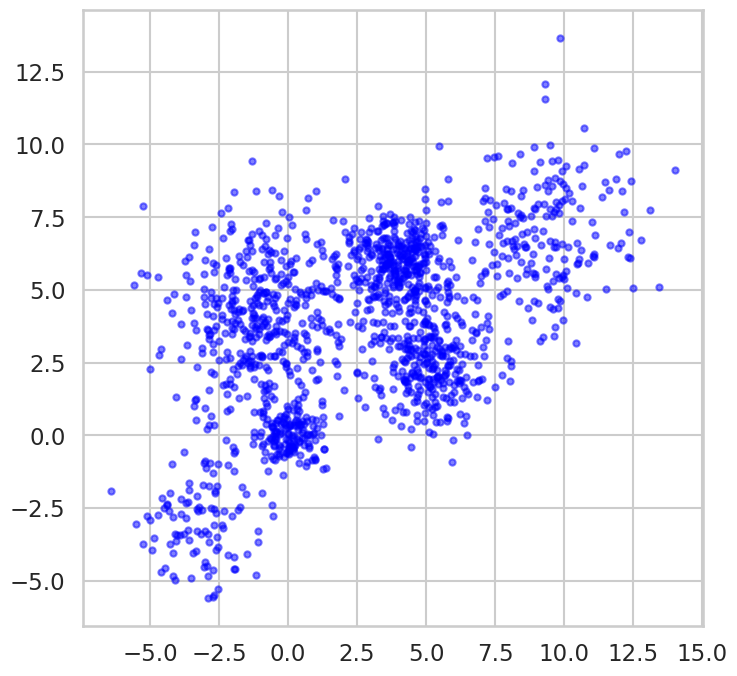

In [3]:
#Data Generation and Visualization
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans
* Use Kmeans with different values of K to cluster the above data.
* Display the outcome of each value of K.
* Plot distortion function versus K and choose the approriate value of K.
* Plot the silhouette_score versus K and use it to choose the best K.
* Store the silhouette_score for the best K for later comparison with other clustering techniques.

* **Comment on the effect of centroid initialization on cluster assignment.**
* Hint: Lookup k-means++ .

In [ ]:
sum2_dist = []
scores = []

for k in range(2,10):
    model = KMeans(n_clusters=k, random_state=42)
    labels = model.fit_predict(Multi_blob_Data)
    sum2_dist.append(model.inertia_)
    scores.append(silhouette_score(Multi_blob_Data, labels))

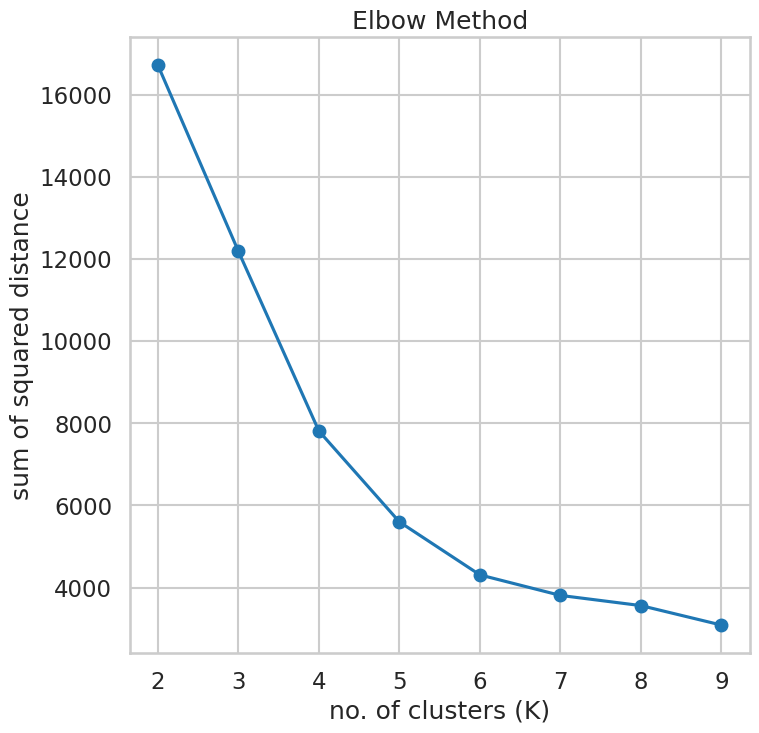

In [ ]:
plt.plot(range(2,10), sum2_dist, marker='o')
plt.xlabel('no. of clusters (K)')
plt.ylabel('sum of squared distance')
plt.title('Elbow Method')
plt.show()

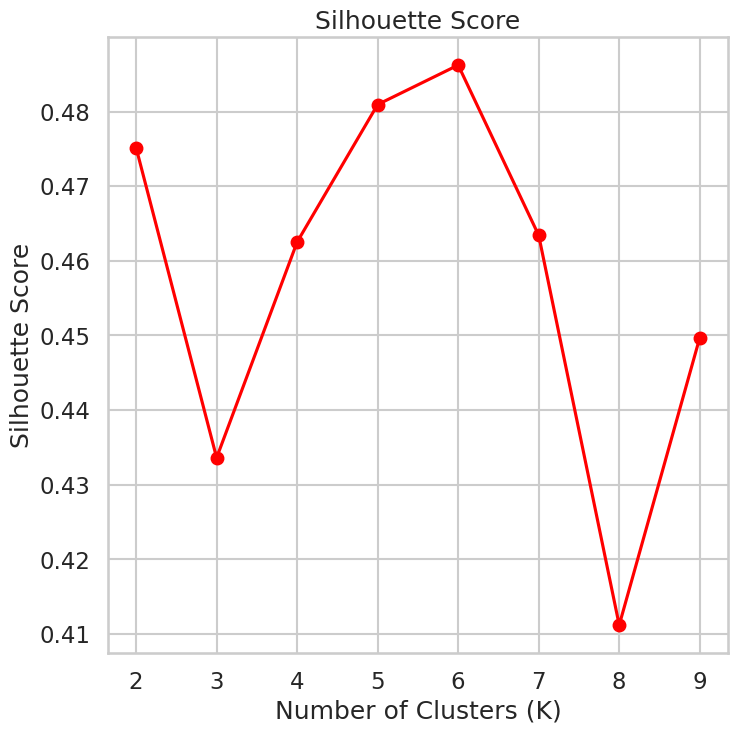

In [ ]:
plt.plot(range(2,10), scores, marker='o', color='red')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score')
plt.show()

[[-1.15236301  4.41425601]
 [ 3.84264496  5.93386566]
 [-1.27229641 -0.89588143]
 [10.29032386  8.31831164]
 [ 5.08904655  2.3108892 ]
 [ 8.59159366  5.95073898]]
[[-1.26279662  4.70895346]
 [ 9.36856474  7.00625988]
 [-0.27312711  0.61311115]
 [ 5.18118901  2.3624744 ]
 [ 3.84811823  5.92599202]
 [-3.16735394 -3.03549079]]
[[ 5.18118901  2.3624744 ]
 [-1.25319383  4.63140964]
 [-3.16735394 -3.03549079]
 [ 3.85392481  5.9328261 ]
 [ 9.36856474  7.00625988]
 [-0.22841644  0.52884939]]


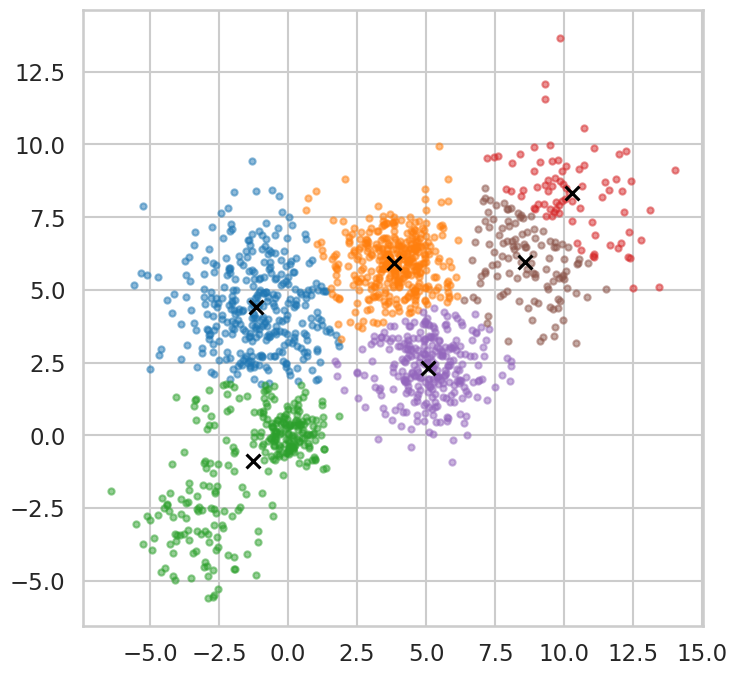

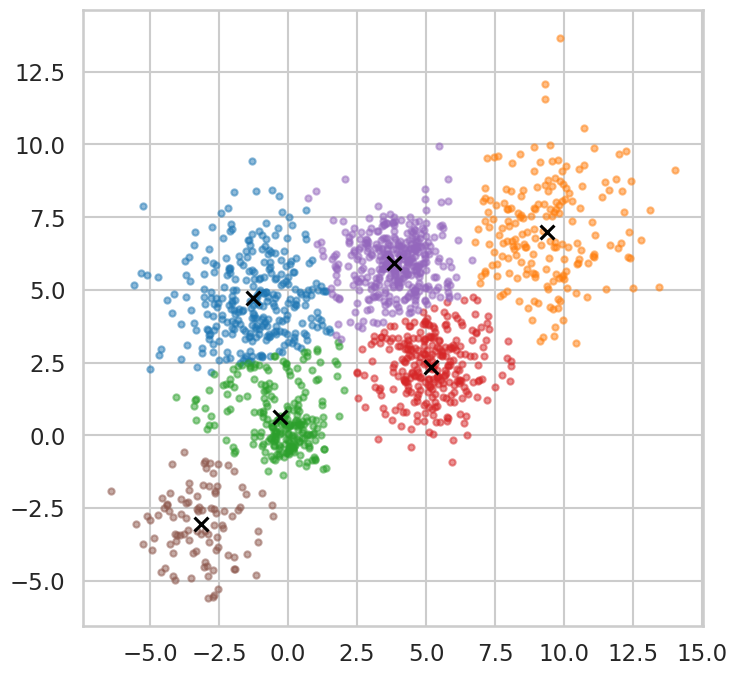

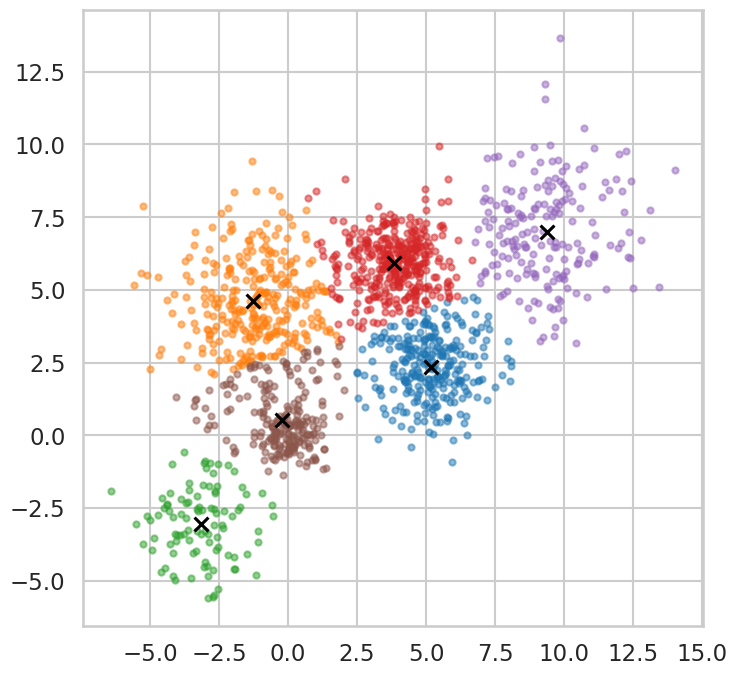

In [ ]:
import random
for i in range(2):
    model = KMeans(n_clusters=6,random_state = random.randint(1, 100) )

    model.fit(Multi_blob_Data)
    print(model.cluster_centers_)
    plt.figure()
    display_cluster(Multi_blob_Data,model,6)


model = KMeans(n_clusters=6, init='k-means++', random_state=42)
model.fit(Multi_blob_Data)
labels = model.fit_predict(Multi_blob_Data)
print(model.cluster_centers_)
plt.figure()
display_cluster(Multi_blob_Data,model,6)
silhouette_score_kmeans=silhouette_score(Multi_blob_Data, labels)

1. The graph of the sum squared distances (distortions) shows an elbow at K=6 six,  which means that the optimum number of clusters is 6.
2. The highest Silhouette score is at K=6,  which means that the optimum number of clusters is 6.
3. Changing the intial centroids in Kmeans affects which points will be assigned to which clusters, From the graphs in the cell above Kmeans was runned twice with different initials centroids and k=6 the point assigned to each cluster is different for each initialization.
Kmean++ is supposed to find the best seed for initial centroid values.


###Agglomerative

Best agglomerative clustering model for this data is number of clusters= 2 with linkage of complete and affinity of manhattan.Silhouette Score is 0.4723755464253166.


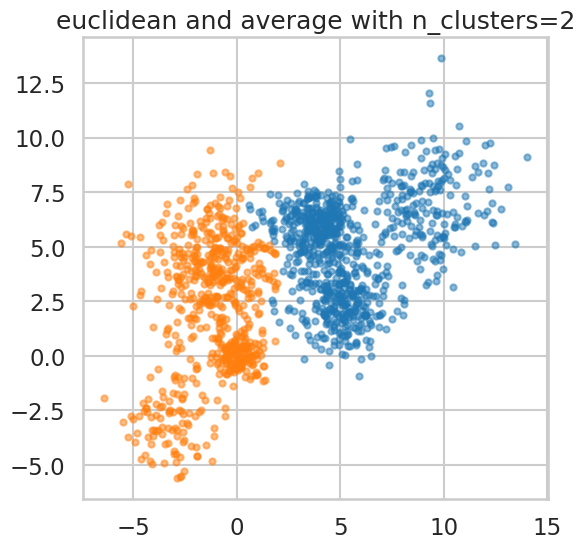

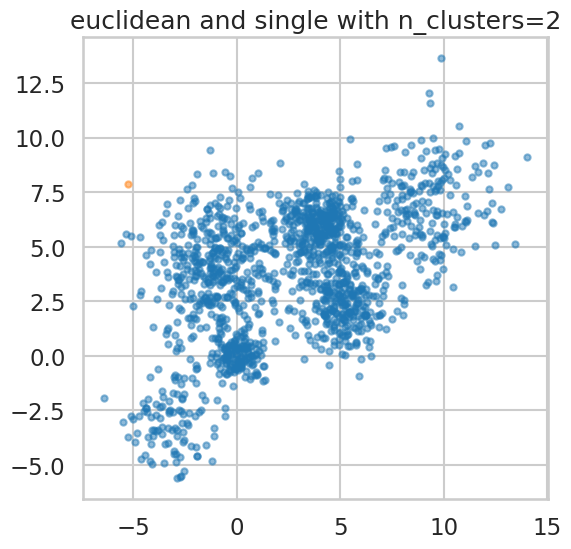

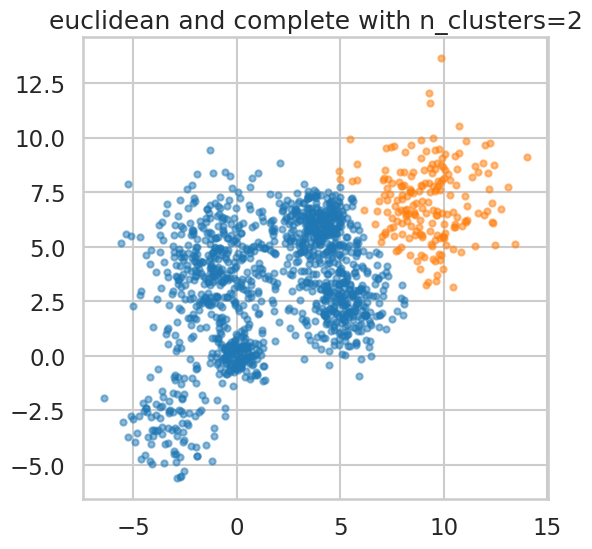

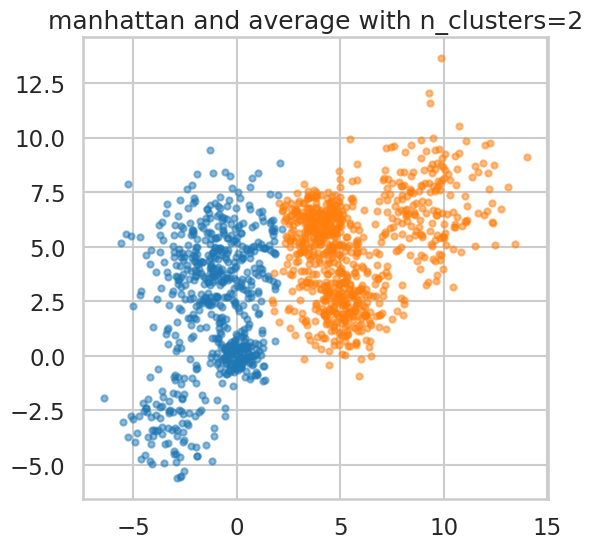

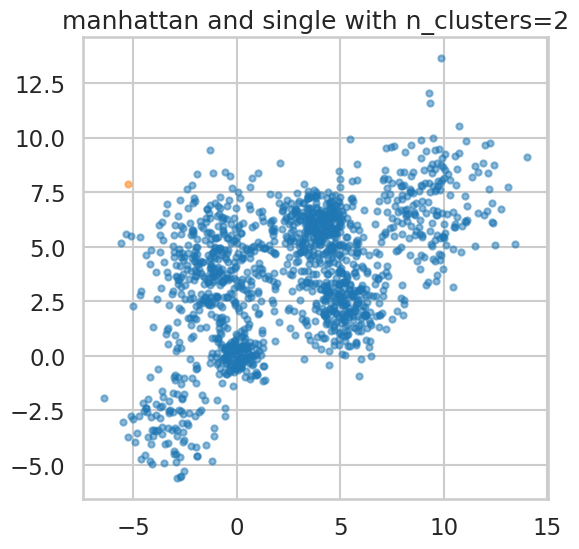

...

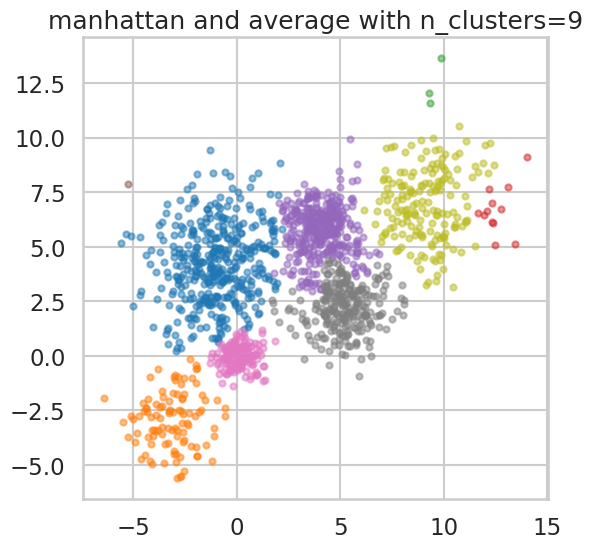

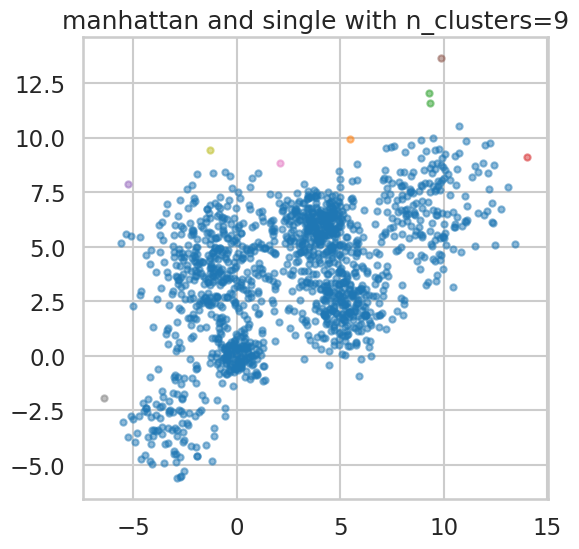

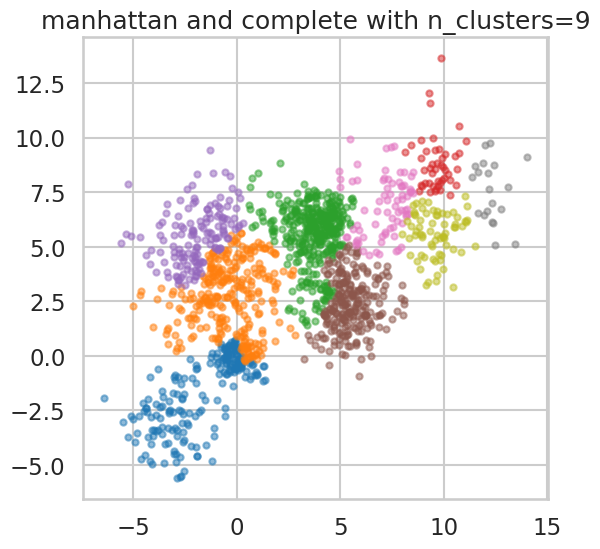

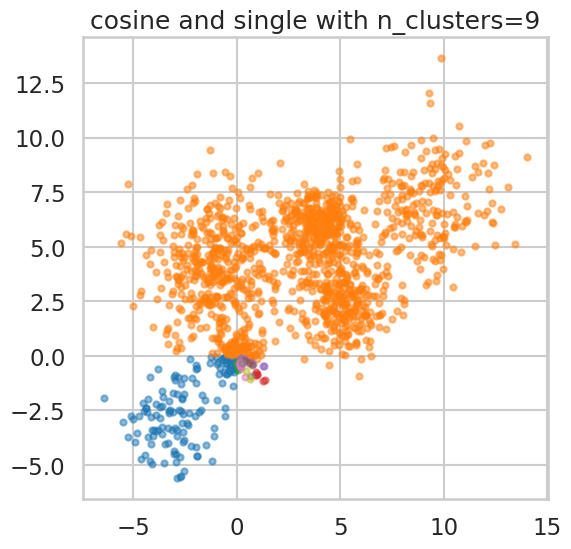

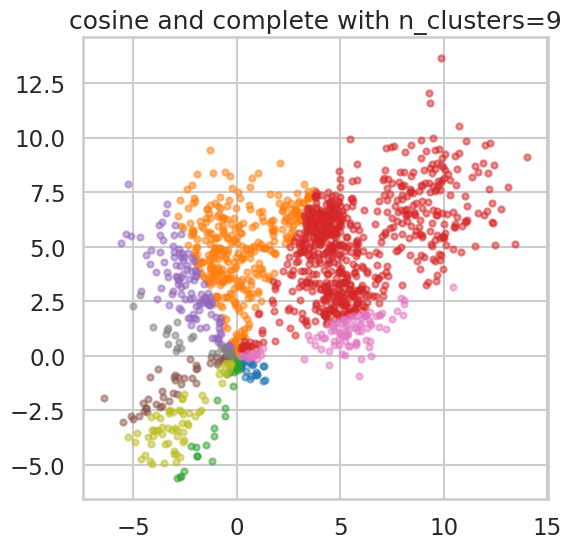

In [ ]:
s=[]
linkage_list=["average","single","complete"]
affinity_list=["euclidean","manhattan","cosine"]
n=np.arange(2,10)
best=-1
best_affinity=" "
best_n=1
best_linkage= " "
for n_clusters in n:
    for affinity in affinity_list:
          for linkage in linkage_list:
                if linkage=="average" and affinity=="cosine":
                    continue
                model = AgglomerativeClustering(n_clusters=n_clusters, metric=affinity, linkage=linkage )
                model = model.fit(Multi_blob_Data)
                plt.figure(figsize=(6,6))
                plt.title(f"{affinity} and {linkage} with n_clusters={n_clusters}")
                display_agglo(Multi_blob_Data,model,n_clusters)
                silhouette=silhouette_score(Multi_blob_Data,model.labels_)
                s.append(silhouette)
                if silhouette >= best:
                    best_n=n_clusters
                    best =silhouette
                    best_affinity=affinity
                    best_linkage=linkage
print("Best agglomerative clustering model for this data is number of clusters="+" " + str(best_n)+" " +"with linkage of "
      +str(best_linkage)+" and affinity of "+str(best_affinity)+", " "Silhouette Score is "+str(best)+".")

1.   To vary the number of clusters k, the attribute n_clusters is used instead of distance thershold
2.   The combination of cosine metrics and single linkage is not allowed so it was excluded
3.  Best clustering for this data is 2 clusters with linkage of complete and affinity of manhattan Silhouette Score is 0.47
4.  The points within each cluster are highly distored (not compact) and the distance between the clusters are not big enough (clusters are overlapping), therefore the agglomerative fails to cluster the data into 6 clusters. This because agglomerative clustering groups the points nearest to each other toghether.

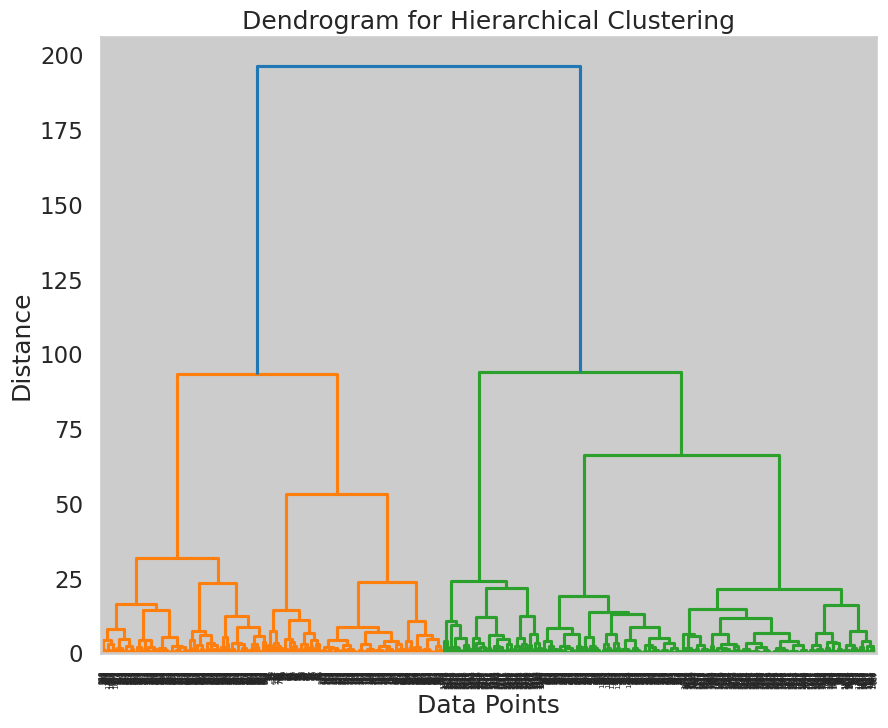

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage

linkage_matrix = linkage(Multi_blob_Data, method='ward')
plt.figure(figsize=(10, 8))
dendrogram(linkage_matrix)
plt.title("Dendrogram for Hierarchical Clustering")
plt.xlabel("Data Points")
plt.ylabel("Distance")
plt.show()

### DBScan
* Use DBScan function to  to cluster the above data.
* In the  DBscan change the following parameters:
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
    * Another option: Lookup K-Distance graph method
* Plot the silhouette_score versus the variation in the EPS and the min_samples.
* Plot the resulting Clusters in this case.
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques.
* Record your observations and comments.

Best DBScan clustering model for this data with epsilon 2.2000000000000006 and min samples 11 has silhouette score 0.4685207355522043 and 2 clusters.


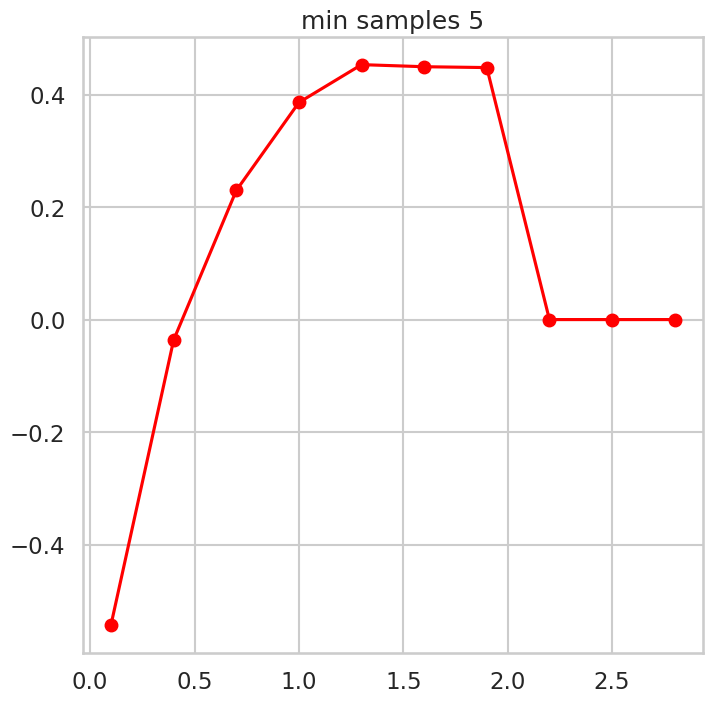

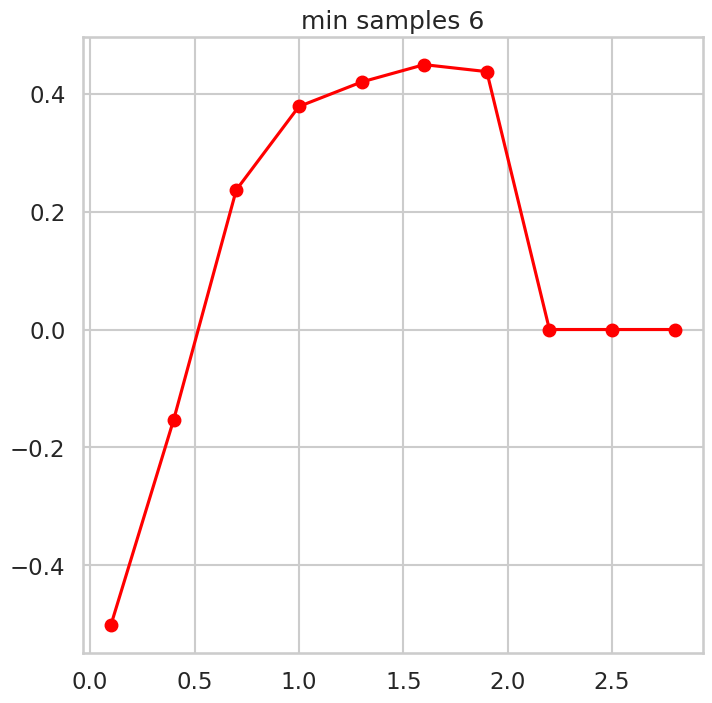

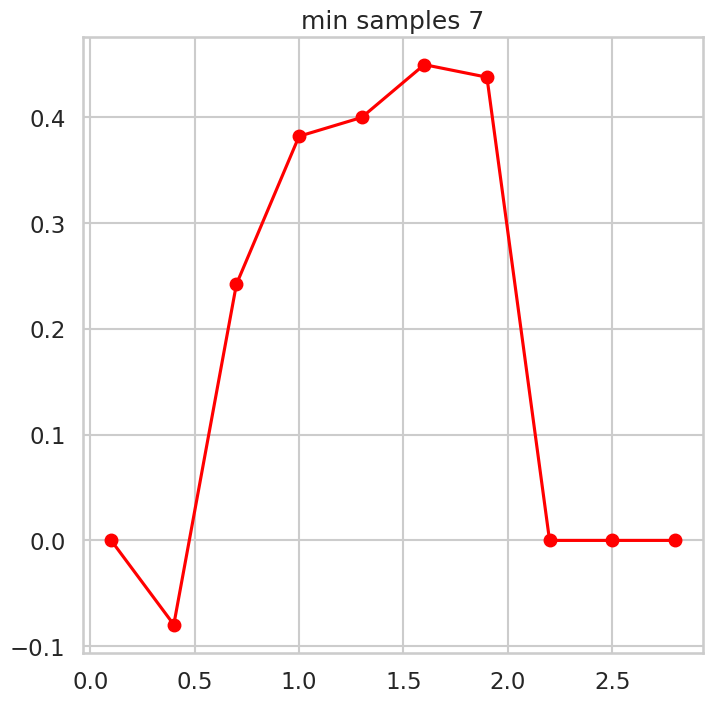

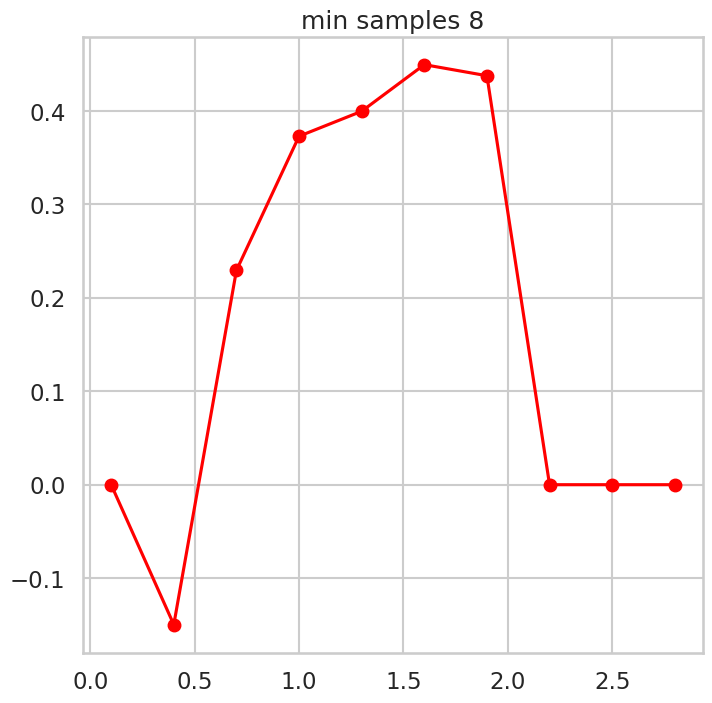

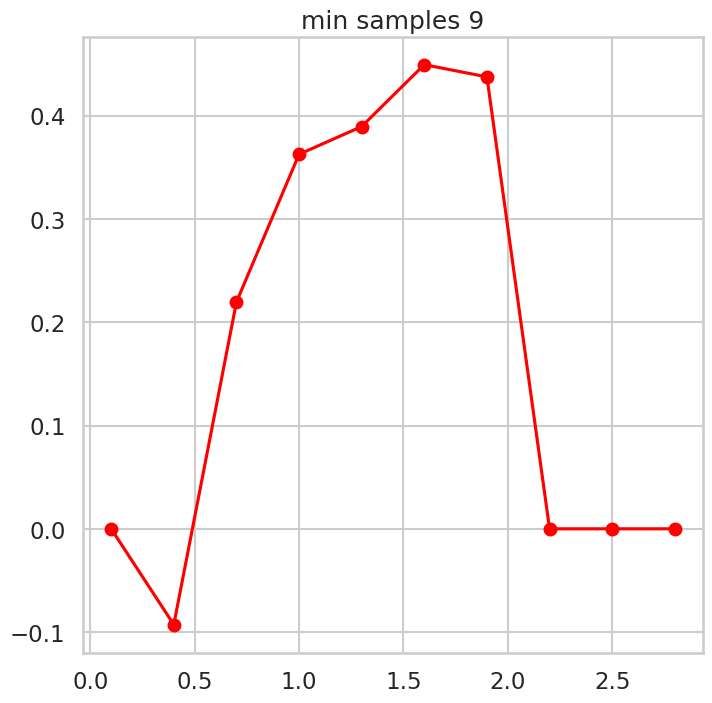

...

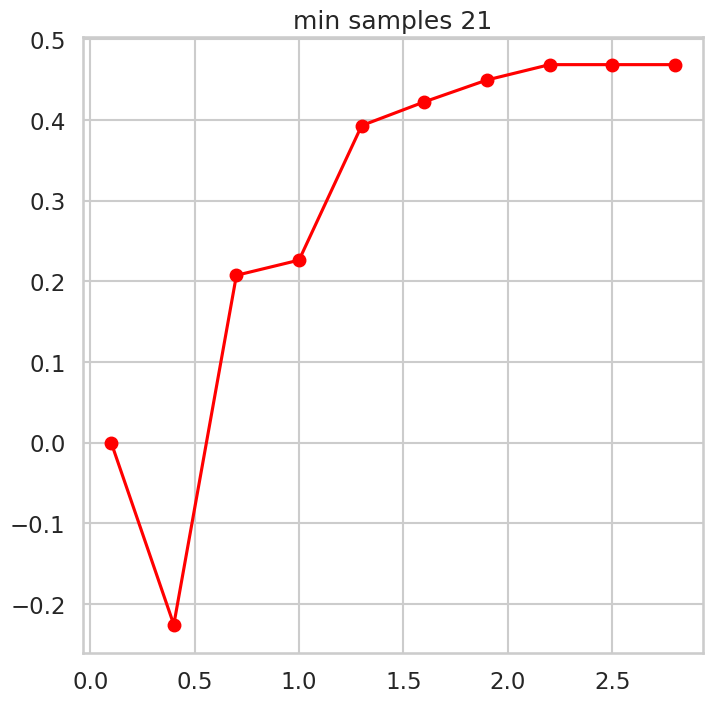

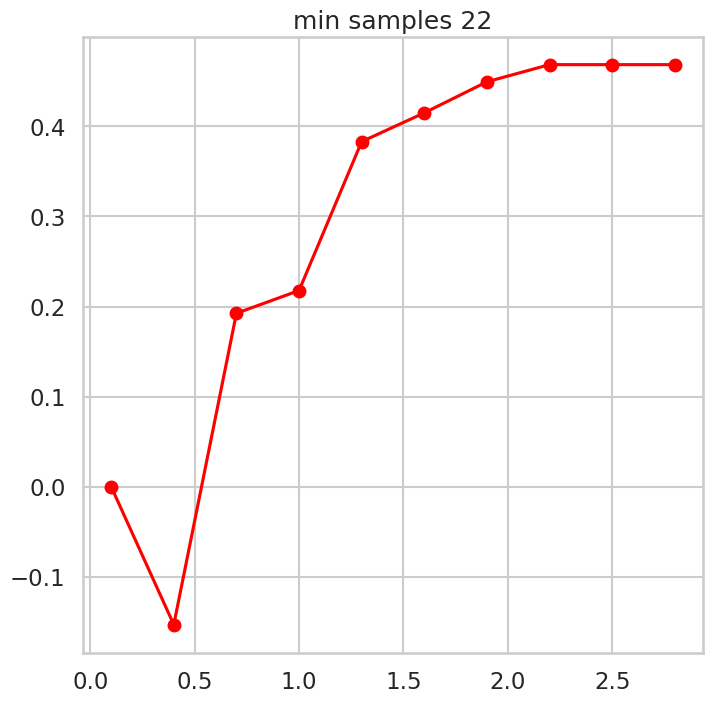

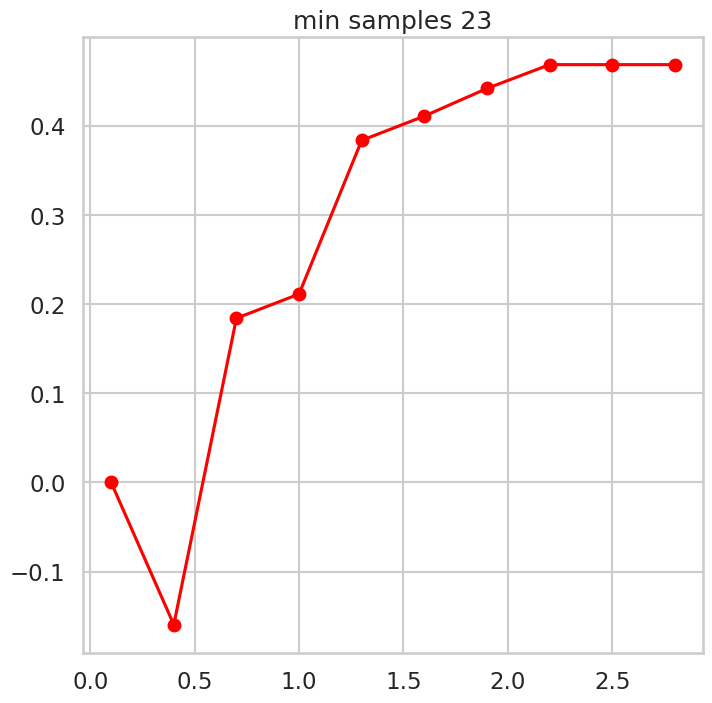

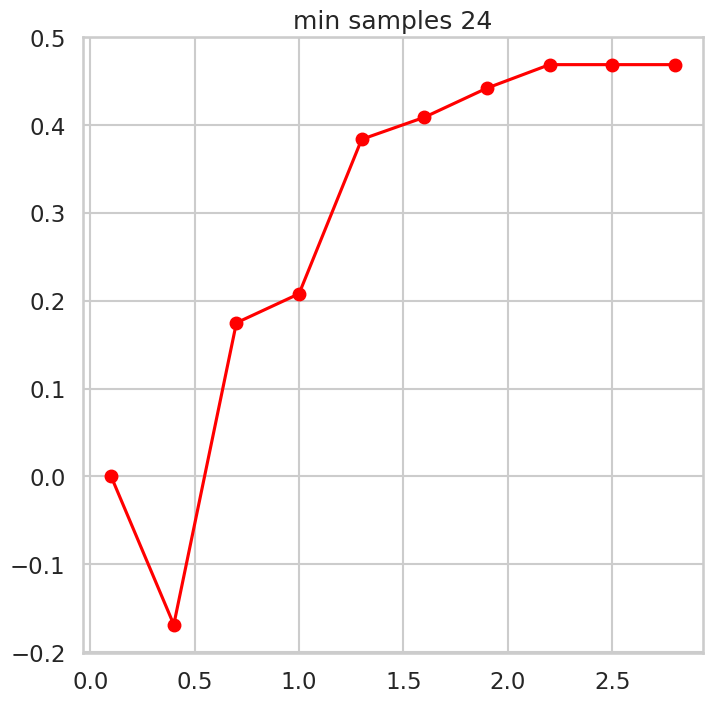

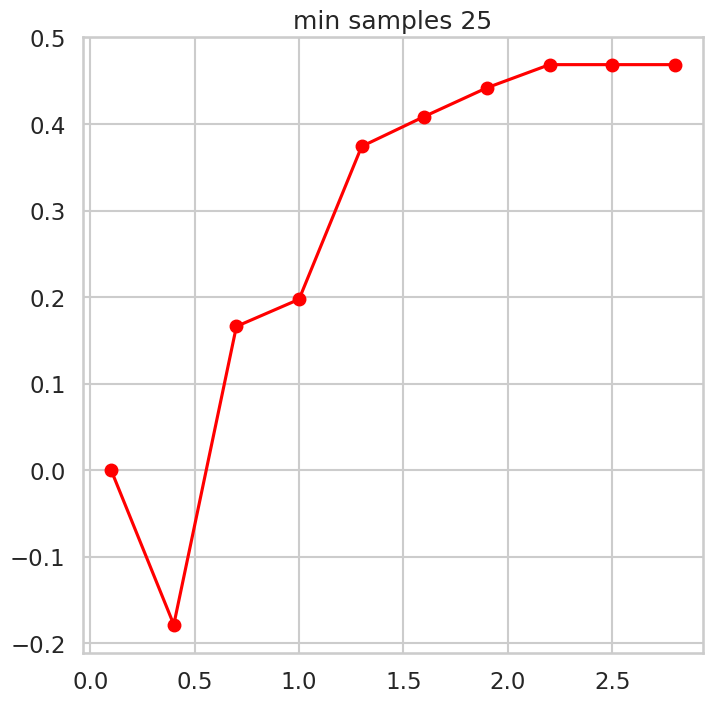

In [4]:
best_eps=0.1
best_min=5
best_s=-1
best_n_clusters = 0
for i in range(5,26):
  s = []
  for j in np.arange(0.1, 3, 0.3):
    dbscan = DBSCAN(eps=j, min_samples=i)
    cluster_labels = dbscan.fit_predict(Multi_blob_Data)
    if len(np.unique(cluster_labels)) == 1:
      silhouette = 0
      s.append(silhouette)
      continue
    silhouette = silhouette_score(Multi_blob_Data, cluster_labels)
    s.append(silhouette)
    if silhouette > best_s:
      best_eps=j
      best_min=i
      best_s=silhouette
      best_n_clusters = len(np.unique(cluster_labels))
  plt.figure()
  plt.title(f"min samples {i}")
  plt.plot(np.arange(0.1, 3, 0.3), s, marker='o', color='red')

print(f"Best DBScan clustering model for this data with epsilon {best_eps} and min samples {best_min} has silhouette score {best_s} and {best_n_clusters} clusters.")

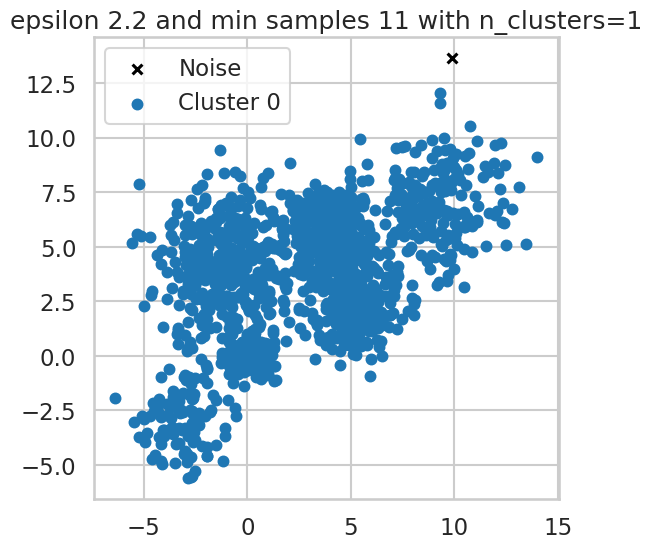

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

# Run DBSCAN
dbscan = DBSCAN(eps=2.2, min_samples=11)
cluster_labels = dbscan.fit_predict(Multi_blob_Data)

# Get unique clusters
unique_labels = np.unique(cluster_labels)

# Plot clusters
plt.figure(figsize=(6, 6))
plt.title(f"epsilon {2.2} and min samples {11} with n_clusters={len(unique_labels) - (1 if -1 in unique_labels else 0)}")

for label in unique_labels:
    indices = np.where(cluster_labels == label)  # Fix indexing issue

    if label == -1:
        plt.scatter(Multi_blob_Data[indices, 0], Multi_blob_Data[indices, 1],
                    c='black', label='Noise', marker='x', s=50)
    else:
        plt.scatter(Multi_blob_Data[indices, 0], Multi_blob_Data[indices, 1],
                    label=f'Cluster {label}', cmap='plasma', s=50)

plt.legend()
plt.show()


The Best DBScan clustering model for this data with epsilon 2.2 and min samples 11 has silhouette score 0.46 and 2 clusters. DBScan failed to cluster the data into 6 clusters because the data points are close to each therefore there is no clear distinction between clusters.

Kmeans is the best clustering technique for this data because it correctly clusters the data into 6 clusters with the highest sihlouette score

## iris data set
The iris data set is test data set that is part of the Sklearn module
which contains 150 records each with 4 features. All the features are represented by real numbers.

The data represents three classes.


In [38]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0,0,1])
list(iris_data.target_names)
#['setosa', 'versicolor', 'virginica']
df_iris = pd.DataFrame(iris_data.data, columns=iris_data.feature_names)


###**PCA** on Iris dataset

                   sepal length (cm)  sepal width (cm)  petal length (cm)  \
sepal length (cm)           1.000000         -0.117570           0.871754   
sepal width (cm)           -0.117570          1.000000          -0.428440   
petal length (cm)           0.871754         -0.428440           1.000000   
petal width (cm)            0.817941         -0.366126           0.962865   

                   petal width (cm)  
sepal length (cm)          0.817941  
sepal width (cm)          -0.366126  
petal length (cm)          0.962865  
petal width (cm)           1.000000  
              PC1           PC2           PC3
PC1  1.000000e+00  2.108677e-14  9.432910e-16
PC2  2.108677e-14  1.000000e+00 -3.767569e-14
PC3  9.432910e-16 -3.767569e-14  1.000000e+00


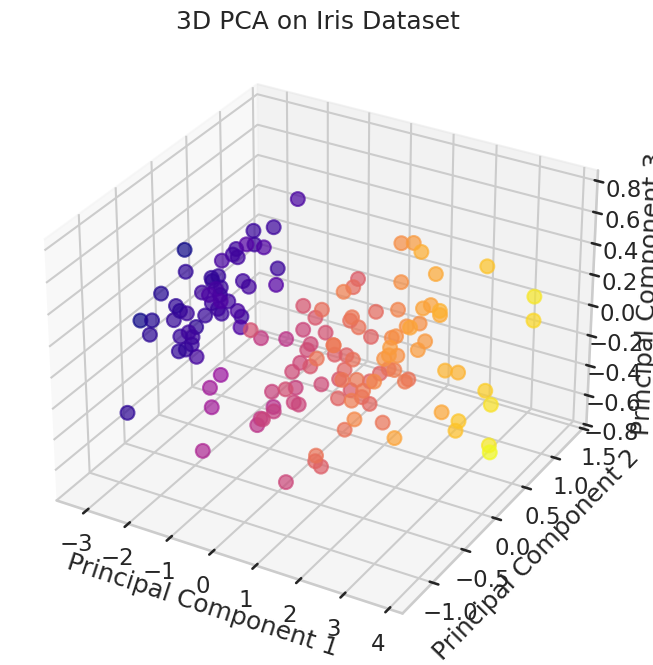

In [39]:
from sklearn.decomposition import PCA

print(df_iris.corr())
pca = PCA(n_components=3)
iris_pca = pca.fit_transform(df_iris)
df_pca = pd.DataFrame(iris_pca, columns=['PC1', 'PC2','PC3'])
print(df_pca.corr())

# Plot PCA results in 3-dimensions
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(df_pca['PC1'], df_pca['PC2'], df_pca['PC3'], c=df_pca['PC1'], cmap='plasma', s=100, alpha=0.7)
ax.set_title('3D PCA on Iris Dataset')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')

plt.show(sc)
plt.show()


1. There is a high correlation between the petal and sepal lengths, therefore PCA with 3 components is used to repersent these two features a one feature
2. the graph of the PCA with 3 components shows 3 clusters of data (each represeneted with a differnet color colour). However, there are two clusters with a huge overlapping of points (no clear distinction between the clusters).
3. This means that the clustering techniques might not be able to distingush between there two clusters and they may be clustered together as one.

###Scaling Iris dataset

In [40]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
iris_scaled = scaler.fit_transform(df_iris)
pca = PCA(n_components=3)
iris_pca_scaled = pca.fit_transform(iris_scaled)
df_pca_scaled = pd.DataFrame(iris_pca_scaled, columns=['PC1', 'PC2','PC3'])

###K-Means

In [41]:
import random
#K-means
sum2_dist = []
scores = []

for k in range(2,10):
    model = KMeans(n_clusters=k, random_state=random.randint(1, 100))
    labels = model.fit_predict(df_pca)
    sum2_dist.append(model.inertia_)
    scores.append(silhouette_score(df_pca, labels))

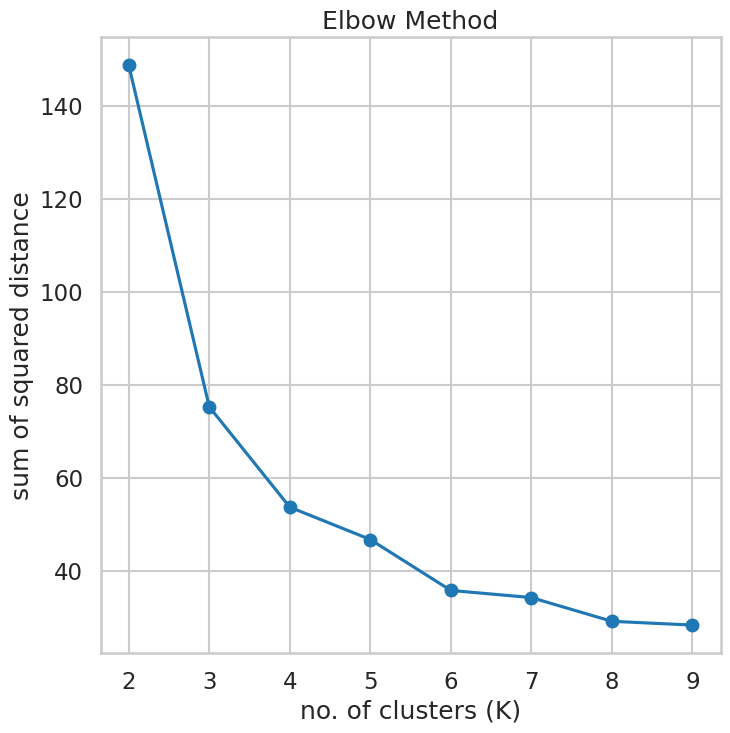

In [42]:
plt.plot(range(2,10), sum2_dist, marker='o')
plt.xlabel('no. of clusters (K)')
plt.ylabel('sum of squared distance')
plt.title('Elbow Method')
plt.show()

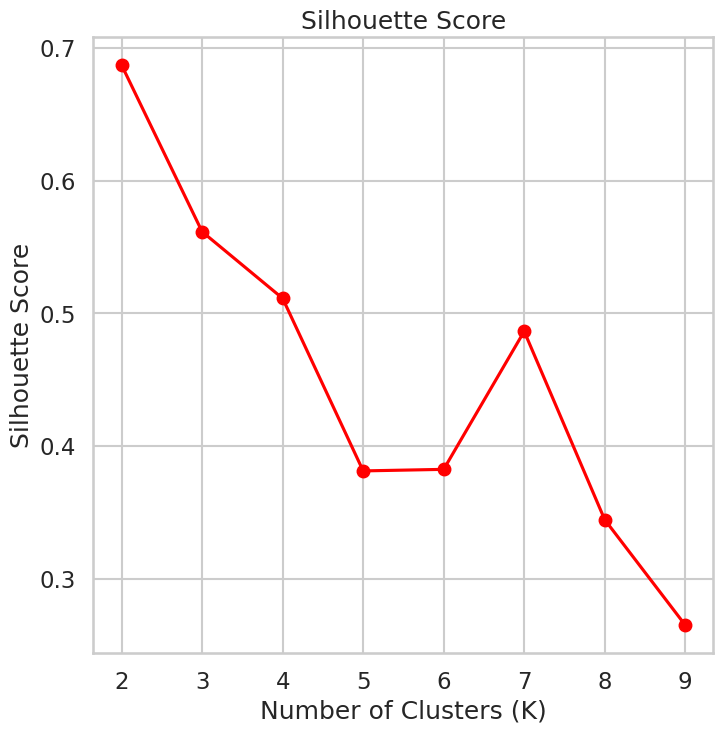

In [43]:
plt.plot(range(2,10), scores, marker='o', color='red')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score')
plt.show()

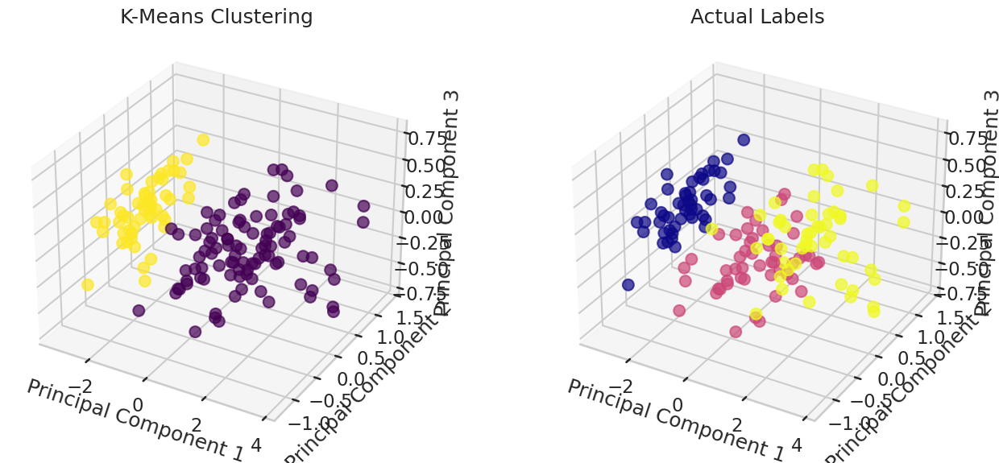

In [44]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Fit KMeans
model = KMeans(n_clusters=2, random_state=42)
iris_clusters = model.fit_predict(df_pca)
df_pca["Cluster"] = iris_clusters
df_pca["Actual"] = iris_data.target

# Create figure and 3D subplots
fig = plt.figure(figsize=(14, 6))

# Plot K-Means Clustering
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
sc1 = ax1.scatter(df_pca['PC1'], df_pca['PC2'], df_pca['PC3'],
                  c=df_pca['Cluster'], cmap='viridis', s=100, alpha=0.7)
ax1.set_title("K-Means Clustering")
ax1.set_xlabel("Principal Component 1")
ax1.set_ylabel("Principal Component 2")
ax1.set_zlabel("Principal Component 3")

# Plot Actual Labels
ax2 = fig.add_subplot(1, 2, 2, projection='3d')
sc2 = ax2.scatter(df_pca['PC1'], df_pca['PC2'], df_pca['PC3'],
                  c=df_pca['Actual'], cmap='plasma', s=100, alpha=0.7)
ax2.set_title("Actual Labels")
ax2.set_xlabel("Principal Component 1")
ax2.set_ylabel("Principal Component 2")
ax2.set_zlabel("Principal Component 3")

plt.tight_layout()
plt.show()


###K-means + scaling

In [45]:
#K-means
sum2_dist = []
scores = []

for k in range(2,10):
    model = KMeans(n_clusters=k, random_state=42)
    labels = model.fit_predict(df_pca_scaled)
    sum2_dist.append(model.inertia_)
    scores.append(silhouette_score(df_pca_scaled, labels))

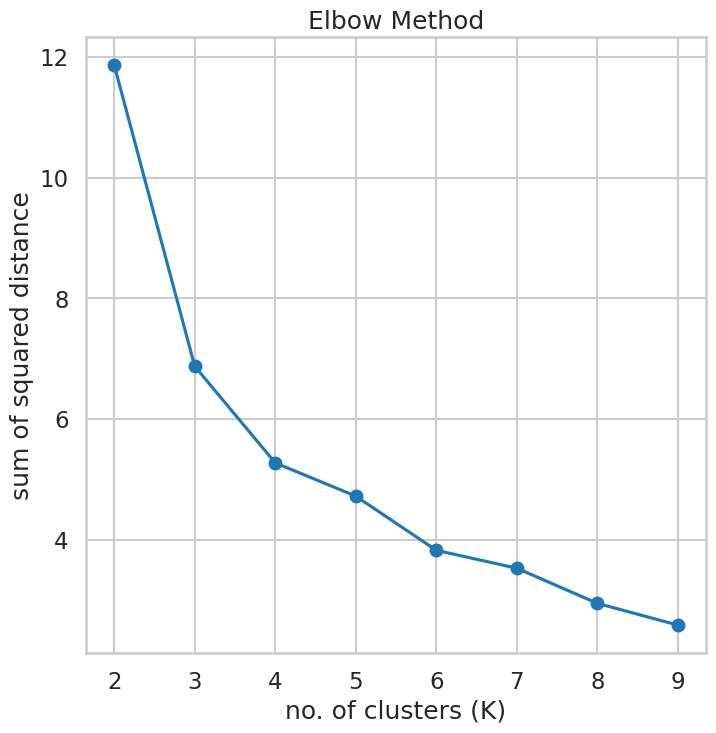

In [46]:
plt.plot(range(2,10), sum2_dist, marker='o')
plt.xlabel('no. of clusters (K)')
plt.ylabel('sum of squared distance')
plt.title('Elbow Method')
plt.show()

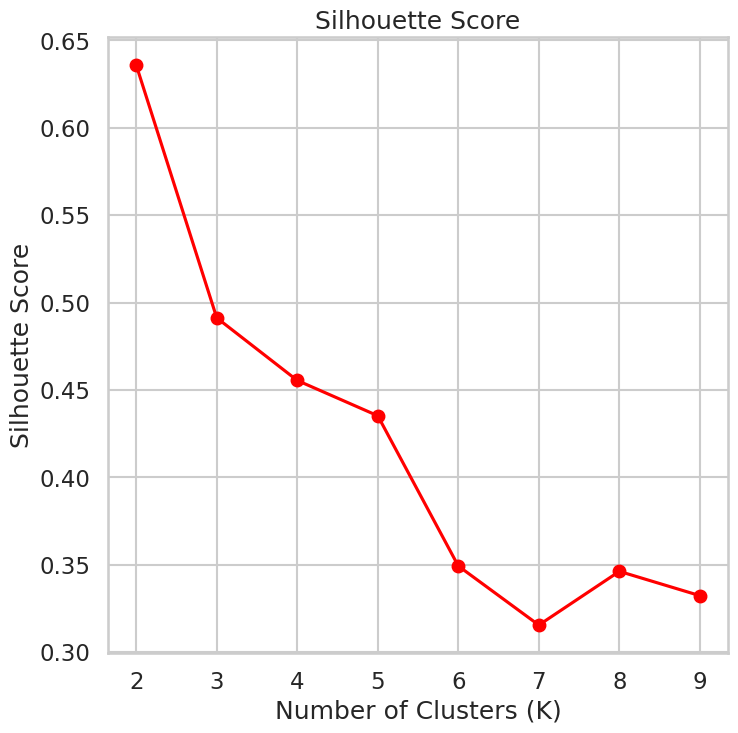

In [47]:
plt.plot(range(2,10), scores, marker='o', color='red')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score')
plt.show()

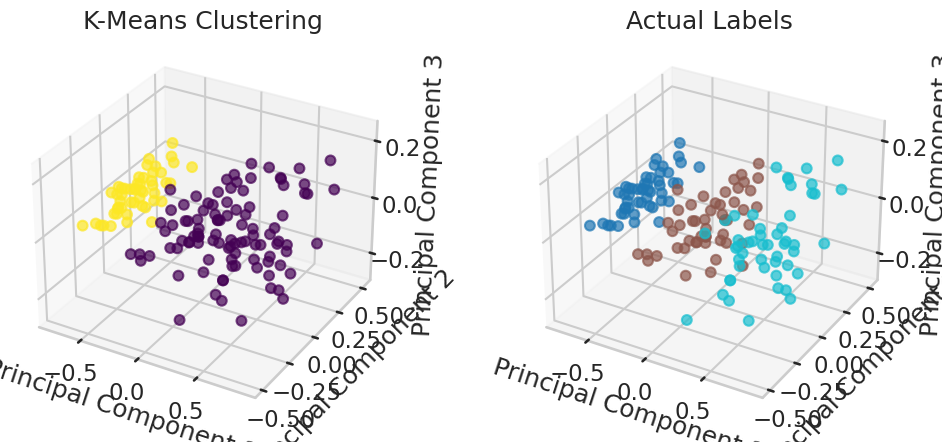

In [48]:
model = KMeans(n_clusters=2, random_state=42)
iris_clusters = model.fit_predict(df_pca_scaled)
df_pca_scaled["Cluster"] = iris_clusters
df_pca_scaled["Actual"] = iris_data.target

fig = plt.figure(figsize=(12, 5))


ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(df_pca_scaled["PC1"], df_pca_scaled["PC2"], df_pca_scaled["PC3"], c=df_pca_scaled["Cluster"], cmap="viridis", s=50, alpha=0.7)
ax1.set_title("K-Means Clustering")
ax1.set_xlabel("Principal Component 1")
ax1.set_ylabel("Principal Component 2")
ax1.set_zlabel("Principal Component 3")

ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca_scaled["PC1"], df_pca_scaled["PC2"], df_pca_scaled["PC3"], c=df_pca_scaled["Actual"], cmap="tab10", s=50, alpha=0.7)
ax2.set_title("Actual Labels")
ax2.set_xlabel("Principal Component 1")
ax2.set_ylabel("Principal Component 2")
ax2.set_zlabel("Principal Component 3")

plt.show()

1. The graph of sum of sqaured distance does not show a clear elbow. This means that is will not be used to choose the optimal k. This applies for the scaled and non-scaled data
2. The silhoutte score graph shows the optimal number of clusters is 2. Moreover, the silhouette score of the non-scaled data is better than the scaled data ( scaling the data did not imporve the score)
3. The highest silhouette score is with K=2 with non-scaled data ( score = 0.68)
4. Comparing the actual labels with the clustering results shows that the two clusters highlighted earlier are clustered as one group

###Agglomerative

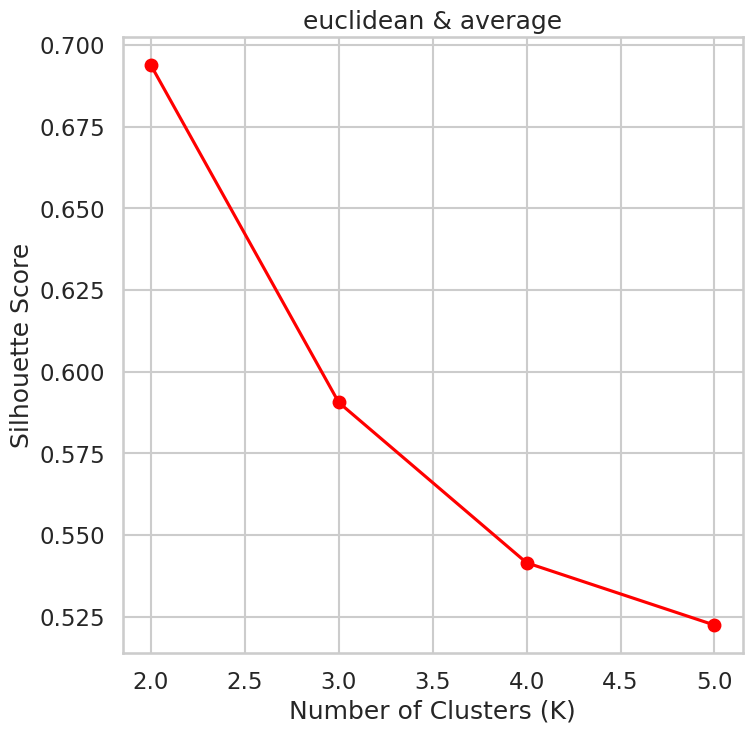

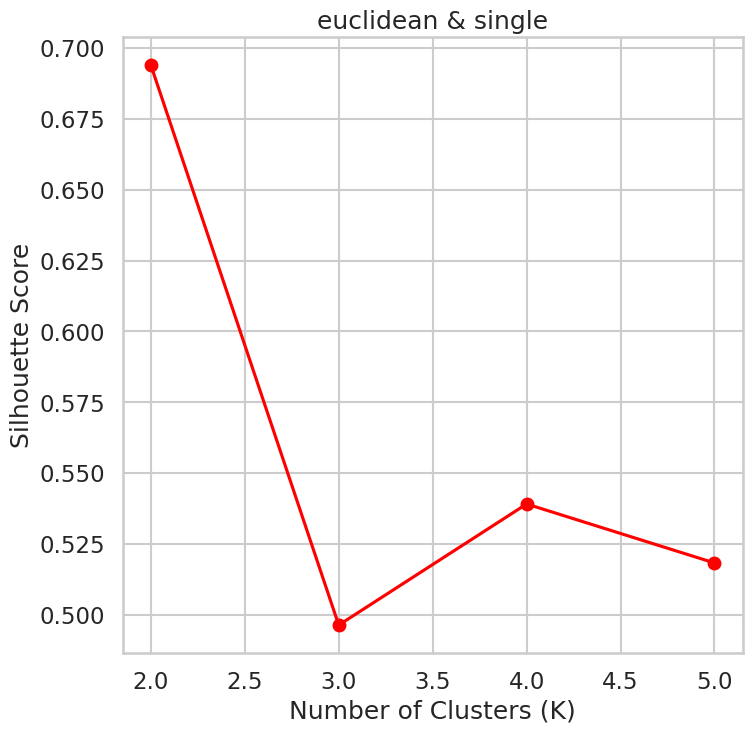

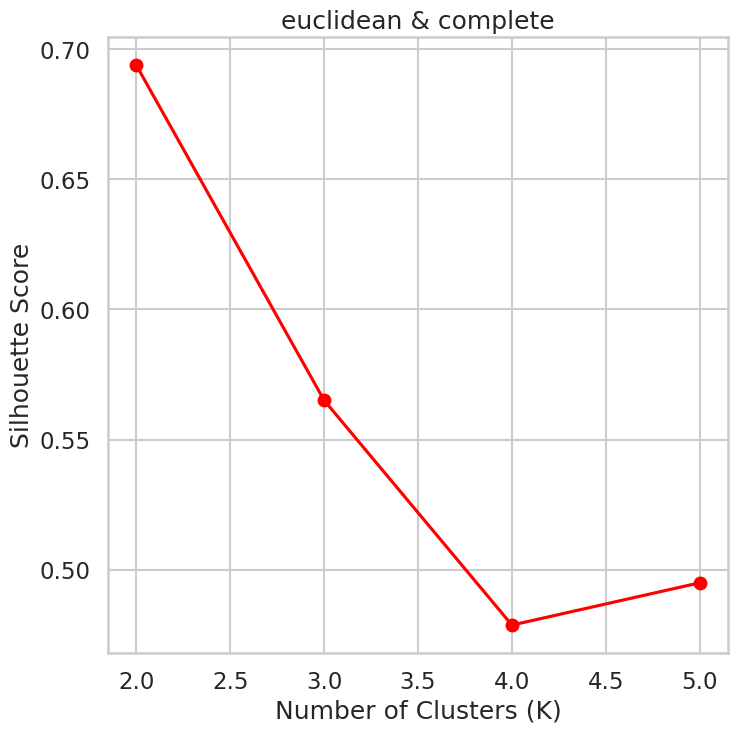

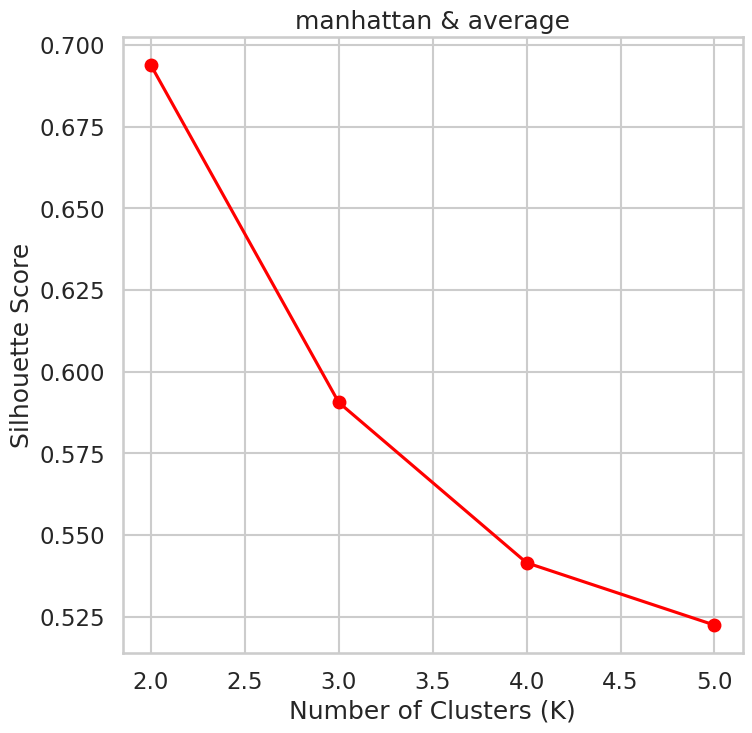

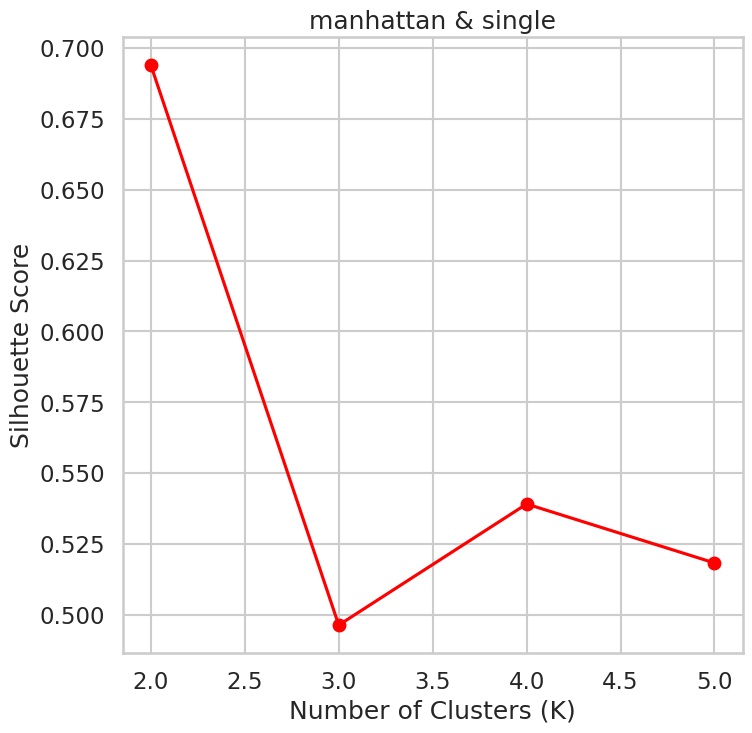

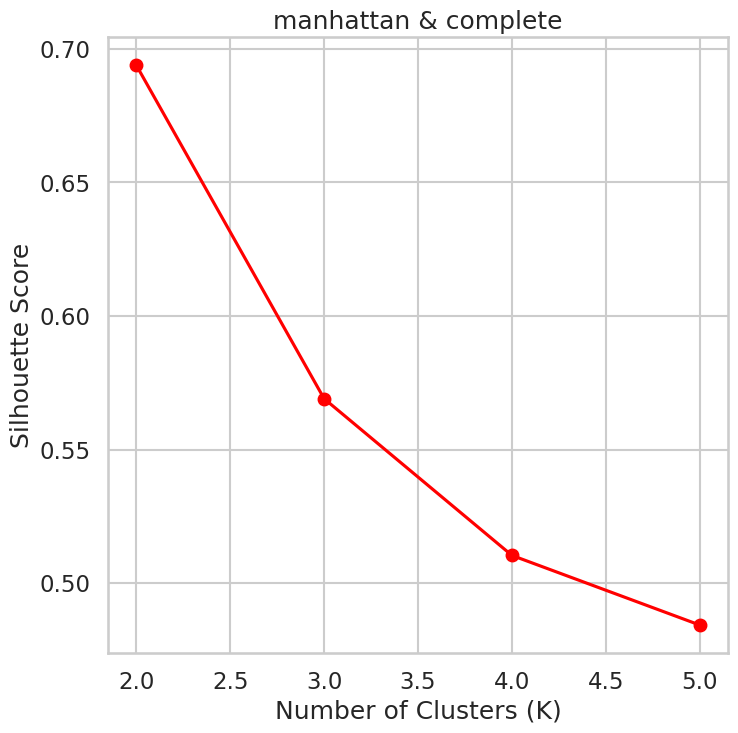

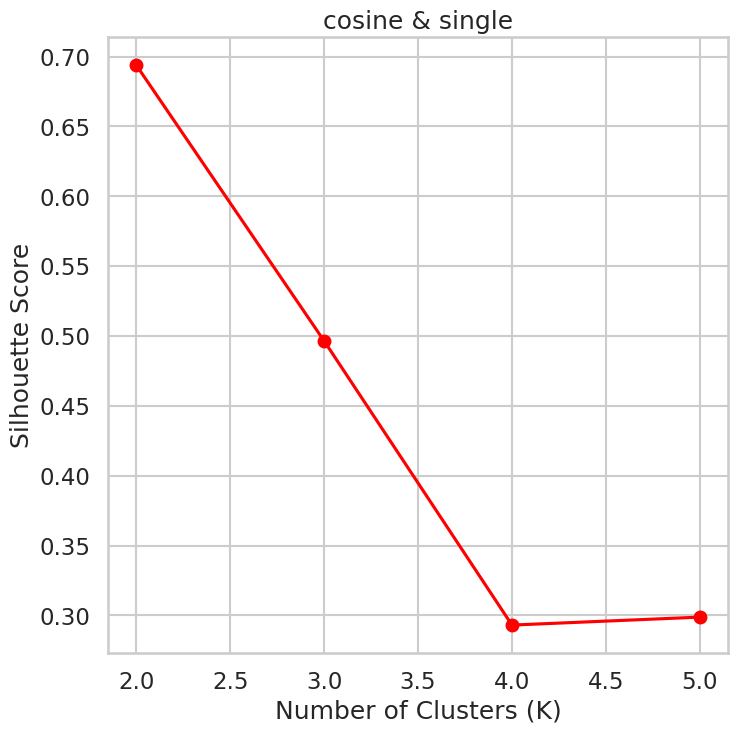

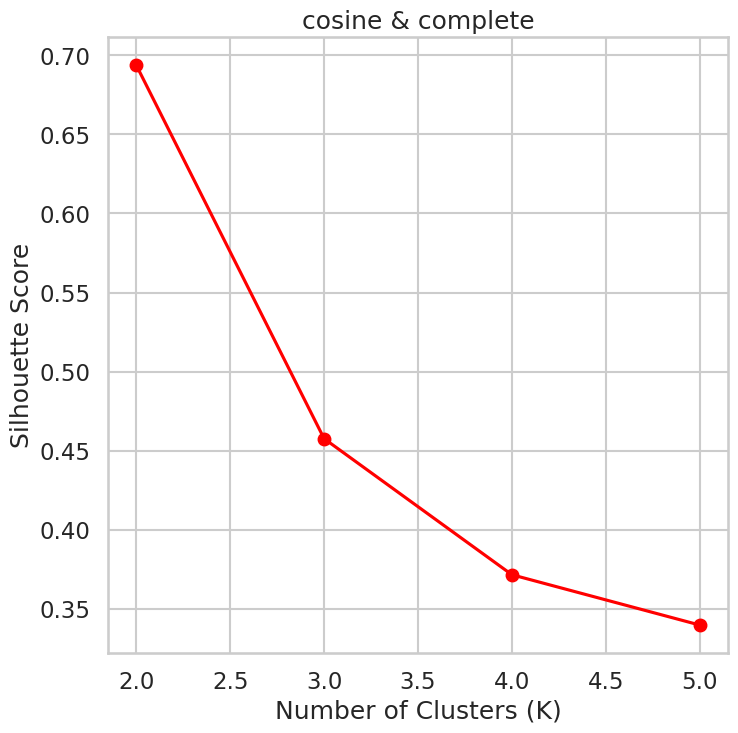

Best agglomerative clustering model for this data is number of clusters= 2 with linkage of average and affinity of euclidean, Silhouette Score is 0.6939163645751162.


In [49]:
s=[]
linkage_list=["average","single","complete"]
affinity_list=["euclidean","manhattan","cosine"]
n=np.arange(2,6)
best=-1
best_affinity=" "
best_n=1
best_linkage= " "
for affinity in affinity_list:
  for linkage in linkage_list:
    s=[]
    for n_clusters in n:
      if linkage=="average" and affinity=="cosine":
        continue
      model = AgglomerativeClustering(n_clusters=n_clusters, metric=affinity, linkage=linkage )
      model = model.fit(df_pca)

      silhouette=silhouette_score(df_pca,model.labels_)
      s.append(silhouette)
      if silhouette > best:
          best_n=n_clusters
          best =silhouette
          best_affinity=affinity
          best_linkage=linkage
    if s:
      plt.plot(range(2,6), s, marker='o', color='red')
      plt.xlabel('Number of Clusters (K)')
      plt.ylabel('Silhouette Score')
      plt.title(f"{affinity} & {linkage}")

    plt.show()
print("Best agglomerative clustering model for this data is number of clusters="+" " + str(best_n)+" " +"with linkage of "
      +str(best_linkage)+" and affinity of "+str(best_affinity)+", " "Silhouette Score is "+str(best)+".")

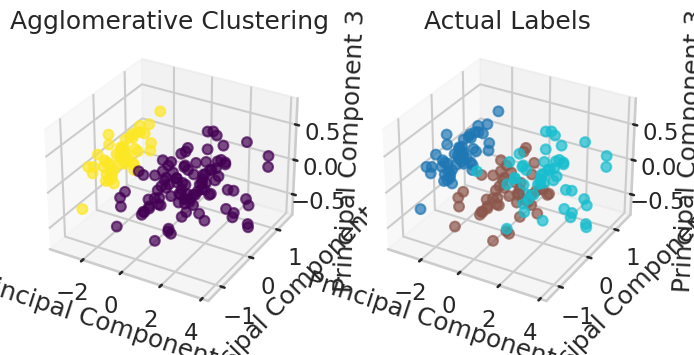

In [50]:
model = AgglomerativeClustering(n_clusters=2, metric="euclidean", linkage="average" )
iris_clusters = model.fit_predict(df_pca)
df_pca["Cluster"] = iris_clusters
df_pca["Actual"] = iris_data.target

fig=plt.figure()

ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(df_pca["PC1"], df_pca["PC2"], df_pca["PC3"], c=df_pca["Cluster"], cmap="viridis", s=50, alpha=0.7)
ax1.set_title("Agglomerative Clustering")
ax1.set_xlabel("Principal Component 1")
ax1.set_ylabel("Principal Component 2")
ax1.set_zlabel("Principal Component 3")

ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca["PC1"], df_pca["PC2"], df_pca["PC3"], c=df_pca["Actual"], cmap="tab10", s=50, alpha=0.7)
ax2.set_title("Actual Labels")
ax2.set_xlabel("Principal Component 1")
ax2.set_ylabel("Principal Component 2")
ax2.set_zlabel("Principal Component 3")

plt.show()
plt.show()

###Agglomerative + scaled

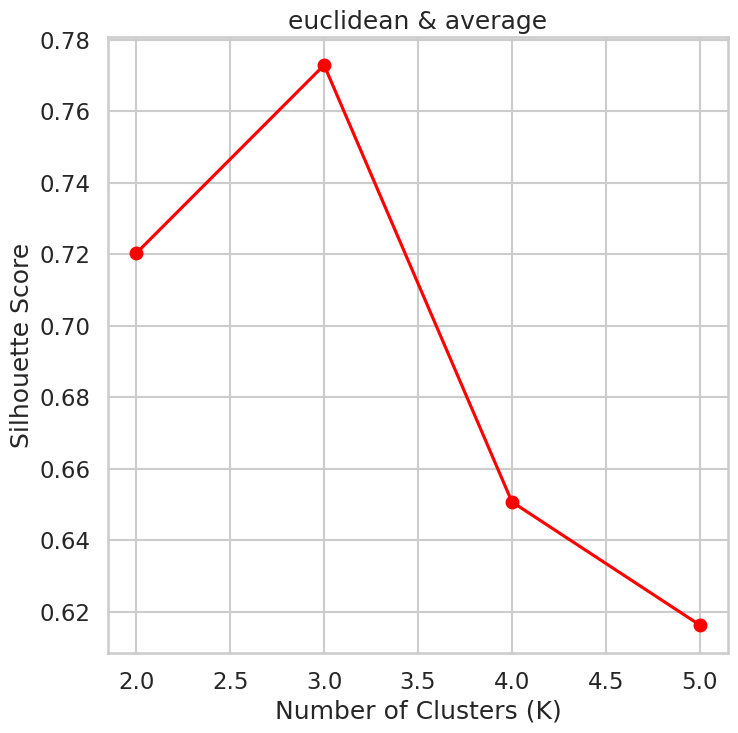

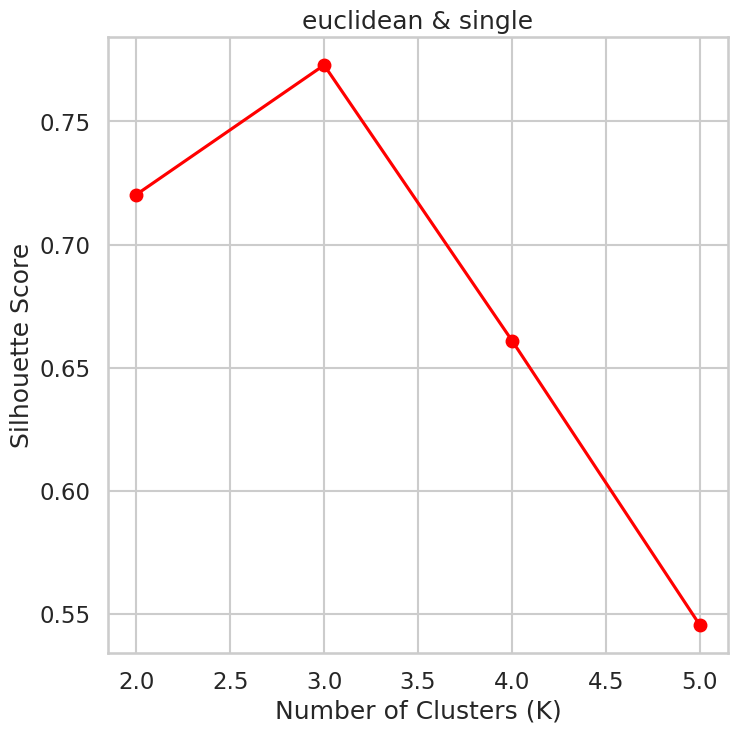

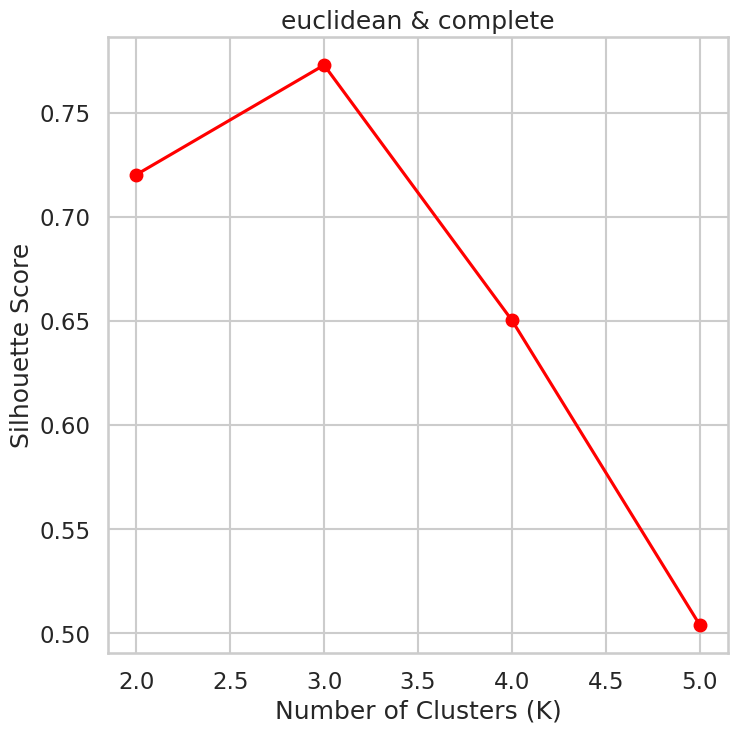

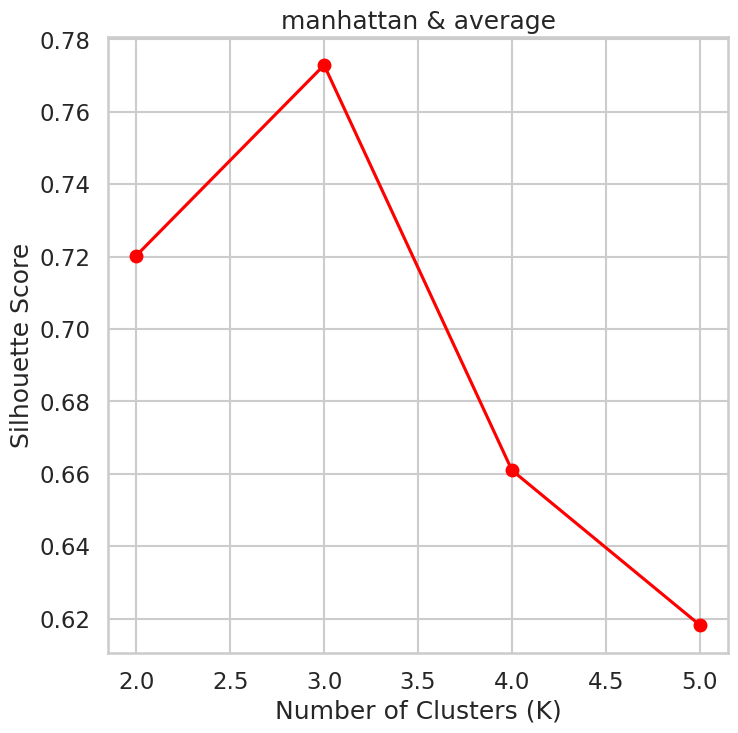

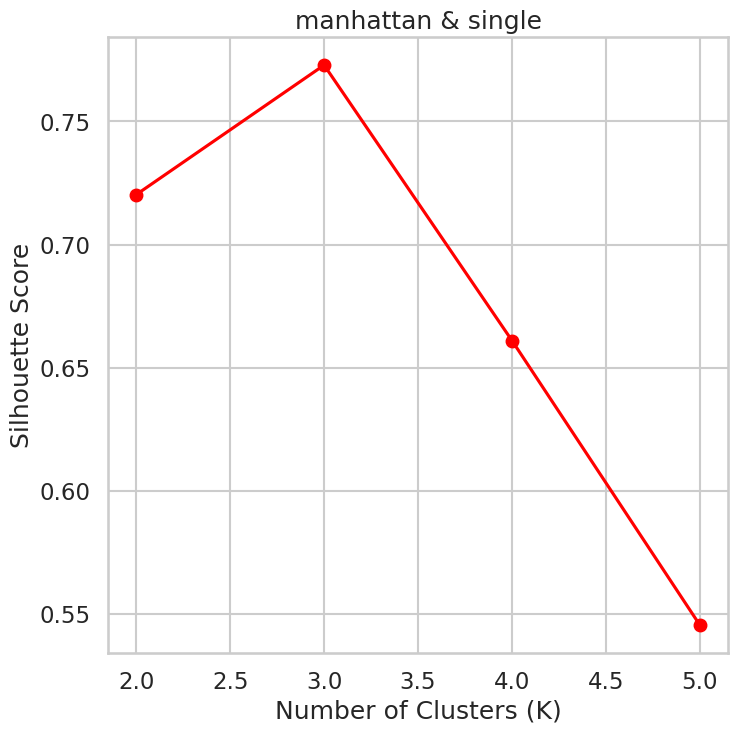

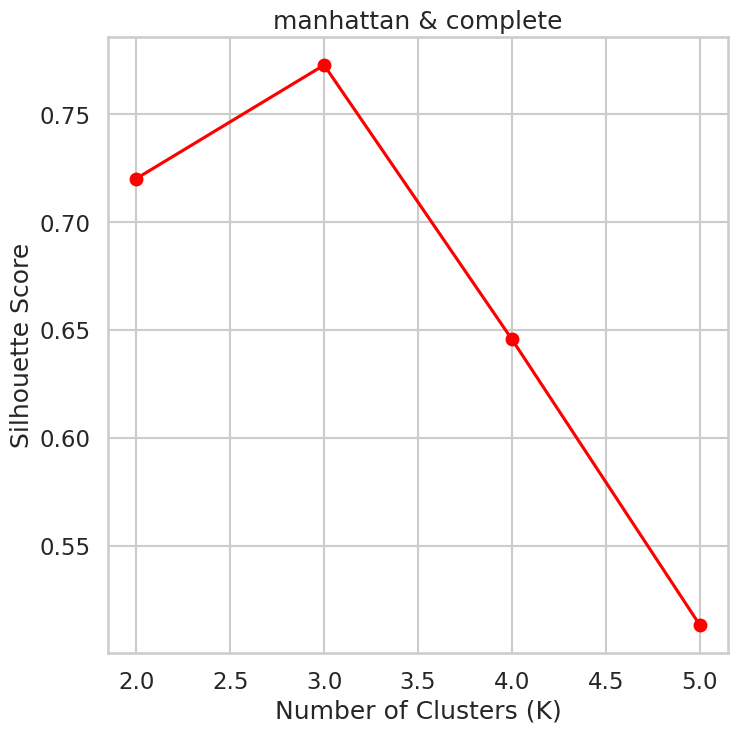

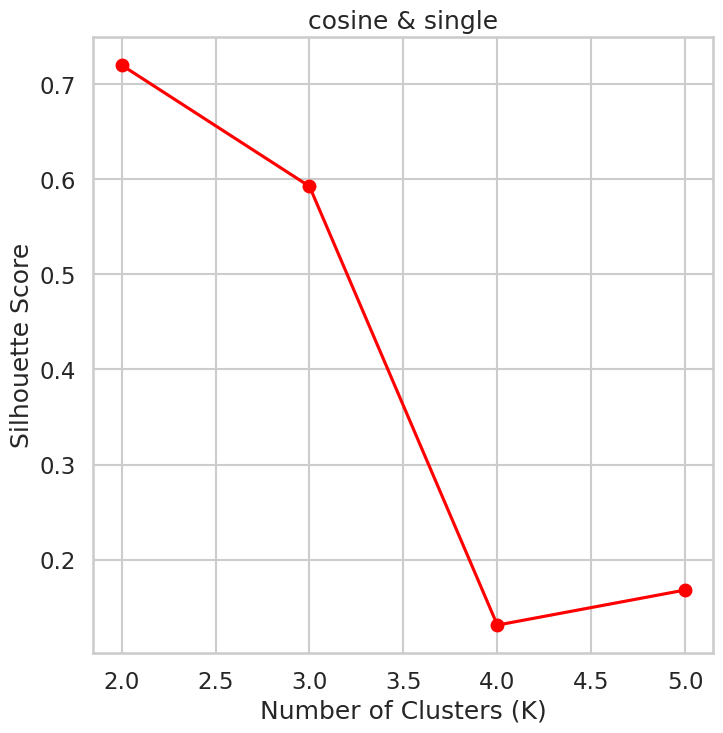

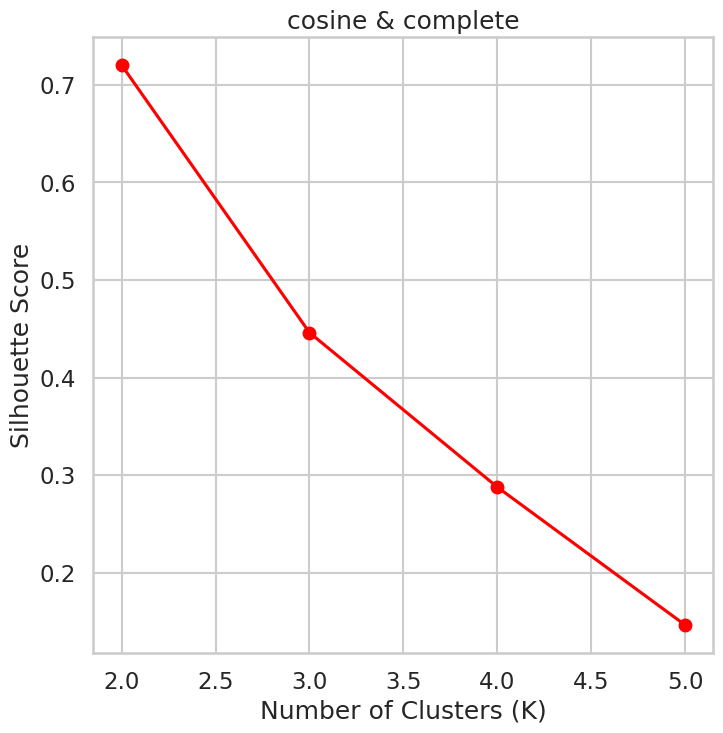

Best agglomerative clustering model for this data is number of clusters= 3 with linkage of average and affinity of euclidean, Silhouette Score is 0.7728947506812671.


In [51]:
s=[]
linkage_list=["average","single","complete"]
affinity_list=["euclidean","manhattan","cosine"]
n=np.arange(2,6)
best=-1
best_affinity=" "
best_n=1
best_linkage= " "
for affinity in affinity_list:
  for linkage in linkage_list:
    s=[]
    for n_clusters in n:
      if linkage=="average" and affinity=="cosine":
        continue
      model = AgglomerativeClustering(n_clusters=n_clusters, metric=affinity, linkage=linkage )
      model = model.fit(df_pca_scaled)

      silhouette=silhouette_score(df_pca_scaled,model.labels_)
      s.append(silhouette)
      if silhouette > best:
          best_n=n_clusters
          best =silhouette
          best_affinity=affinity
          best_linkage=linkage
    if s:
      plt.plot(range(2,6), s, marker='o', color='red')
      plt.xlabel('Number of Clusters (K)')
      plt.ylabel('Silhouette Score')
      plt.title(f"{affinity} & {linkage}")

    plt.show()
print("Best agglomerative clustering model for this data is number of clusters="+" " + str(best_n)+" " +"with linkage of "
      +str(best_linkage)+" and affinity of "+str(best_affinity)+", " "Silhouette Score is "+str(best)+".")

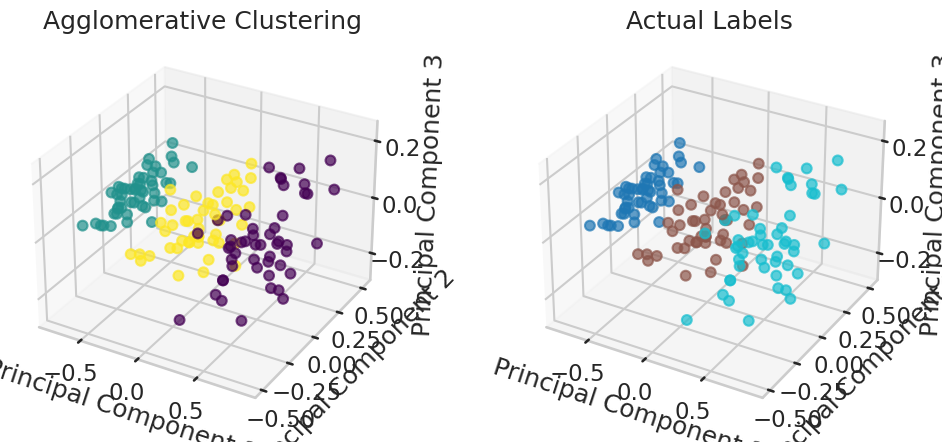

In [52]:
model = AgglomerativeClustering(n_clusters=3, metric="euclidean", linkage="average" )
iris_clusters = model.fit_predict(df_pca_scaled)
df_pca_scaled["Cluster"] = iris_clusters
df_pca_scaled["Actual"] = iris_data.target

fig = plt.figure(figsize=(12, 5))


ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(df_pca_scaled["PC1"], df_pca_scaled["PC2"], df_pca_scaled["PC3"], c=df_pca_scaled["Cluster"], cmap="viridis", s=50, alpha=0.7)
ax1.set_title("Agglomerative Clustering")
ax1.set_xlabel("Principal Component 1")
ax1.set_ylabel("Principal Component 2")
ax1.set_zlabel("Principal Component 3")

ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca_scaled["PC1"], df_pca_scaled["PC2"], df_pca_scaled["PC3"], c=df_pca_scaled["Actual"], cmap="tab10", s=50, alpha=0.7)
ax2.set_title("Actual Labels")
ax2.set_xlabel("Principal Component 1")
ax2.set_ylabel("Principal Component 2")
ax2.set_zlabel("Principal Component 3")

plt.show()
plt.show()

1.  Best agglomerative clustering model for unscaled data is 2 clusters with linkage of average and affinity of euclidean and silhouette Score is 0.693.
2.  Best agglomerative clustering model for scaled data 3 clusters with linkage of average and affinity of euclidean and silhouette Score is 0.773.
3.  Scaling the data did improved the silhouette score and correctly clustered the data into 3 clusters
4.  Comparing the actual labels with the clustering results shows that scalling the data + using agglomerative clustering correctly clusters the data points with the actual labels

###DBScan

Best DBScan clustering model for this data with epsilon 1.1 and min samples 5 has silhouette score 0.6982676464229054 and 2 clusters.


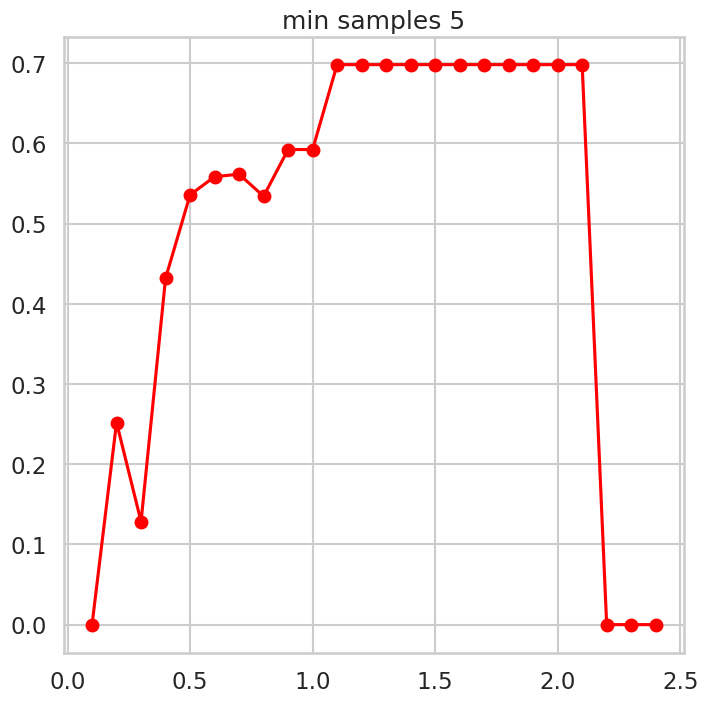

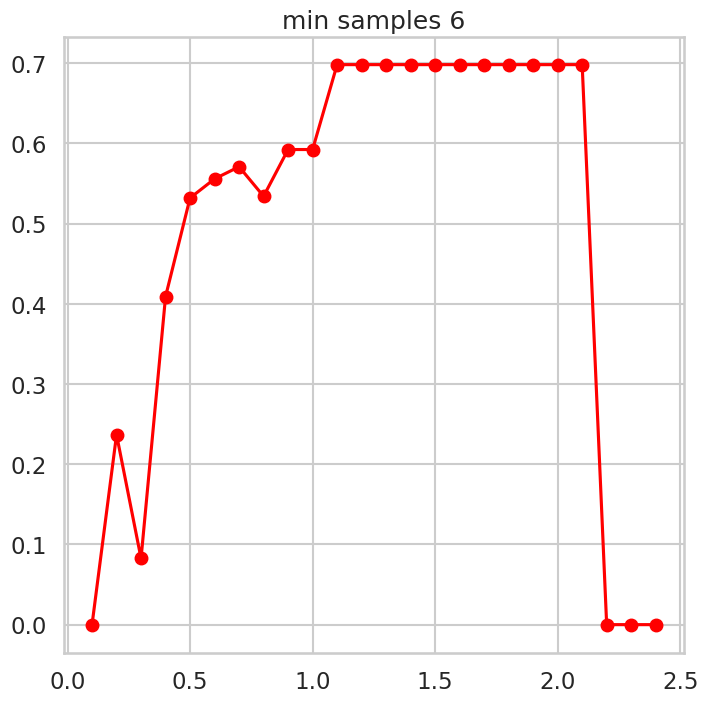

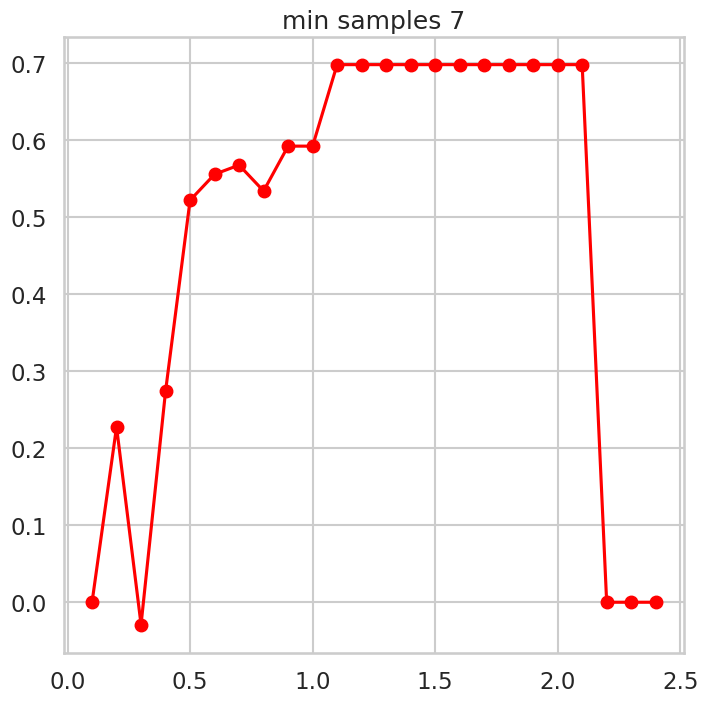

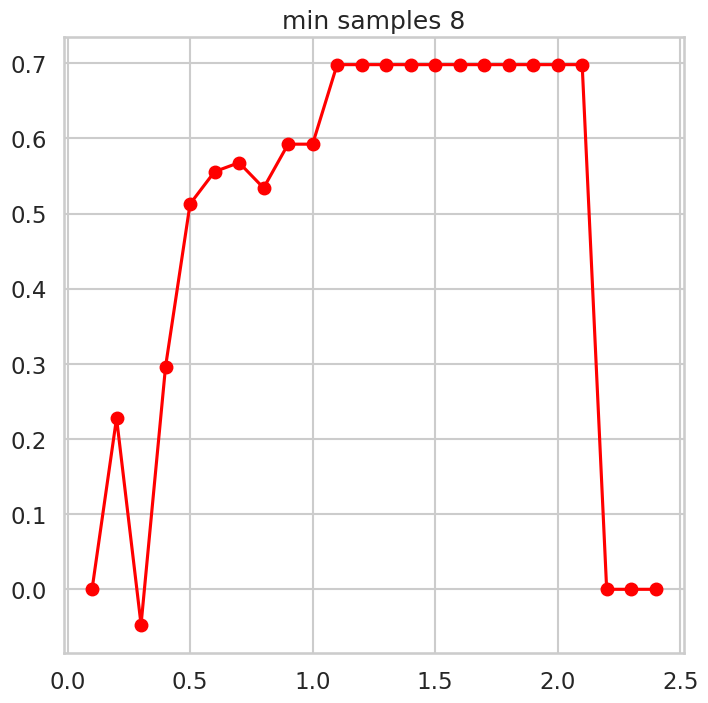

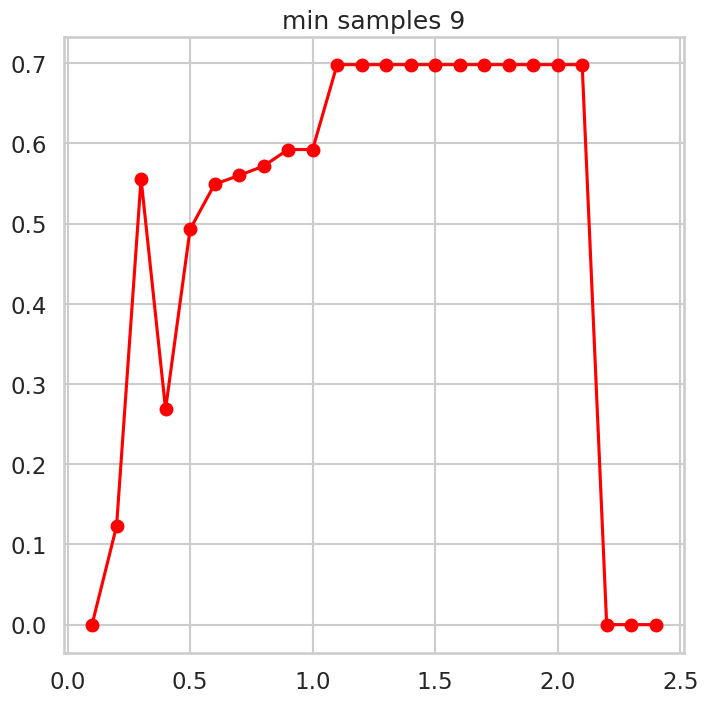

...

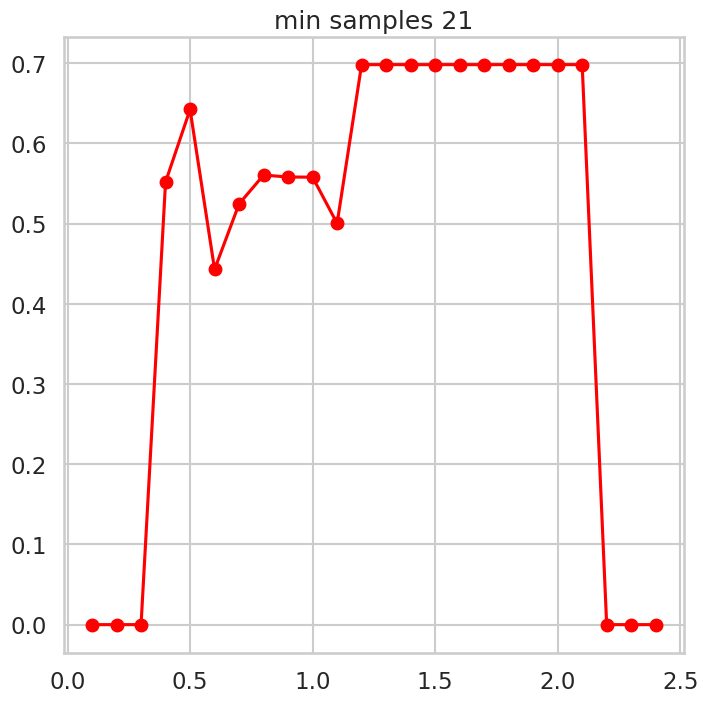

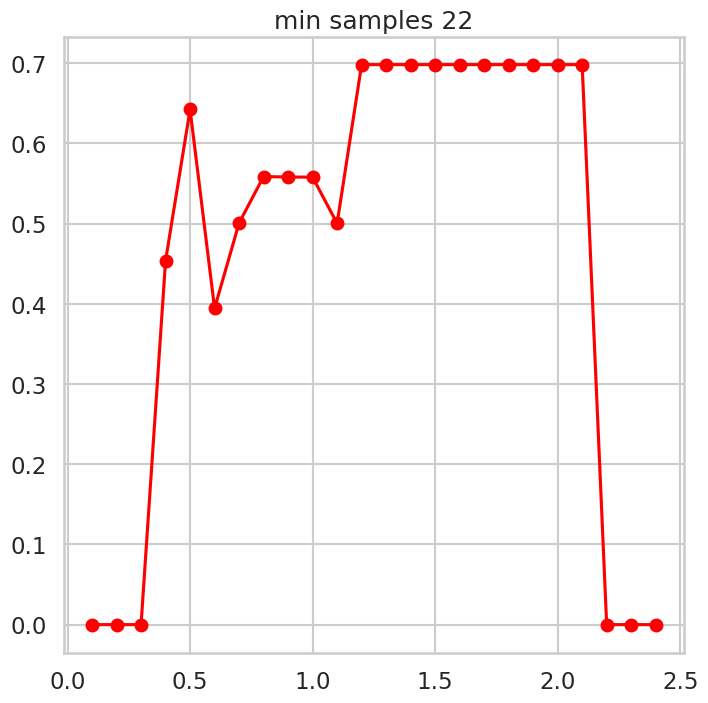

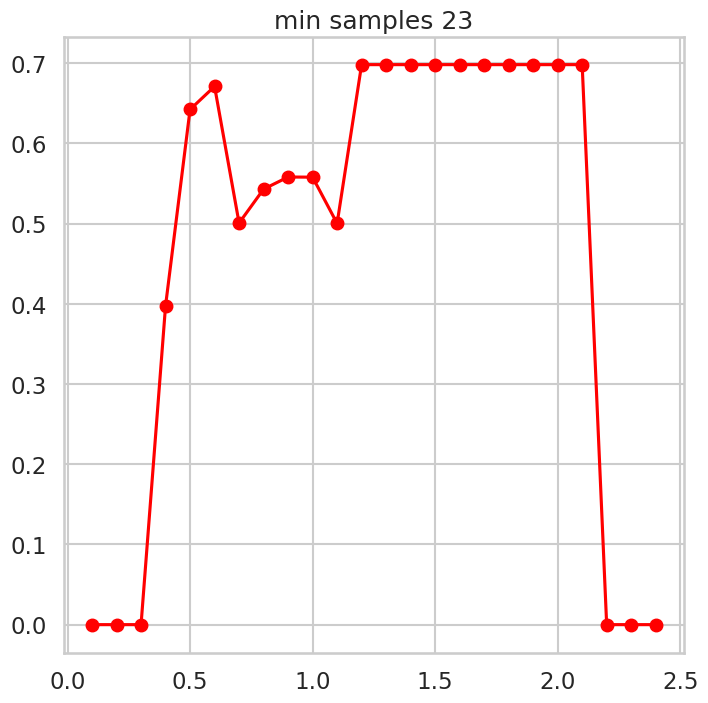

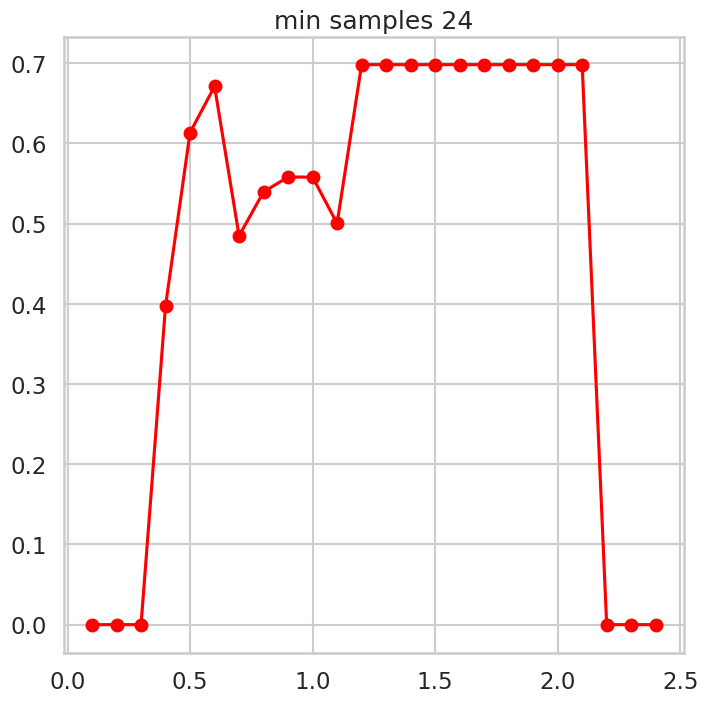

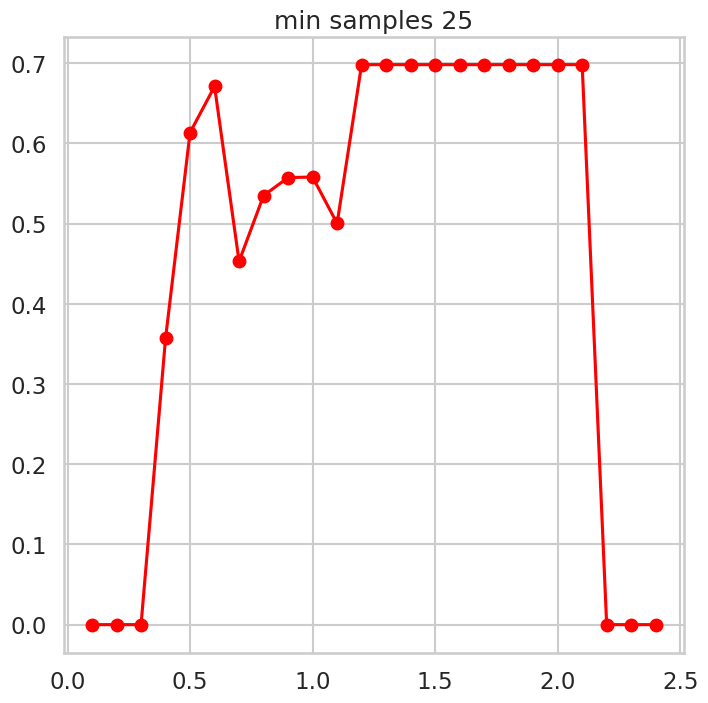

In [53]:
best_eps=0.1
best_min=5
best_s=-1
best_n_clusters = 0
for i in range(5,26):
  s = []
  for j in np.arange(0.1, 2.5, 0.1):
    dbscan = DBSCAN(eps=j, min_samples=i)
    cluster_labels = dbscan.fit_predict(df_pca)
    if len(np.unique(cluster_labels)) == 1:
      silhouette = 0
      s.append(silhouette)
      continue
    silhouette = silhouette_score(df_pca, cluster_labels)
    s.append(silhouette)
    if silhouette > best_s:
      best_eps=j
      best_min=i
      best_s=silhouette
      best_n_clusters = len(np.unique(cluster_labels))
  plt.figure()
  plt.title(f"min samples {i}")
  plt.plot(np.arange(0.1, 2.5, 0.1), s, marker='o', color='red')

print(f"Best DBScan clustering model for this data with epsilon {best_eps} and min samples {best_min} has silhouette score {best_s} and {best_n_clusters} clusters.")

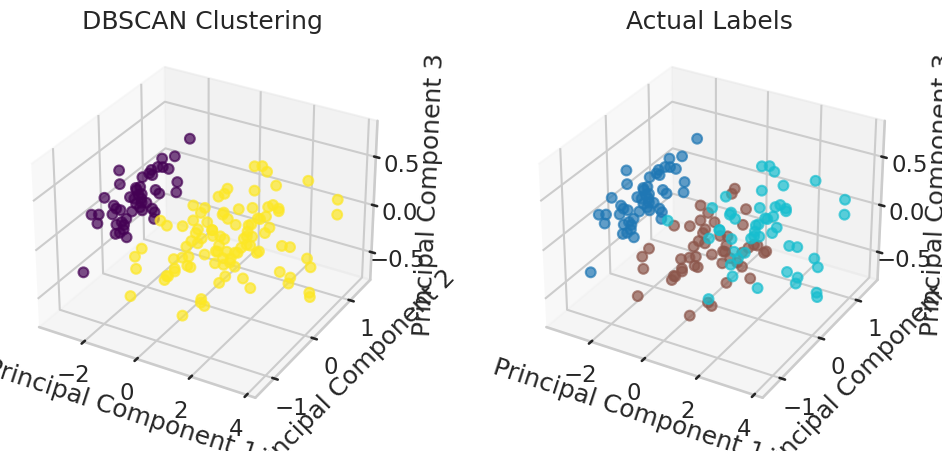

In [55]:
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt

# Apply DBSCAN clustering
dbscan = DBSCAN(eps=1.1, min_samples=5)
dbscan_clusters = dbscan.fit_predict(df_pca)

# Store clustering results
df_pca["Cluster"] = dbscan_clusters  # DBSCAN clusters
df_pca["Actual"] = iris_data.target  # Actual labels

# Create 3D scatter plot
fig = plt.figure(figsize=(12, 5))

# DBSCAN Clustering Plot
ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(df_pca["PC1"], df_pca["PC2"], df_pca["PC3"], c=df_pca["Cluster"], cmap="viridis", s=50, alpha=0.7)
ax1.set_title("DBSCAN Clustering")
ax1.set_xlabel("Principal Component 1")
ax1.set_ylabel("Principal Component 2")
ax1.set_zlabel("Principal Component 3")

# Actual Labels Plot
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca["PC1"], df_pca["PC2"], df_pca["PC3"], c=df_pca["Actual"], cmap="tab10", s=50, alpha=0.7)
ax2.set_title("Actual Labels")
ax2.set_xlabel("Principal Component 1")
ax2.set_ylabel("Principal Component 2")
ax2.set_zlabel("Principal Component 3")

plt.show()


###DBScan + scaling

Best DBScan clustering model for this data with epsilon 0.30000000000000004 and min samples 5 has silhouette score 0.8179024096892161 and 3 clusters.


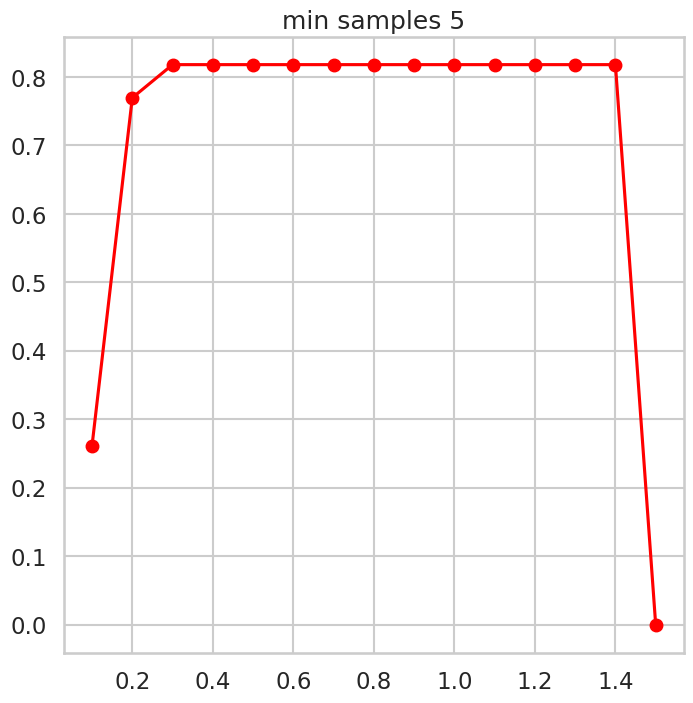

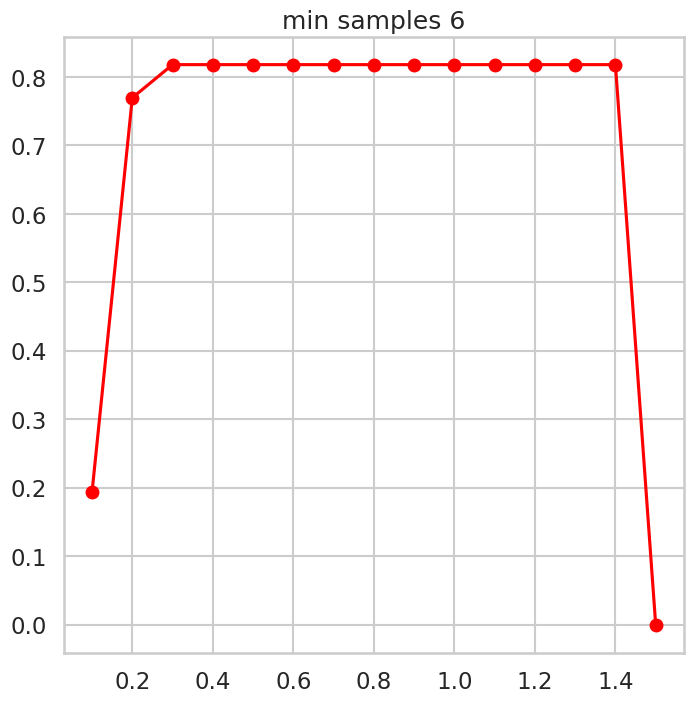

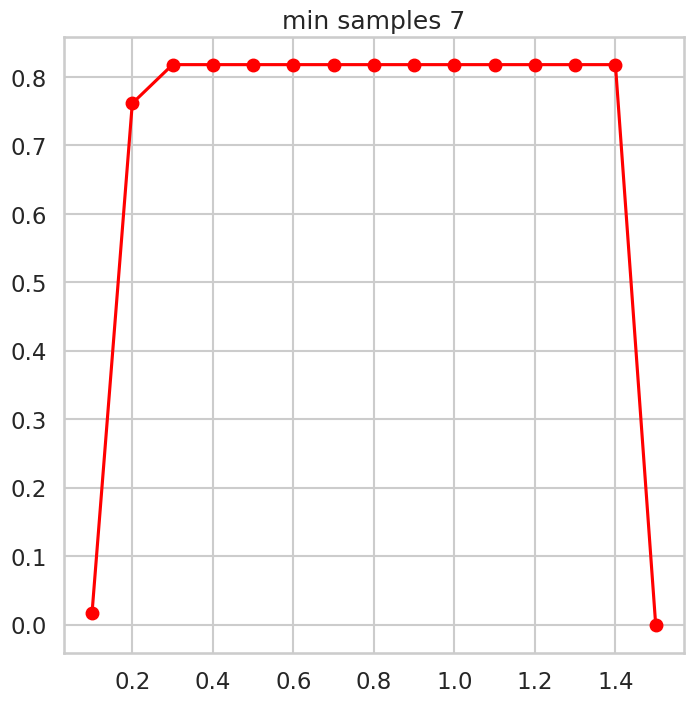

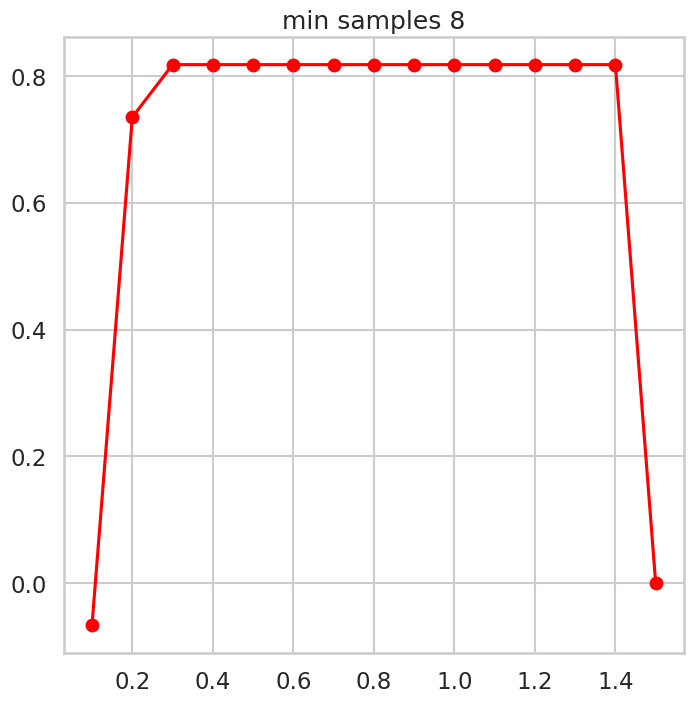

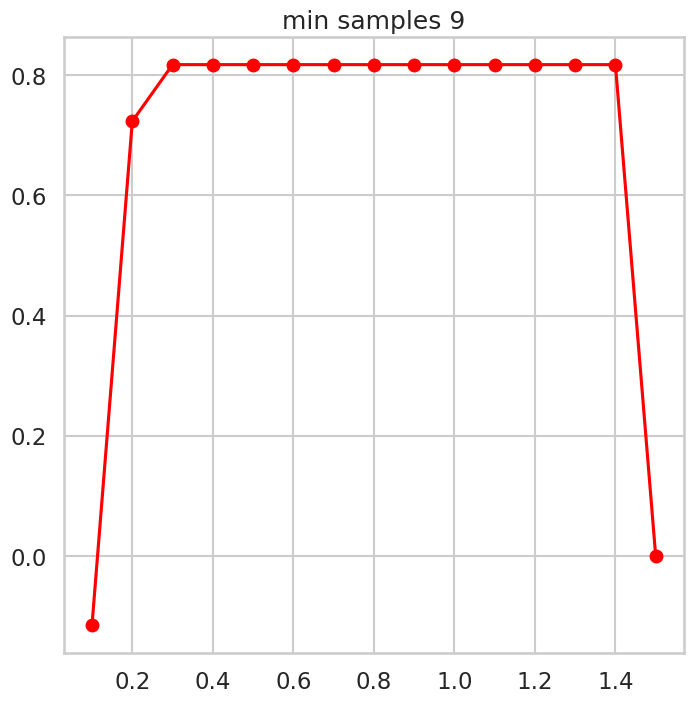

...

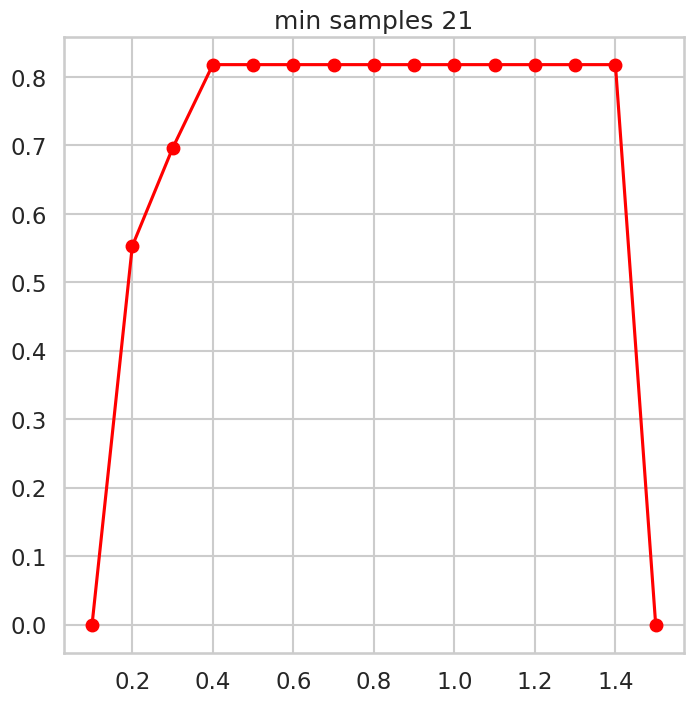

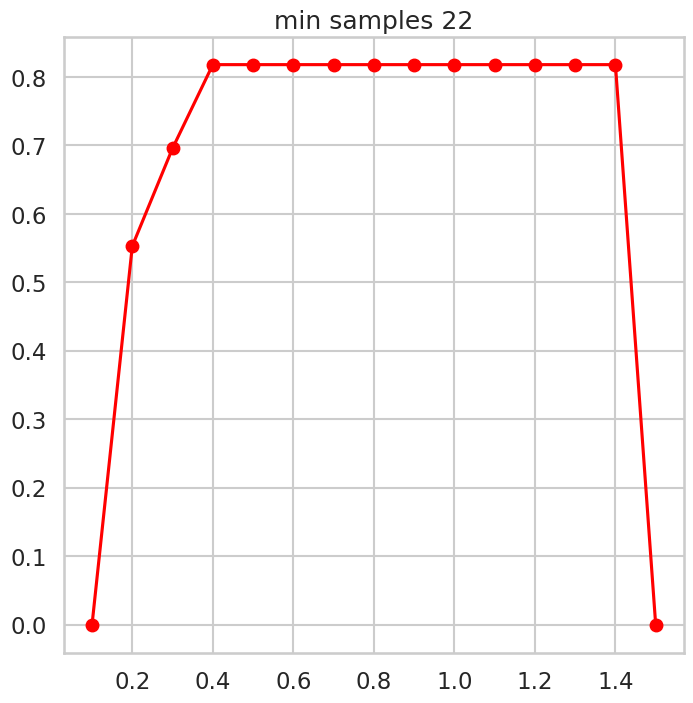

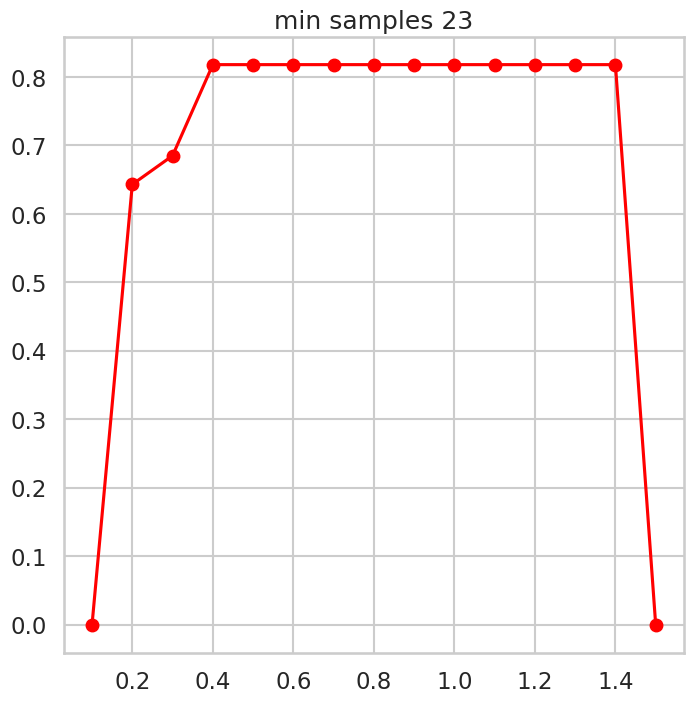

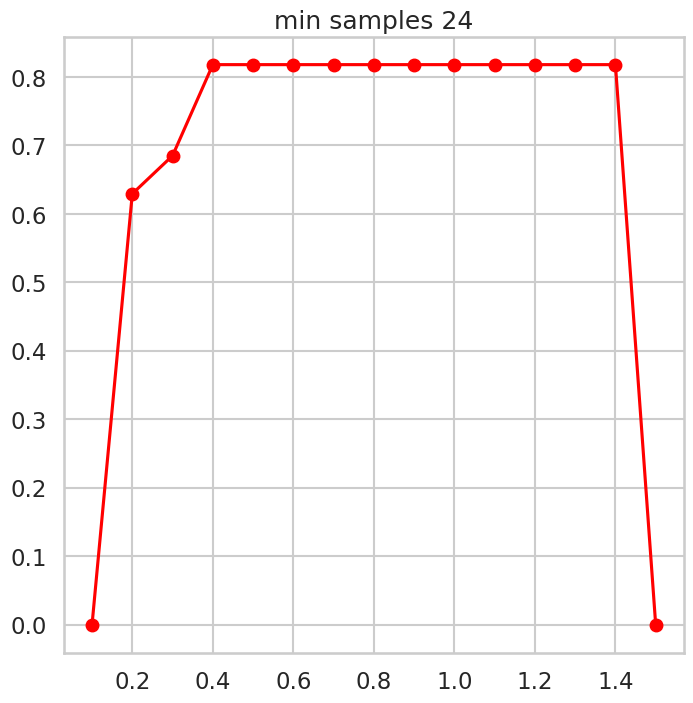

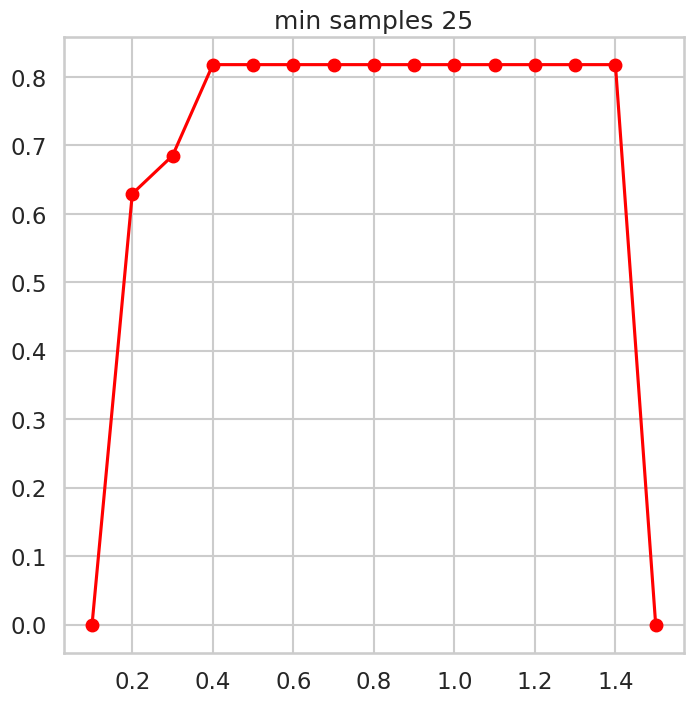

In [68]:
best_eps=0.1
best_min=5
best_s=-1
best_n_clusters = 0
for i in range(5,26):
  s = []
  for j in np.arange(0.1, 1.6, 0.1):
    dbscan = DBSCAN(eps=j, min_samples=i)
    cluster_labels = dbscan.fit_predict(df_pca_scaled)
    if len(np.unique(cluster_labels)) == 1:
      silhouette = 0
      s.append(silhouette)
      continue
    silhouette = silhouette_score(df_pca_scaled, cluster_labels)
    s.append(silhouette)
    if silhouette > best_s:
      best_eps=j
      best_min=i
      best_s=silhouette
      best_n_clusters = len(np.unique(cluster_labels))
  plt.figure()
  plt.title(f"min samples {i}")
  plt.plot(np.arange(0.1,1.6, 0.1), s, marker='o', color='red')

print(f"Best DBScan clustering model for this data with epsilon {best_eps} and min samples {best_min} has silhouette score {best_s} and {best_n_clusters} clusters.")

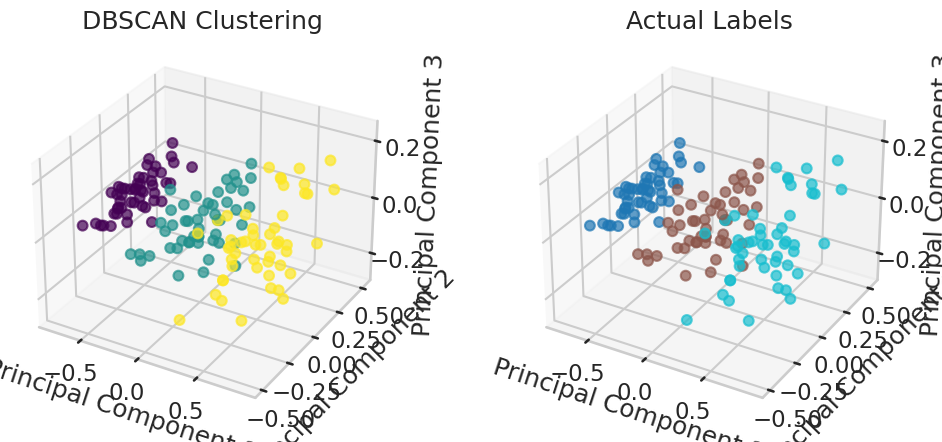

In [69]:
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt

# Apply DBSCAN clustering
dbscan = DBSCAN(eps=0.3, min_samples=5)
dbscan_clusters = dbscan.fit_predict(df_pca_scaled)

# Store clustering results
df_pca_scaled["Cluster"] = dbscan_clusters  # DBSCAN clusters
df_pca_scaled["Actual"] = iris_data.target  # Actual labels

# Create 3D scatter plot
fig = plt.figure(figsize=(12, 5))

# DBSCAN Clustering Plot
ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(df_pca_scaled["PC1"], df_pca_scaled["PC2"], df_pca_scaled["PC3"], c=df_pca_scaled["Cluster"], cmap="viridis", s=50, alpha=0.7)
ax1.set_title("DBSCAN Clustering")
ax1.set_xlabel("Principal Component 1")
ax1.set_ylabel("Principal Component 2")
ax1.set_zlabel("Principal Component 3")

# Actual Labels Plot
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca_scaled["PC1"], df_pca_scaled["PC2"], df_pca_scaled["PC3"], c=df_pca_scaled["Actual"], cmap="tab10", s=50, alpha=0.7)
ax2.set_title("Actual Labels")
ax2.set_xlabel("Principal Component 1")
ax2.set_ylabel("Principal Component 2")
ax2.set_zlabel("Principal Component 3")

plt.show()


* Repeat all the above clustering approaches and steps on the above data.
* Comment on the effect of scaling on clustering this dataset. Show the difference between clustering the data with and without   scaling.
* Compare between the different clustering approaches.
* Is your clustering outcome consistent with the labels?

1.  Best DBScan clustering model for scaled data with epsilon 1.1 and min samples 5 has silhouette score 0.698 and 2 clusters.
2.  Best DBScan clustering model for unscaled data with epsilon 0.3 and min samples 5 has silhouette score 0.81 and 3 clusters.
3. scaling the data improved the silhouette score and successfully clustered the data into 3 clusters
4.  Comparing the actual labels with the clustering results shows that scaling the data + using DBscan clustering correctly clusters the data points with the actual labels
5. Scaling this data helps agglomerative and DBscan to correctly cluster the data into 3 clusters. DBscan (0.81)  has higher silhouette score than agglomerative (0.77)

##Customer dataset
Repeat all the above on the customer data set

In [71]:
df = pd.read_csv('Customer data.csv')
df.set_index('ID', inplace=True) # set the ID as the index of the dataset
df.head()

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
ID,,,,,,,
100000001,0,0,67,2,124670,1,2
100000002,1,1,22,1,150773,1,2
100000003,0,0,49,1,89210,0,0
100000004,0,0,45,1,171565,1,1
100000005,0,0,53,1,149031,1,1


In [72]:
from sklearn.decomposition import PCA

print("correlaction between dataset features")
print(df.corr())
# correlation between income and occupation of 0.68 and education
# and age of 0.65 which means these features can be represented as one fetaure
# therefor reducing the dimension of the dataset to 5 features
pca = PCA(n_components=5)
df_pca = pca.fit_transform(df)
df_pca = pd.DataFrame(df_pca, columns=['PC1', 'PC2','PC3','PC4','PC5'])
print("correlaction between dataset features after PCA")
print(df_pca.corr())
# no correlation between the new features after PCA

correlaction between dataset features
                      Sex  Marital status       Age  Education    Income  \
Sex              1.000000        0.566511 -0.182885   0.244838 -0.195146   
Marital status   0.566511        1.000000 -0.213178   0.374017 -0.073528   
Age             -0.182885       -0.213178  1.000000   0.654605  0.340610   
Education        0.244838        0.374017  0.654605   1.000000  0.233459   
Income          -0.195146       -0.073528  0.340610   0.233459  1.000000   
Occupation      -0.202491       -0.029490  0.108388   0.064524  0.680357   
Settlement size -0.300803       -0.097041  0.119751   0.034732  0.490881   

                 Occupation  Settlement size  
Sex               -0.202491        -0.300803  
Marital status    -0.029490        -0.097041  
Age                0.108388         0.119751  
Education          0.064524         0.034732  
Income             0.680357         0.490881  
Occupation         1.000000         0.571795  
Settlement size    0.571

In [73]:
# perform the same steps but with scaled data using minmax scaler
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df)

print("correlaction between dataset features")
print(df.corr())
pca = PCA(n_components=5)
df_scaled = pca.fit_transform(df_scaled)
df_scaled = pd.DataFrame(df_scaled, columns=['PC1', 'PC2','PC3','PC4','PC5'])
print("correlaction between dataset features after PCA")
print(df_scaled.corr())

correlaction between dataset features
                      Sex  Marital status       Age  Education    Income  \
Sex              1.000000        0.566511 -0.182885   0.244838 -0.195146   
Marital status   0.566511        1.000000 -0.213178   0.374017 -0.073528   
Age             -0.182885       -0.213178  1.000000   0.654605  0.340610   
Education        0.244838        0.374017  0.654605   1.000000  0.233459   
Income          -0.195146       -0.073528  0.340610   0.233459  1.000000   
Occupation      -0.202491       -0.029490  0.108388   0.064524  0.680357   
Settlement size -0.300803       -0.097041  0.119751   0.034732  0.490881   

                 Occupation  Settlement size  
Sex               -0.202491        -0.300803  
Marital status    -0.029490        -0.097041  
Age                0.108388         0.119751  
Education          0.064524         0.034732  
Income             0.680357         0.490881  
Occupation         1.000000         0.571795  
Settlement size    0.571

###k-means

In [74]:
sum2_dist = []
scores = []

for k in range(2,20):
    model = KMeans(n_clusters=k, random_state=42)
    labels = model.fit_predict(df_pca)
    sum2_dist.append(model.inertia_)
    scores.append(silhouette_score(df_pca, labels))

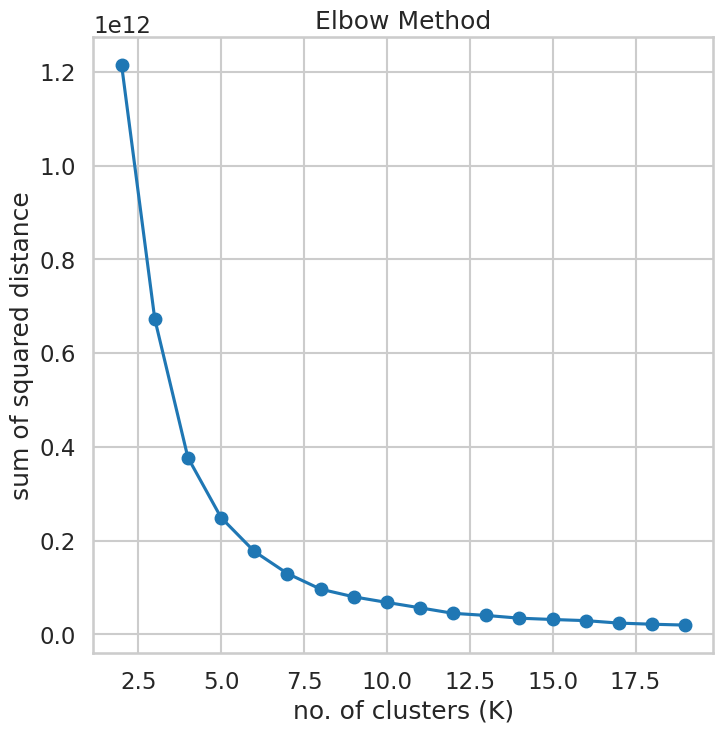

In [75]:
plt.plot(range(2,20), sum2_dist, marker='o')
plt.xlabel('no. of clusters (K)')
plt.ylabel('sum of squared distance')
plt.title('Elbow Method')
plt.show()

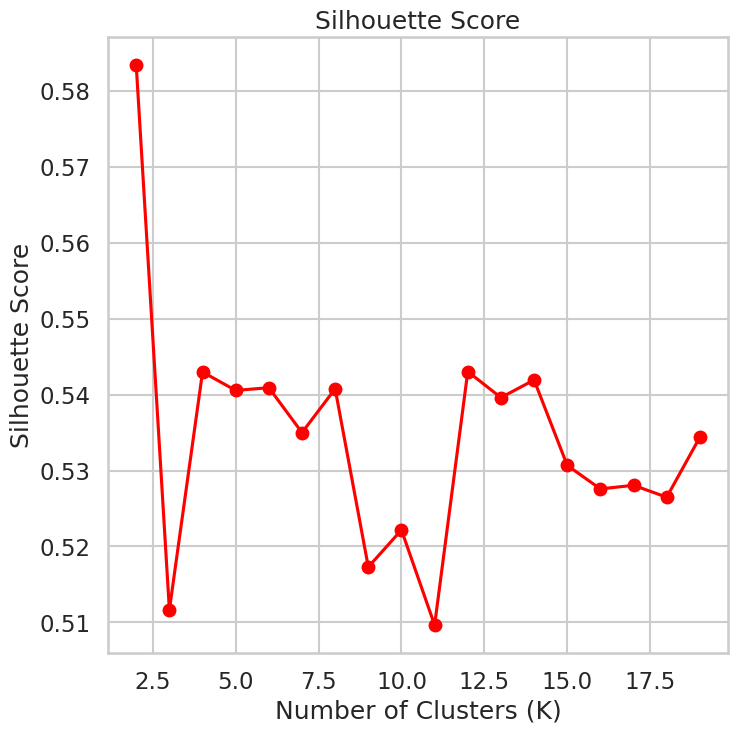

In [76]:
plt.plot(range(2,20), scores, marker='o', color='red')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score')
plt.show()

1. sum of squared distances graph:
There is no sharp elbow in the graph, however the rate of decrease slows down at k=4. Therefore, the optimal k = 4.
2. silhouette score:
The silhouette score is highest at k =2. However, to align the silhouette score with the sum of squared distances the optimal k can be choosen as K=4 also since the decrease in the silhouette score is not that big (almost 0.04)

###k-means + scaling

In [77]:
sum2_dist = []
scores = []
for k in range(2,20):
    model = KMeans(n_clusters=k, random_state=42)
    labels = model.fit_predict(df_scaled)
    sum2_dist.append(model.inertia_)
    scores.append(silhouette_score(df_scaled, labels))

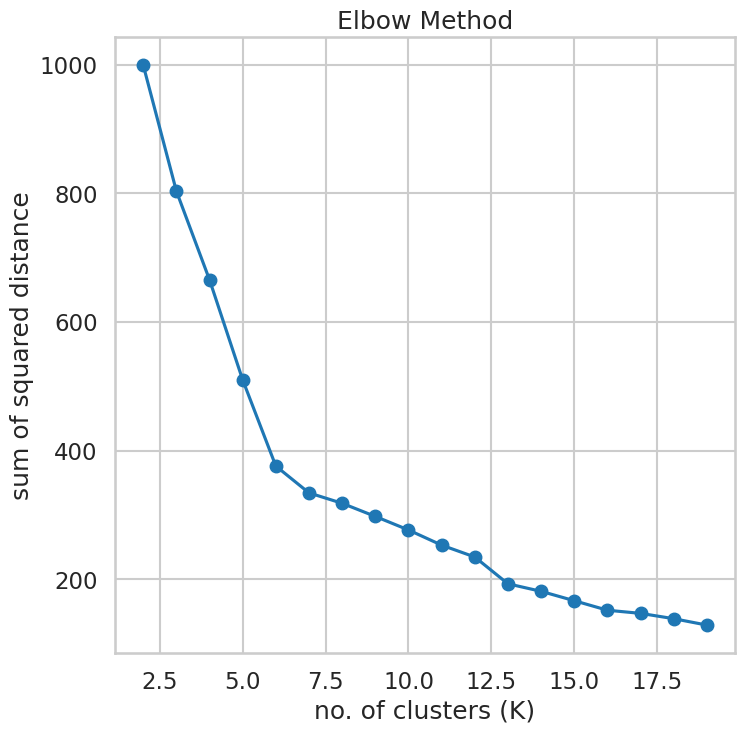

In [78]:
plt.plot(range(2,20), sum2_dist, marker='o')
plt.xlabel('no. of clusters (K)')
plt.ylabel('sum of squared distance')
plt.title('Elbow Method')
plt.show()

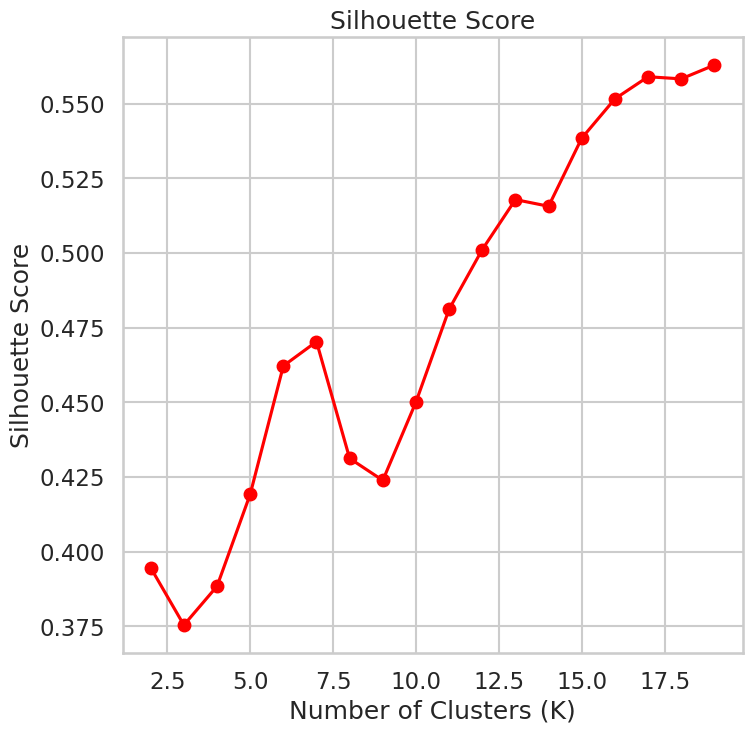

In [79]:
plt.plot(range(2,20), scores, marker='o', color='red')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score')
plt.show()

1. sum of squared distances graph:
There is no sharp elbow in the graph, however the rate of decrease slows down at k=7. Therefore, the optimal k = 7.
2. silhouette score:
The silhouette score increases with increasing the K (the graph does not peak). This means that increasing K overfits the clustering model to the data. To align the sum of squared distances result and the silhouette score and to avoid choosing a K that will overfit the first peak in the graph is schosen as the optimal k, k=7
3. evaluating the effact of scaling the data:
scaling the data does not improve the silhouette score. The silhouette score of the non-scaled data = 0.545 with 4 clusters while with the scaled data = 0.475 and 7 clusters.


###Agglomerative




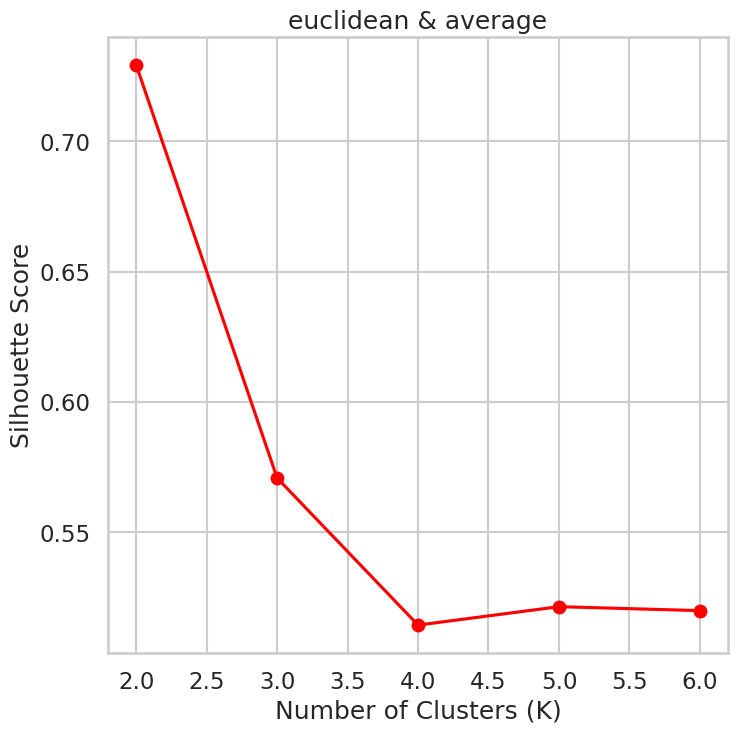

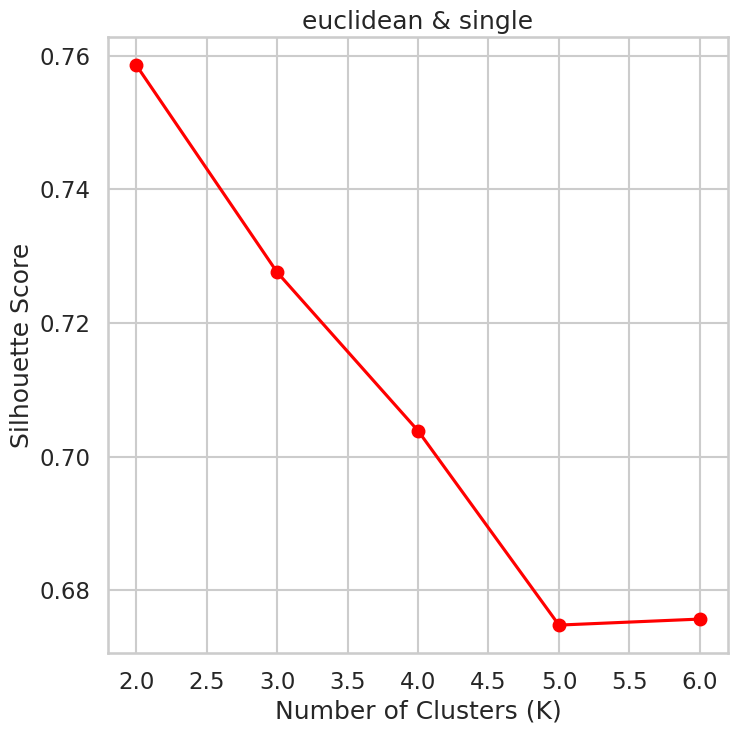

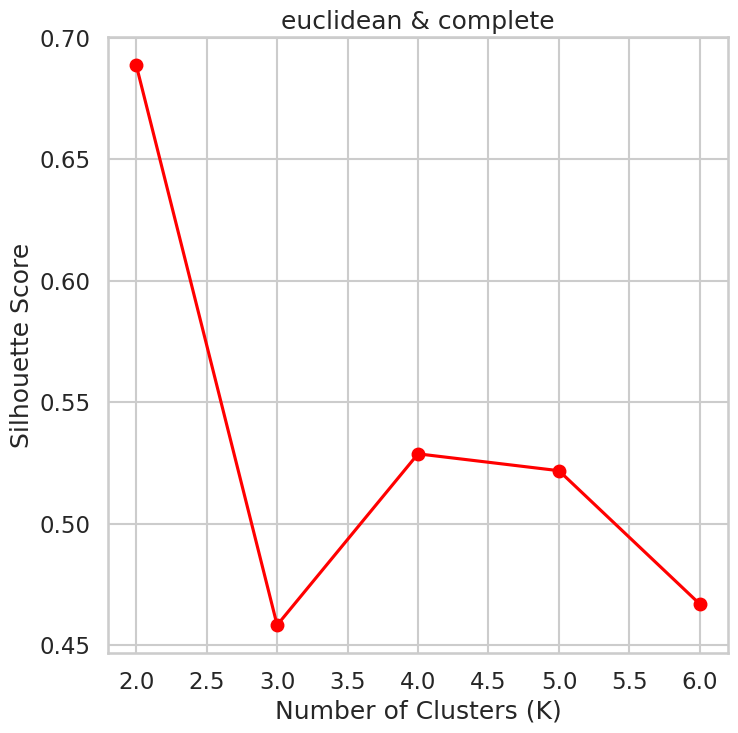

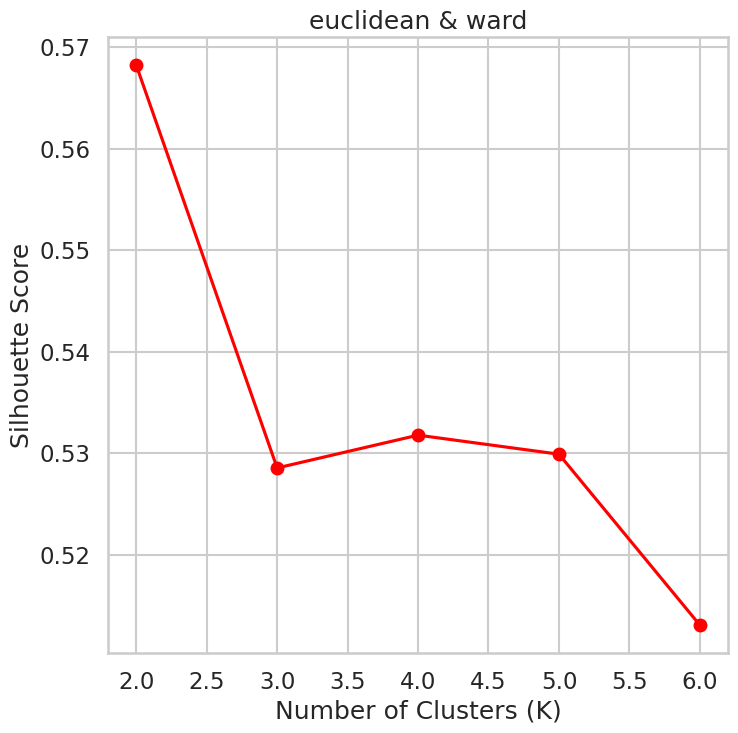

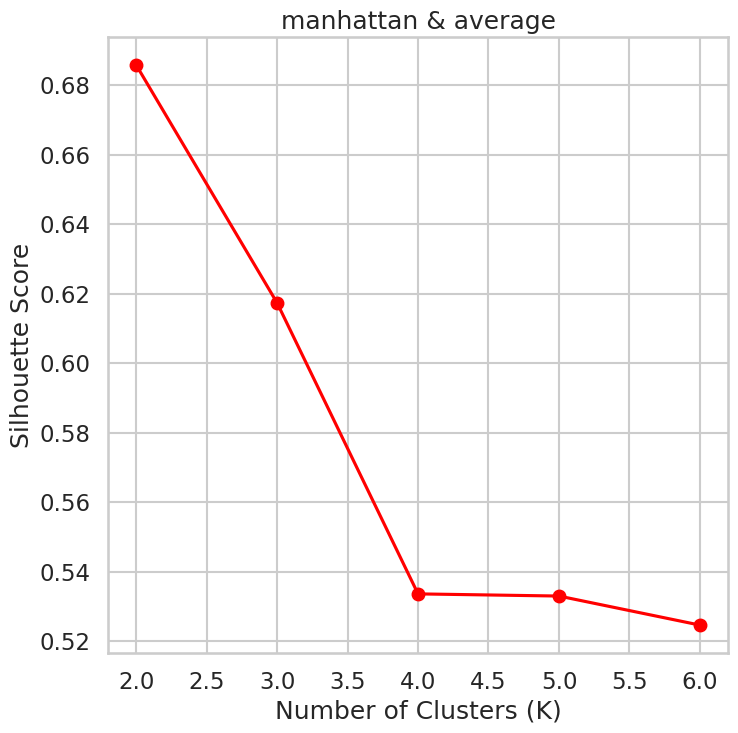

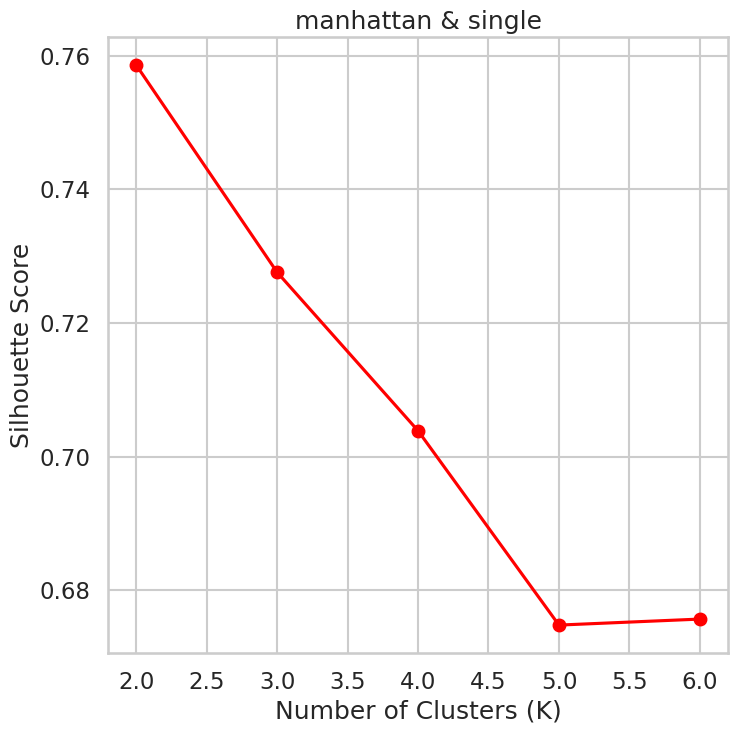

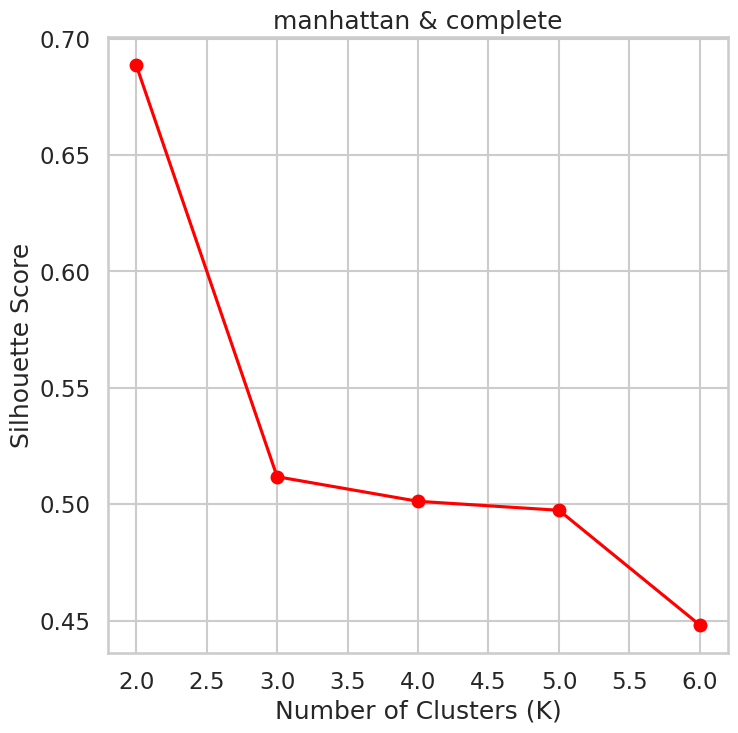

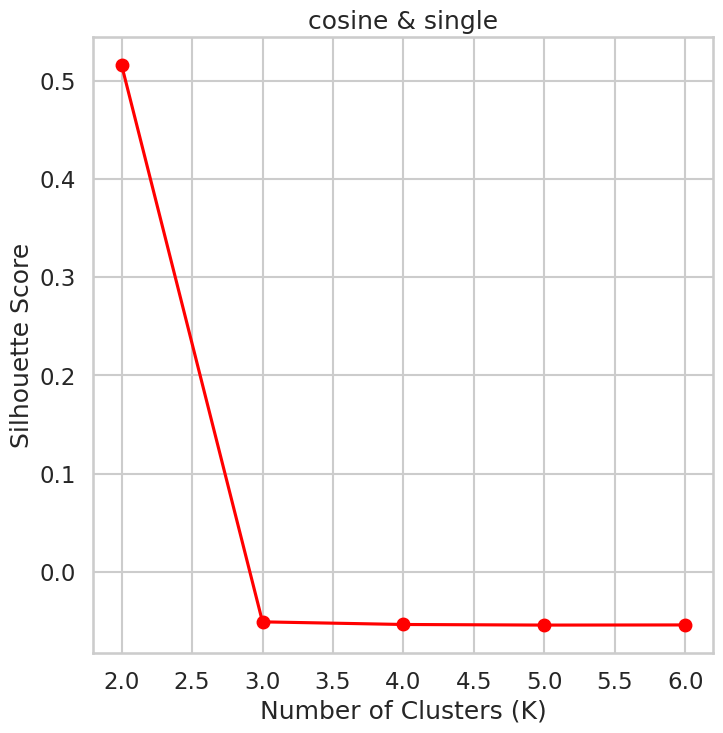

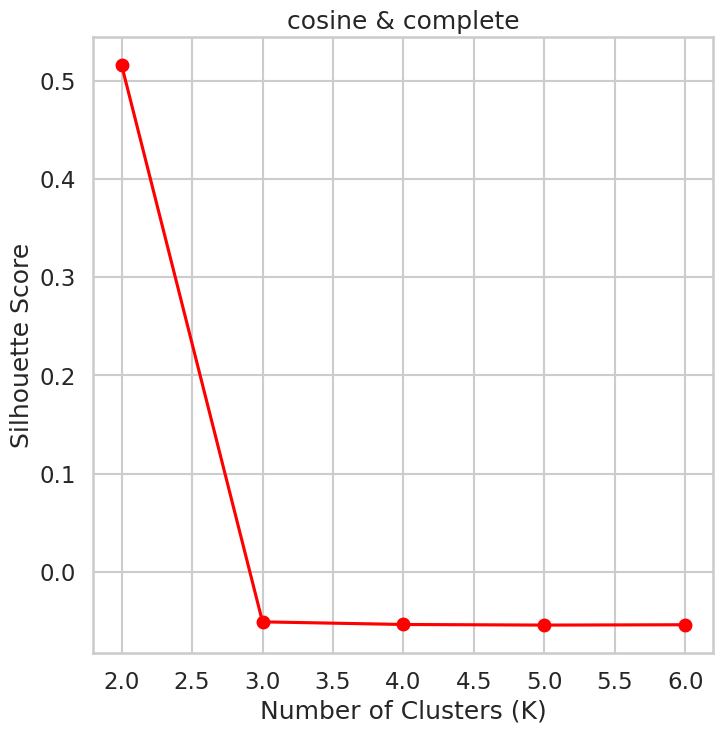

Agglomerative clustering model with optimal parameters for this data is n_clusters = 2 ,linkage = single & affinity = euclidean. Silhouette Score = 0.758568225287424.


In [80]:
s=[]
linkage_list=["average","single","complete","ward"]
affinity_list=["euclidean","manhattan","cosine"]
n=np.arange(2,7)
best=-1
best_affinity=" "
best_n=1
best_linkage= " "
for affinity in affinity_list:
  for linkage in linkage_list:
    s=[]
    for n_clusters in n:
      # exlcuding linkage and affinity combiniations that do not work together
      if (linkage=="average" and affinity=="cosine"):
        continue
      if (linkage == "ward" and (affinity == "manhattan" or affinity =="cosine")):

        continue
      model = AgglomerativeClustering(n_clusters=n_clusters, metric=affinity, linkage=linkage )
      model = model.fit(df_pca)

      silhouette=silhouette_score(df_pca,model.labels_)
      s.append(silhouette)
      if silhouette > best:
          best_n=n_clusters
          best =silhouette
          best_affinity=affinity
          best_linkage=linkage
    if s:
      plt.plot(range(2,7), s, marker='o', color='red')
      plt.xlabel('Number of Clusters (K)')
      plt.ylabel('Silhouette Score')
      plt.title(f"{affinity} & {linkage}")

    plt.show()
print("Agglomerative clustering model with optimal parameters for this data is n_clusters ="+" " + str(best_n)+" " +",linkage = "
      +str(best_linkage)+" & affinity = "+str(best_affinity)+". " "Silhouette Score = "+str(best)+".")

###Agglomerative + scaling

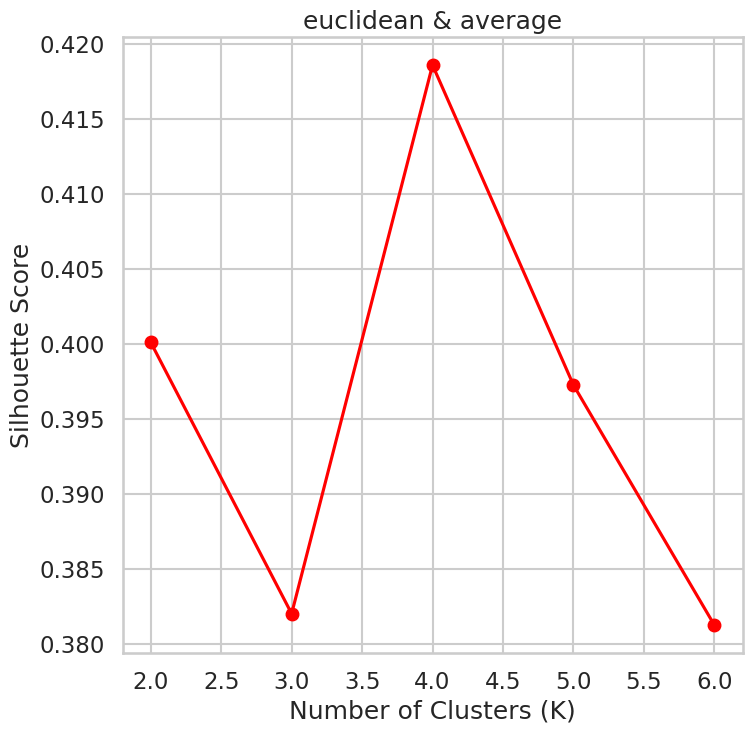

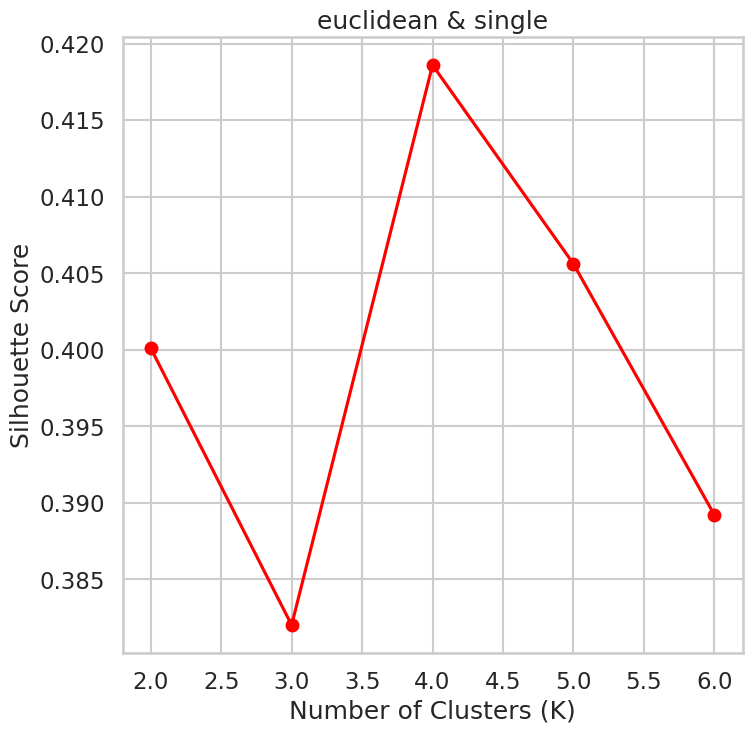

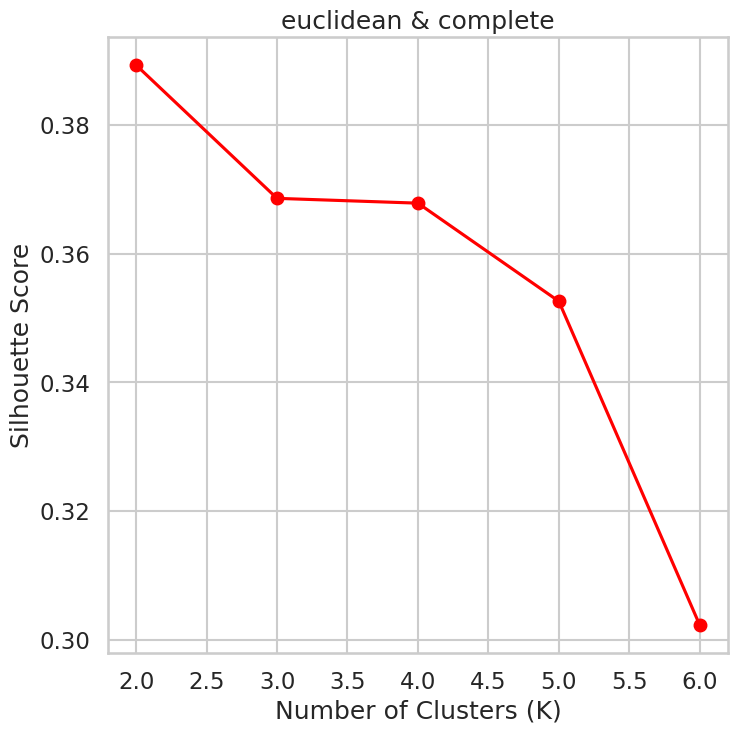

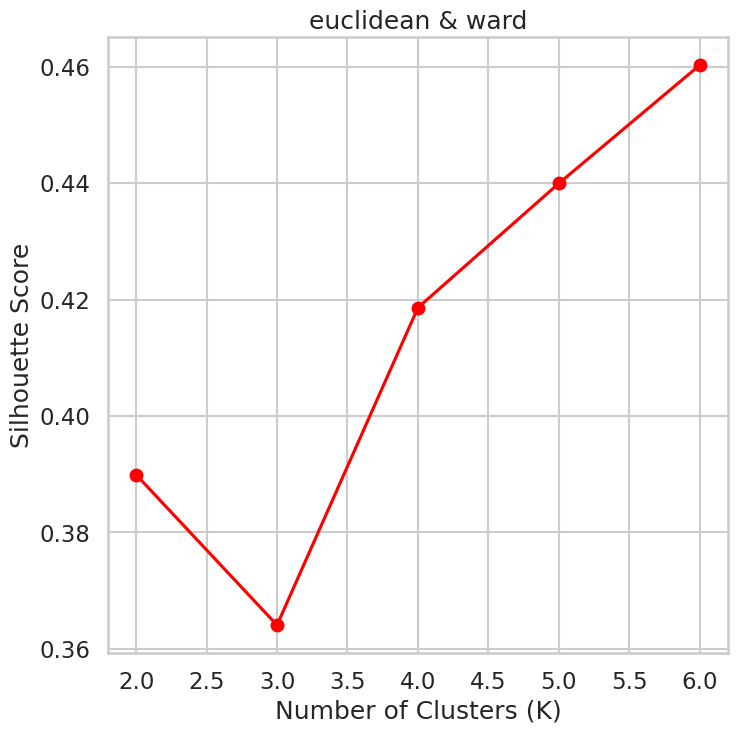

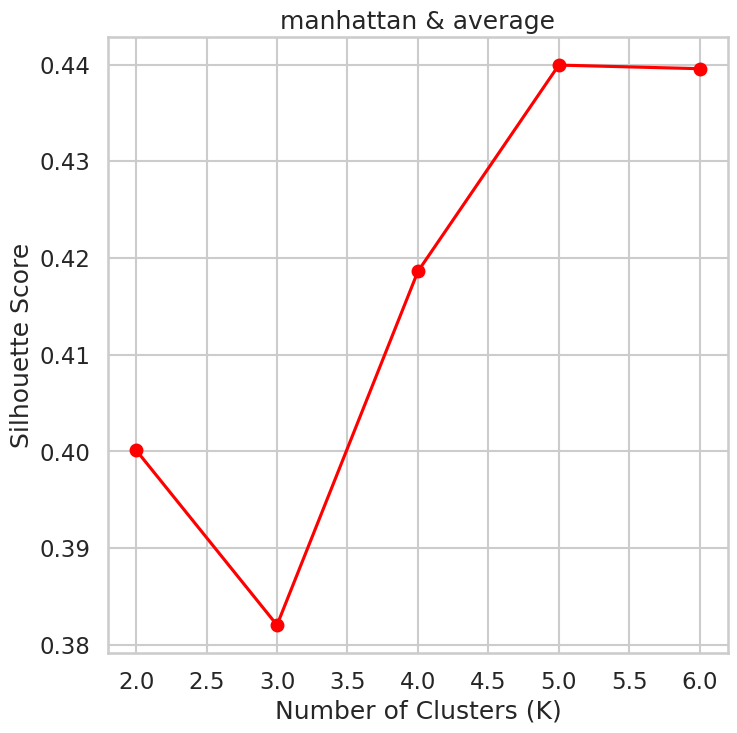

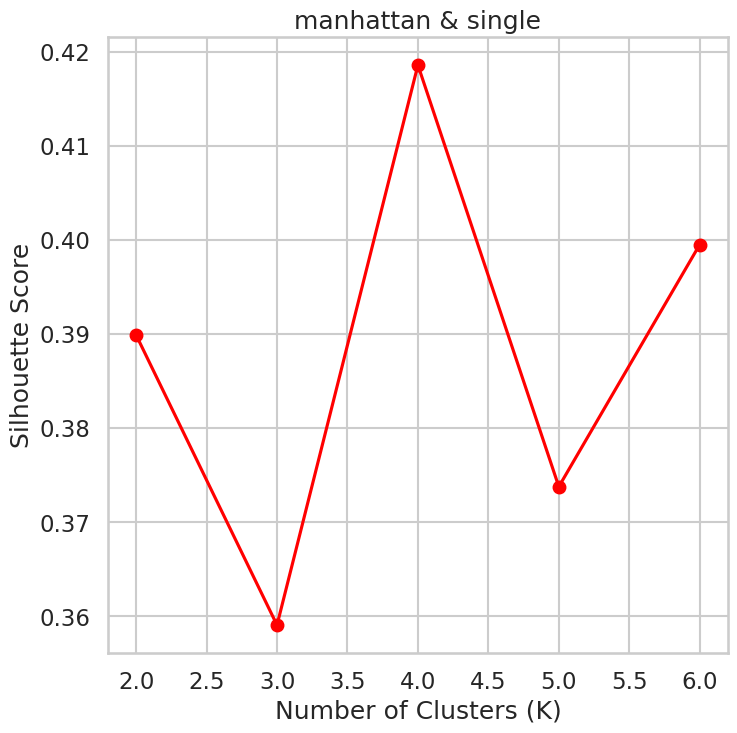

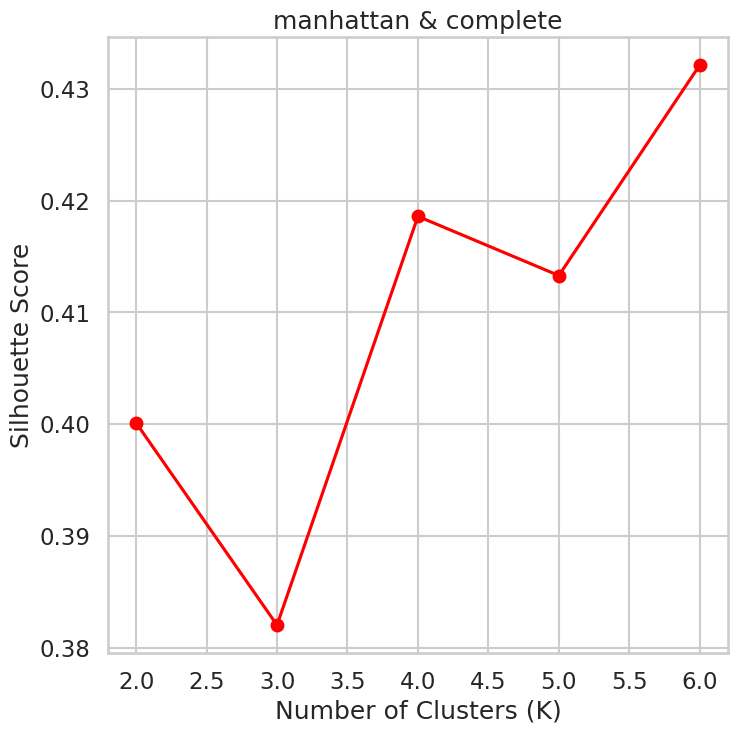

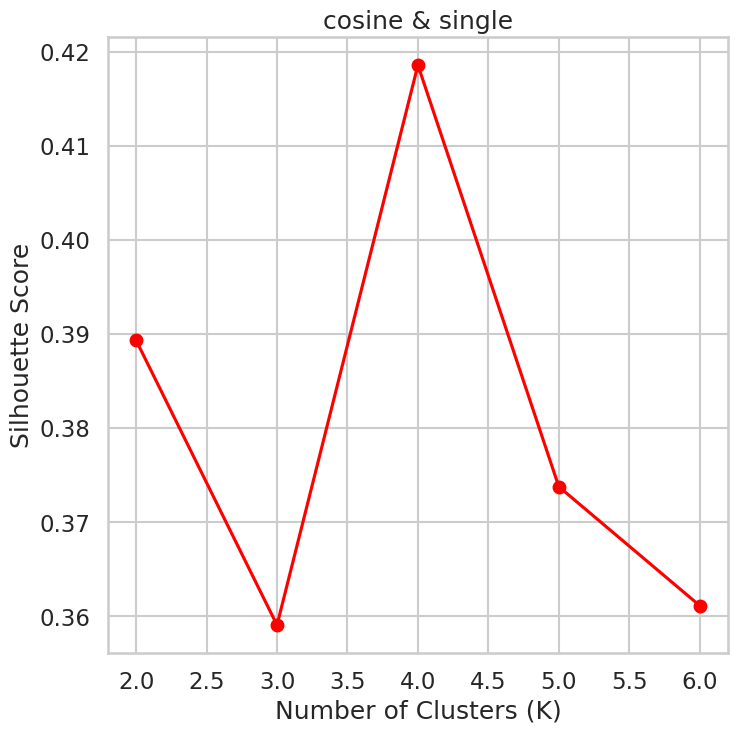

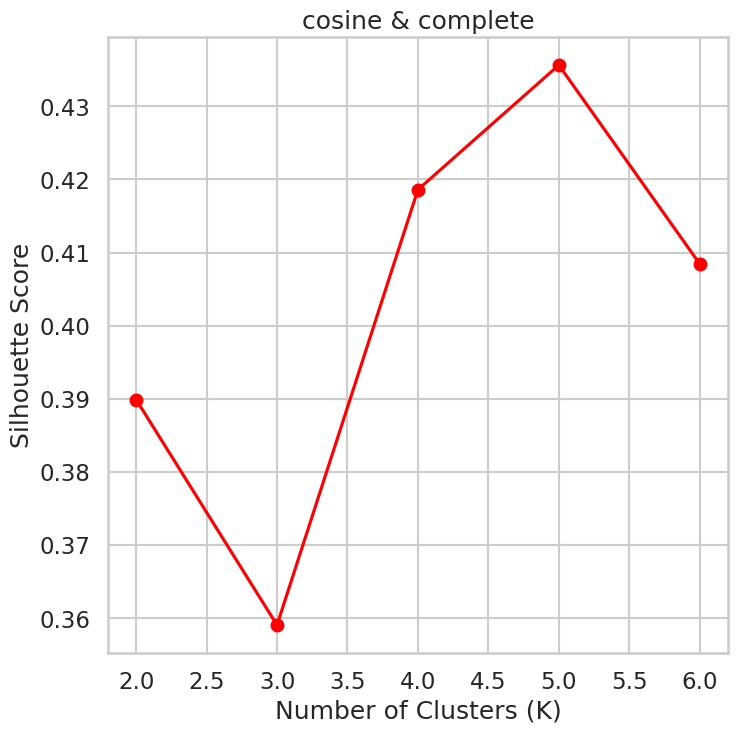

Agglomerative clustering model with optimal parameters for this data is n_clusters = 6 ,linkage = ward & affinity = euclidean. Silhouette Score = 0.4602582789460427.


In [81]:
s=[]
linkage_list=["average","single","complete","ward"]
affinity_list=["euclidean","manhattan","cosine"]
n=np.arange(2,7)
best=-1
best_affinity=" "
best_n=1
best_linkage= " "
for affinity in affinity_list:
  for linkage in linkage_list:
    s=[]
    for n_clusters in n:
      if (linkage=="average" and affinity=="cosine"):
        continue
      if (linkage == "ward" and affinity != "euclidean"):
        continue
      model = AgglomerativeClustering(n_clusters=n_clusters, metric=affinity, linkage=linkage )
      model = model.fit(df_scaled)

      silhouette=silhouette_score(df_scaled,model.labels_)
      s.append(silhouette)
      if silhouette > best:
          best_n=n_clusters
          best =silhouette
          best_affinity=affinity
          best_linkage=linkage
    if s:
      plt.plot(range(2,7), s, marker='o', color='red')
      plt.xlabel('Number of Clusters (K)')
      plt.ylabel('Silhouette Score')
      plt.title(f"{affinity} & {linkage}")

    plt.show()
print("Agglomerative clustering model with optimal parameters for this data is n_clusters ="+" " + str(best_n)+" " +",linkage = "
      +str(best_linkage)+" & affinity = "+str(best_affinity)+". " "Silhouette Score = "+str(best)+".")

1. non-scaled data:
Agglomerative clustering model with optimal parameters for non-scaled data is n_clusters = 2 ,linkage = single & affinity = euclidean.
Silhouette Score = 0.758
2. scaled data:
Agglomerative clustering model with optimal parameters for scaled data is n_clusters = 6 ,linkage = ward & affinity = euclidean.
Silhouette Score = 0.460
3. evaluating the effact of scaling the data:
scaling the data does not improve the silhouette score. The silhouette score of the non-scaled data = 0.758  with 2 clusters while with the scaled data = 0.460 and 6 clusters.

###DBScan

DBScan clustering model with optimal parameters for this data with epsilon 0.1 and min samples 5 has silhouette score -1 and 0 clusters.


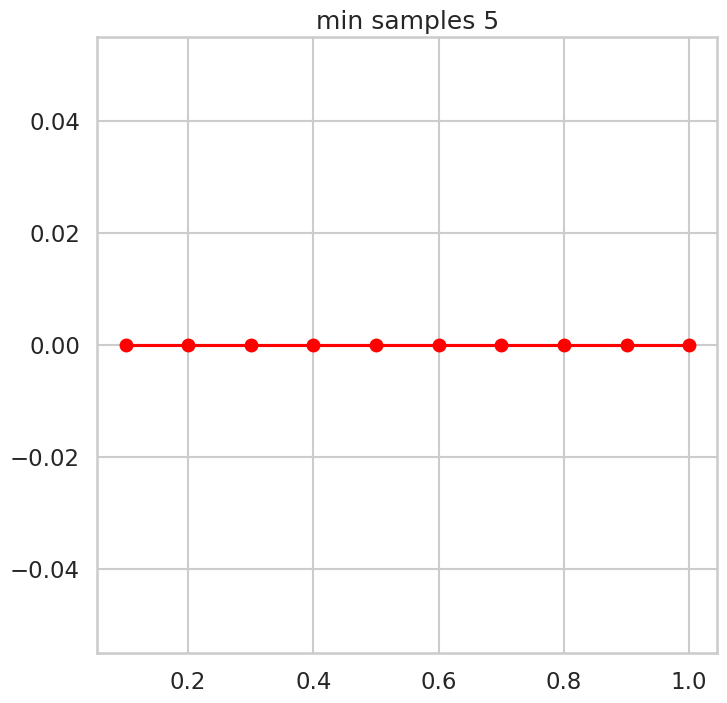

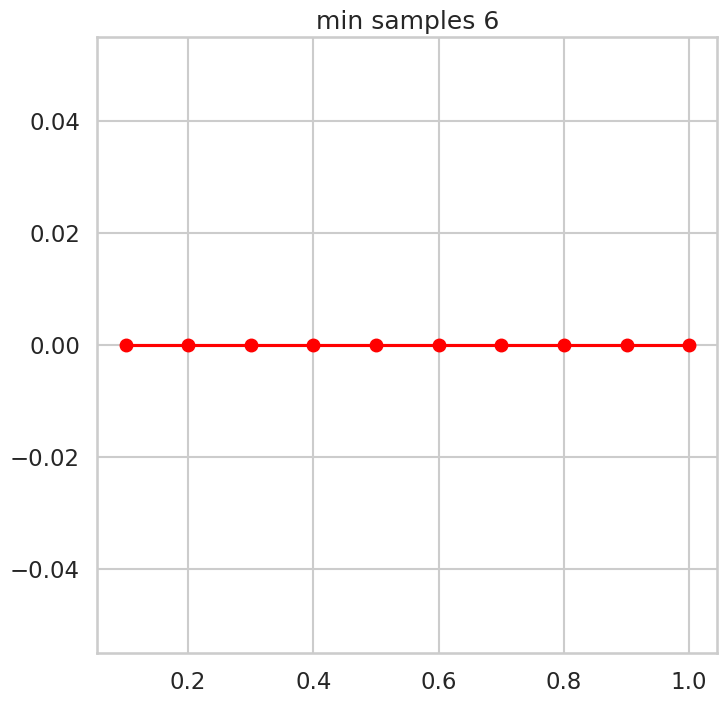

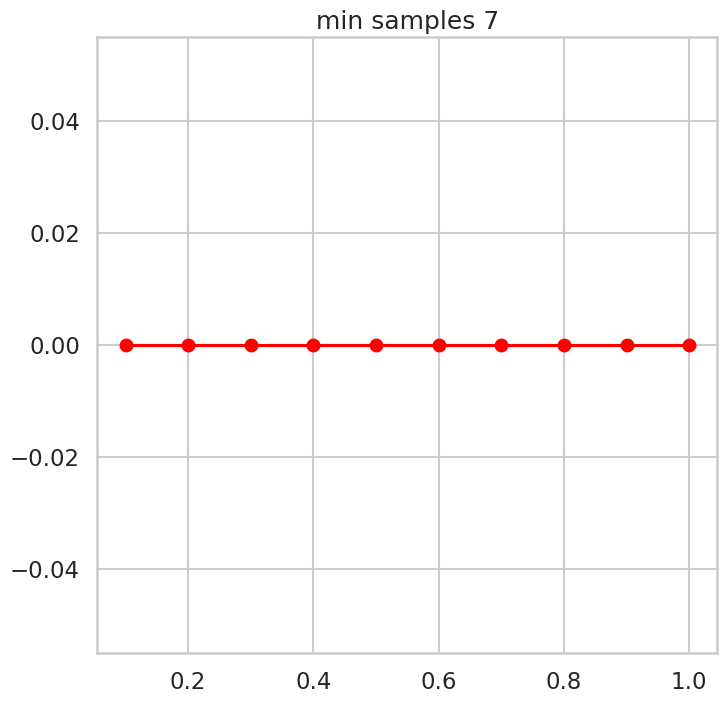

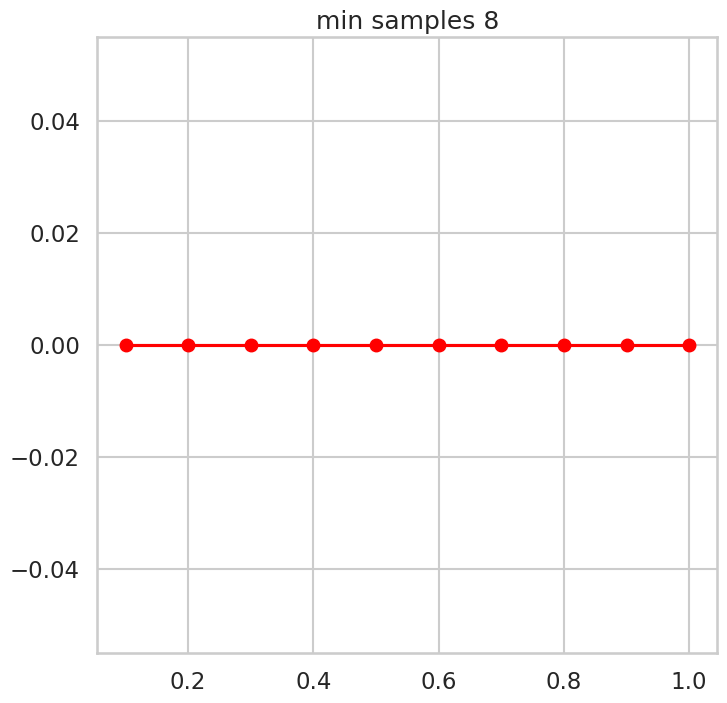

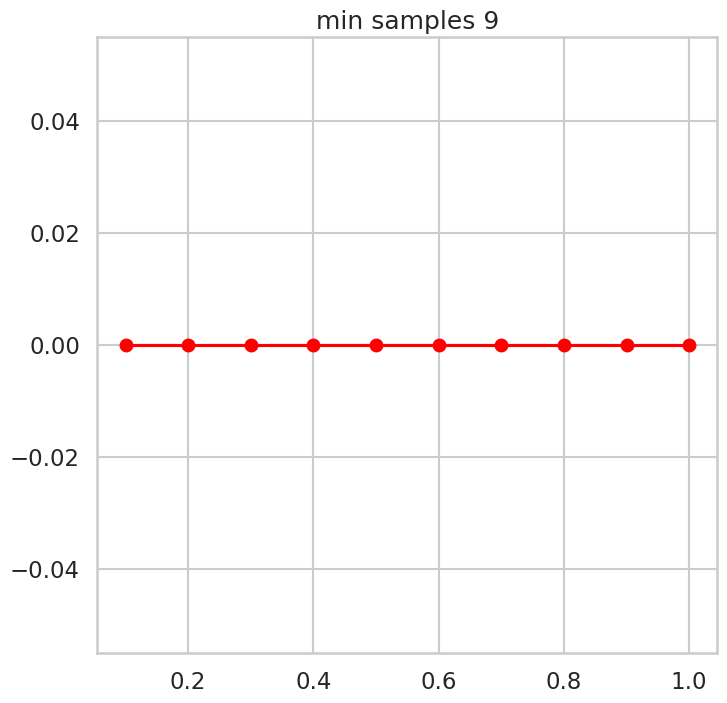

...

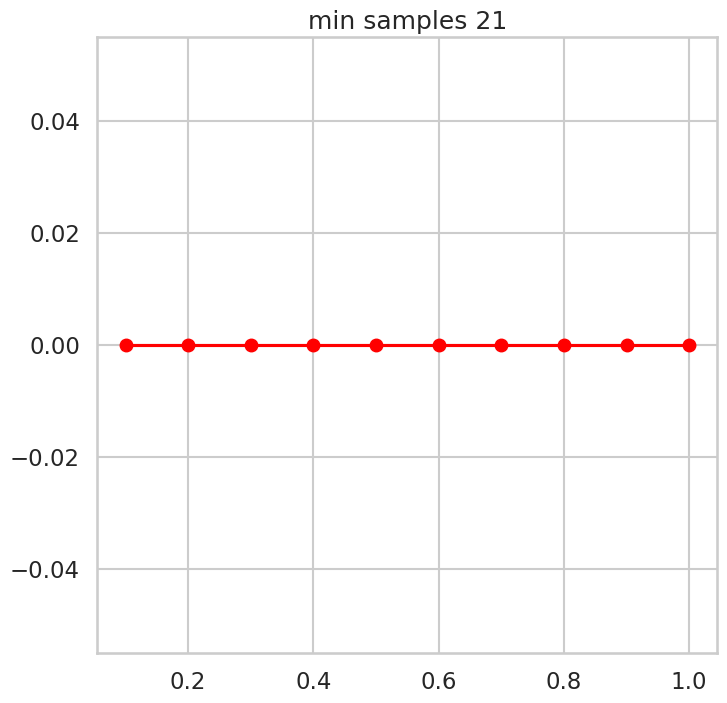

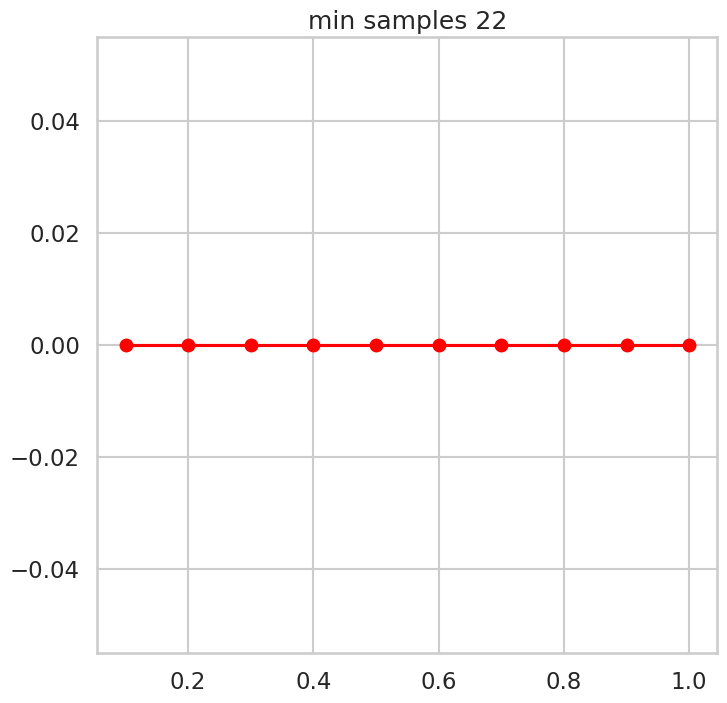

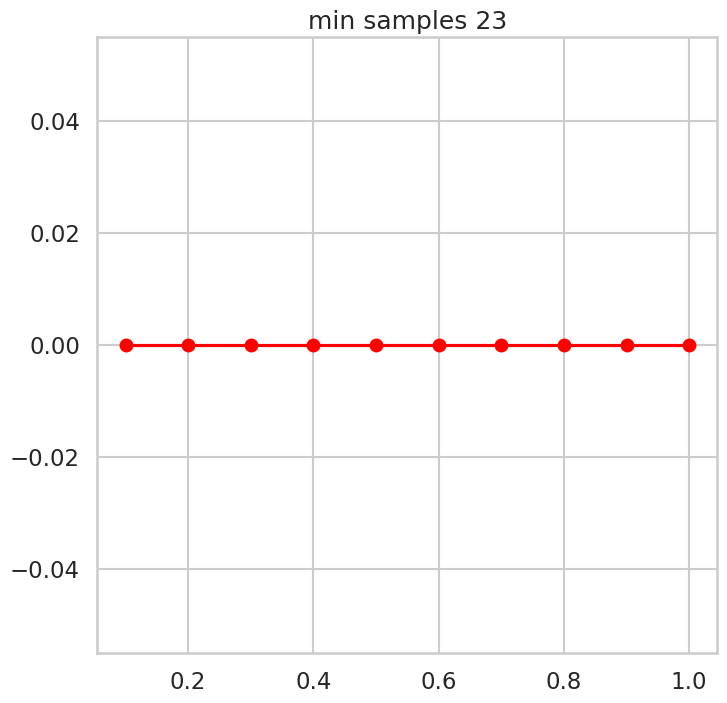

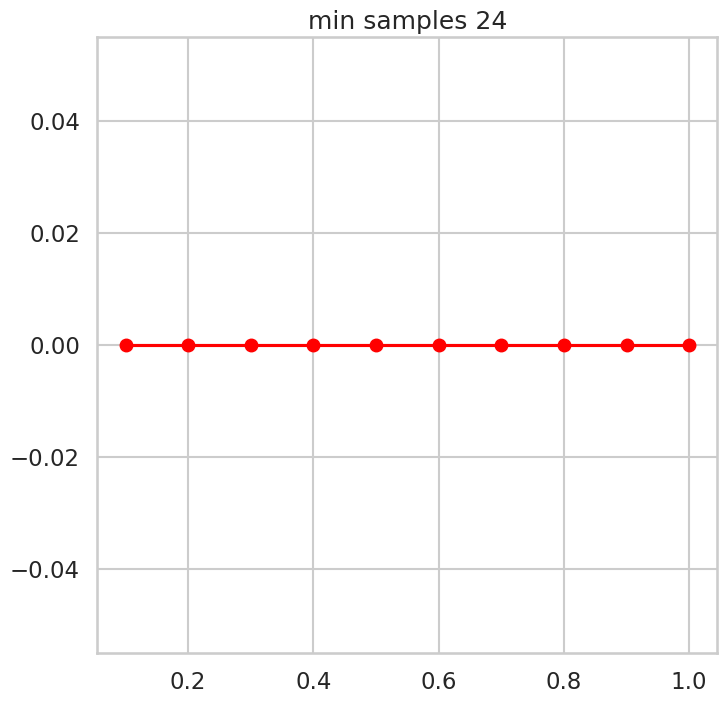

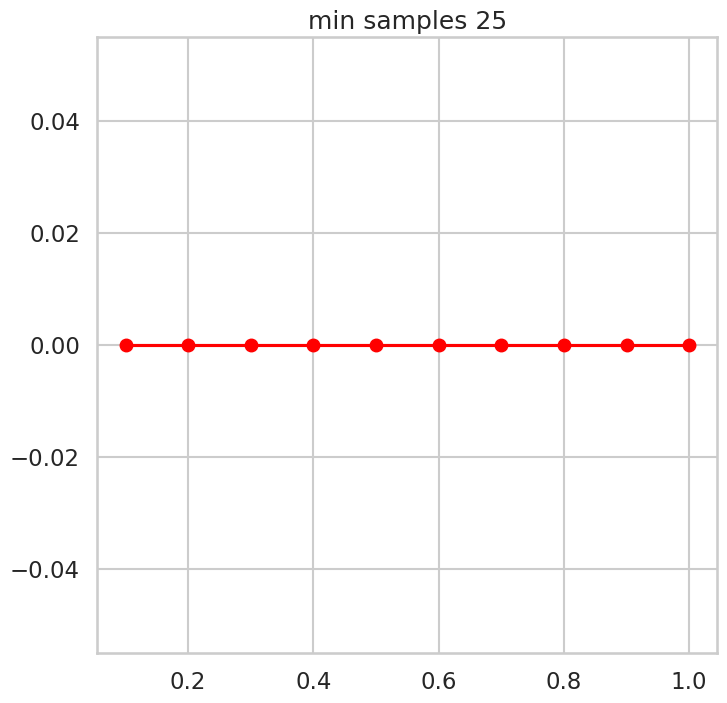

In [82]:
best_eps=0.1
best_min=5
best_s=-1
best_n_clusters = 0
for i in range(5,26):
  s = []
  for j in np.arange(0.1, 1.1, 0.1):
    dbscan = DBSCAN(eps=j, min_samples=i)
    cluster_labels = dbscan.fit_predict(df_pca)
    if len(np.unique(cluster_labels)) == 1:
      silhouette = 0
      s.append(silhouette)
      continue
    silhouette = silhouette_score(df_pca, cluster_labels)
    s.append(silhouette)
    if silhouette > best_s:
      best_eps=j
      best_min=i
      best_s=silhouette
      best_n_clusters = len(np.unique(cluster_labels))
  plt.figure()
  plt.title(f"min samples {i}")
  plt.plot(np.arange(0.1, 1.1, 0.1), s, marker='o', color='red')

print(f"DBScan clustering model with optimal parameters for this data with epsilon {best_eps} and min samples {best_min} has silhouette score {best_s} and {best_n_clusters} clusters.")

###DBScan + scaling

DBScan clustering model with optimal parameters for this data with epsilon 0.1 and min samples 5 has silhouette score 0.7191871089367805 and 52 clusters.


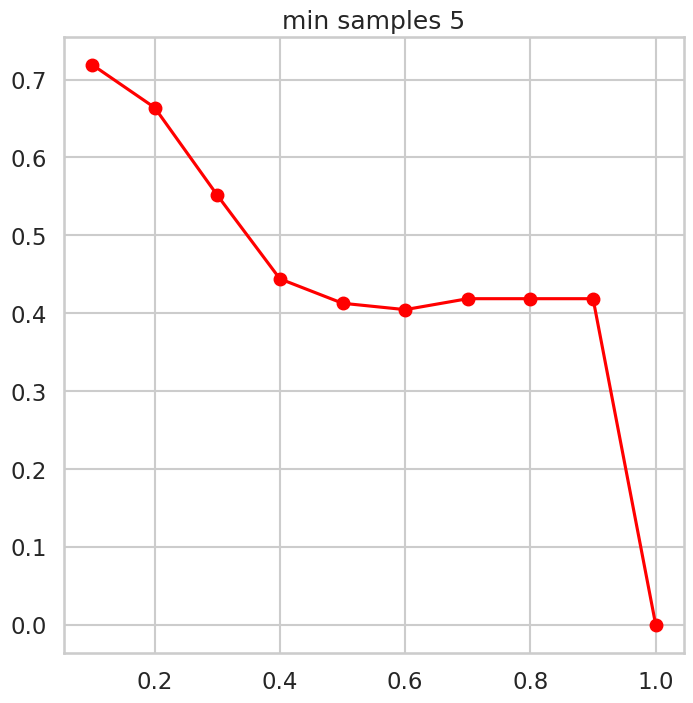

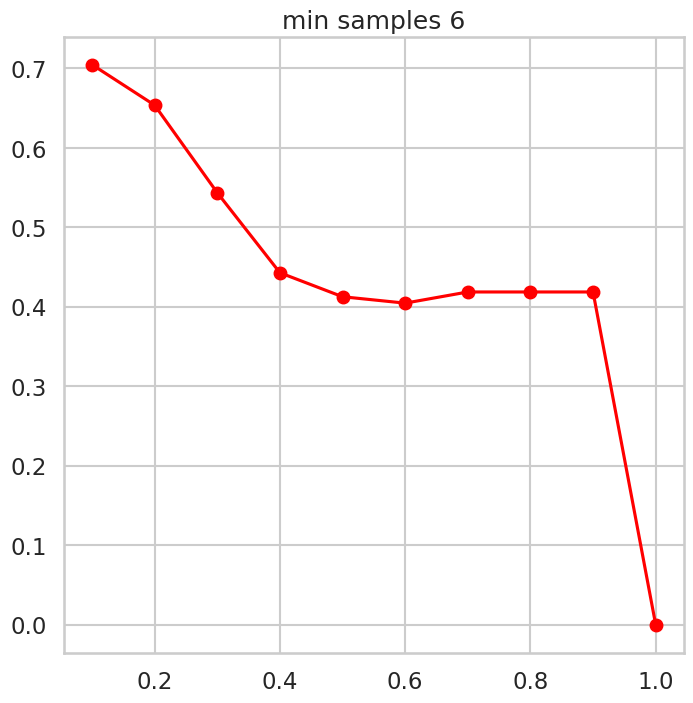

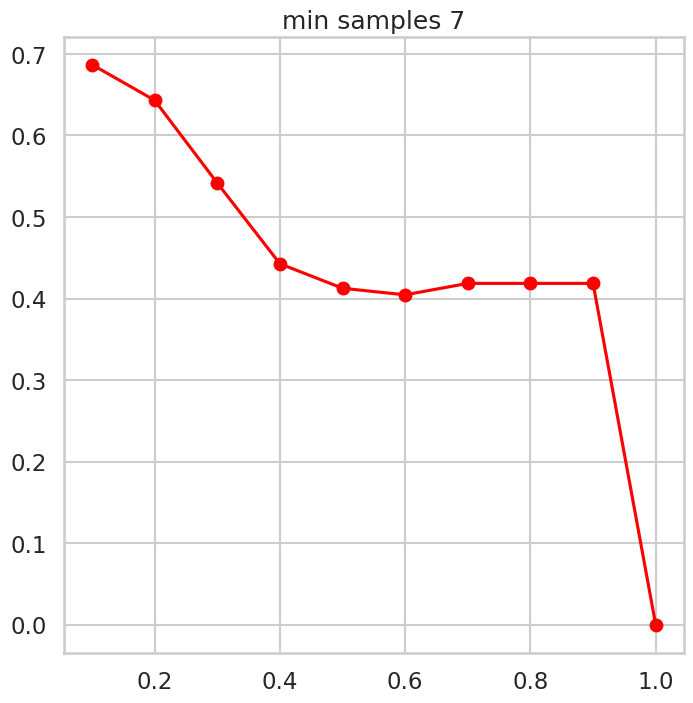

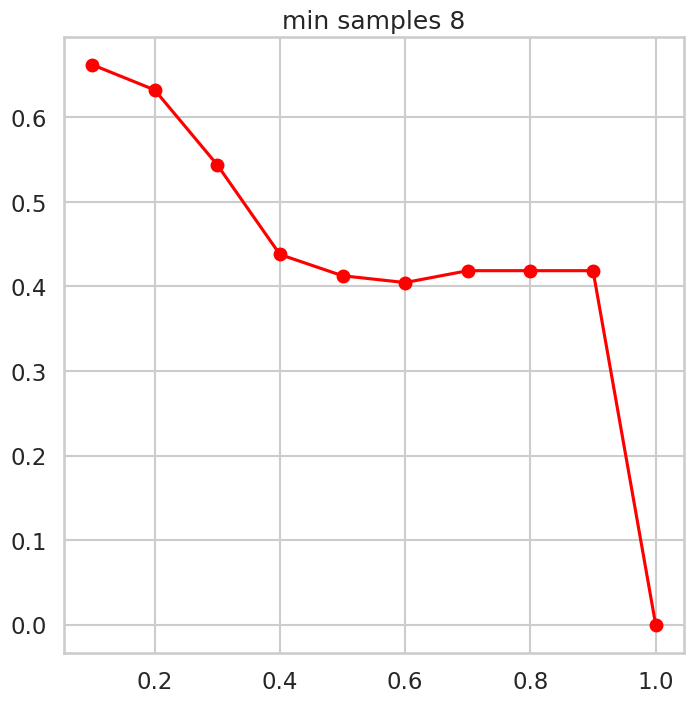

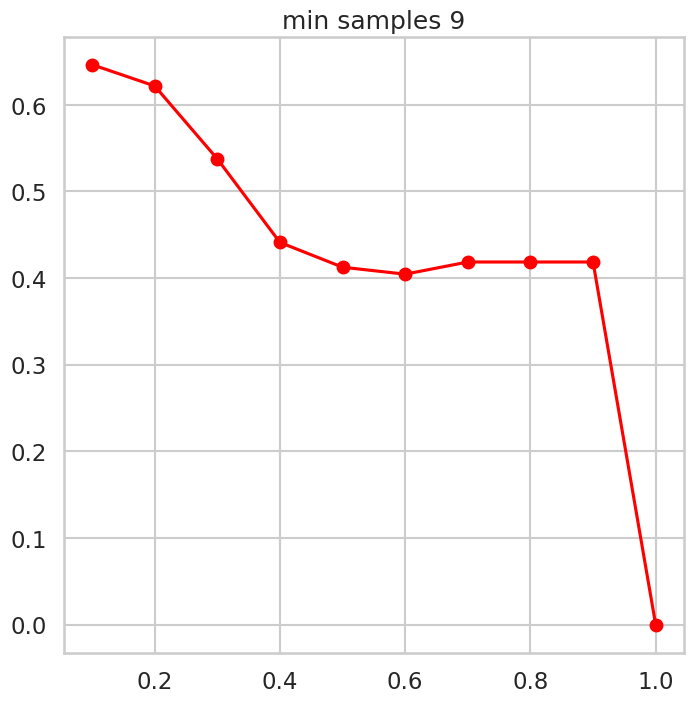

...

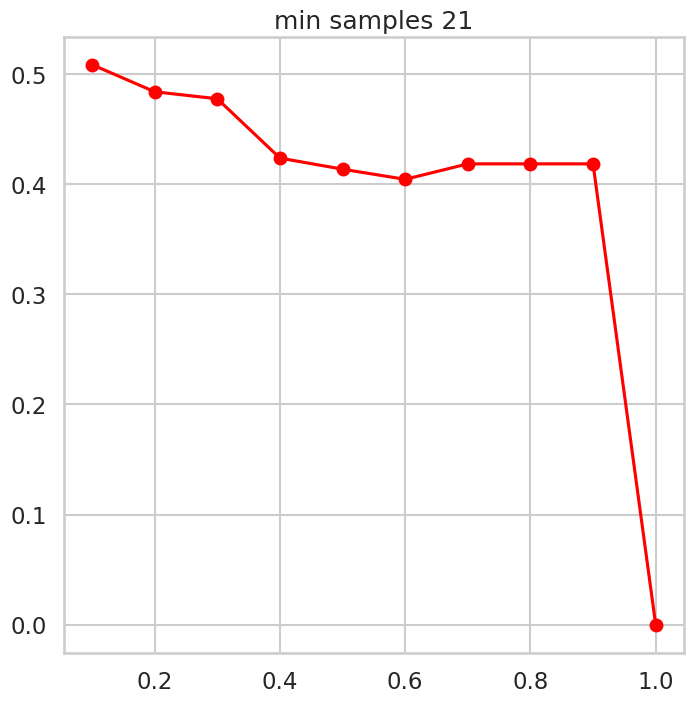

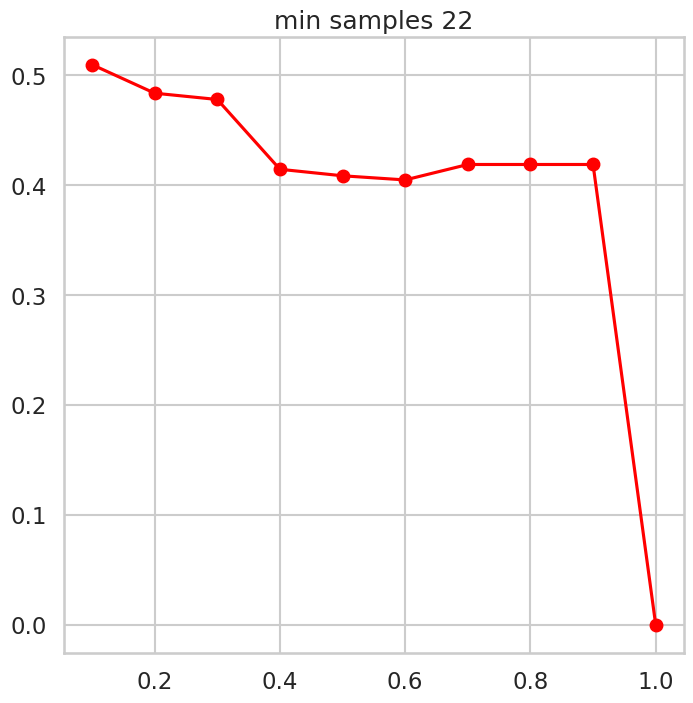

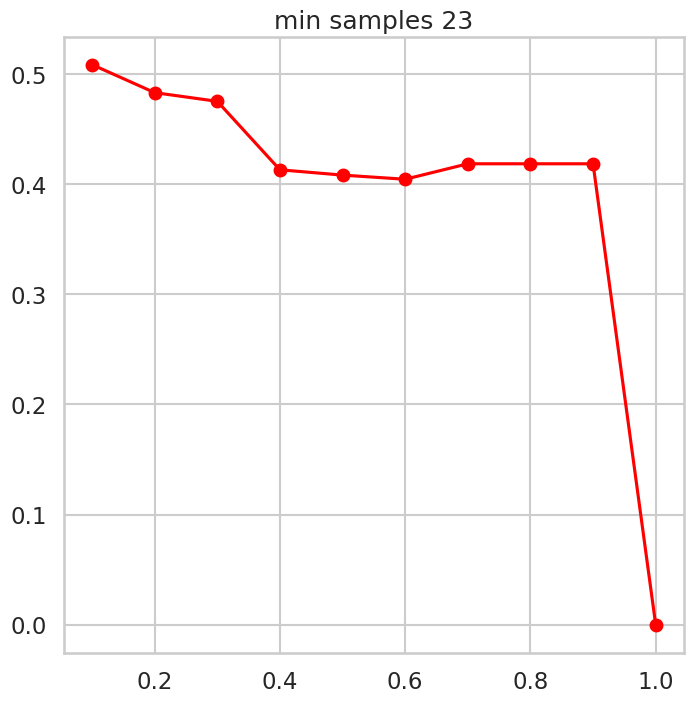

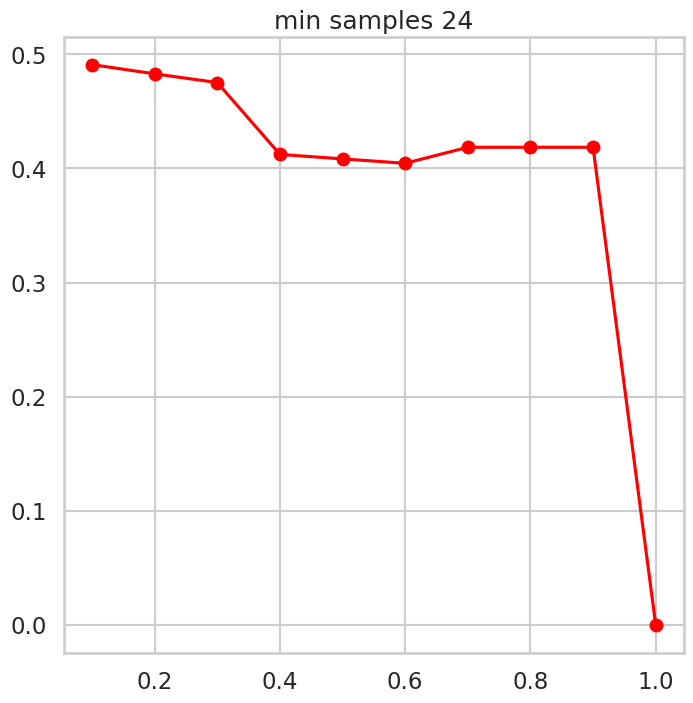

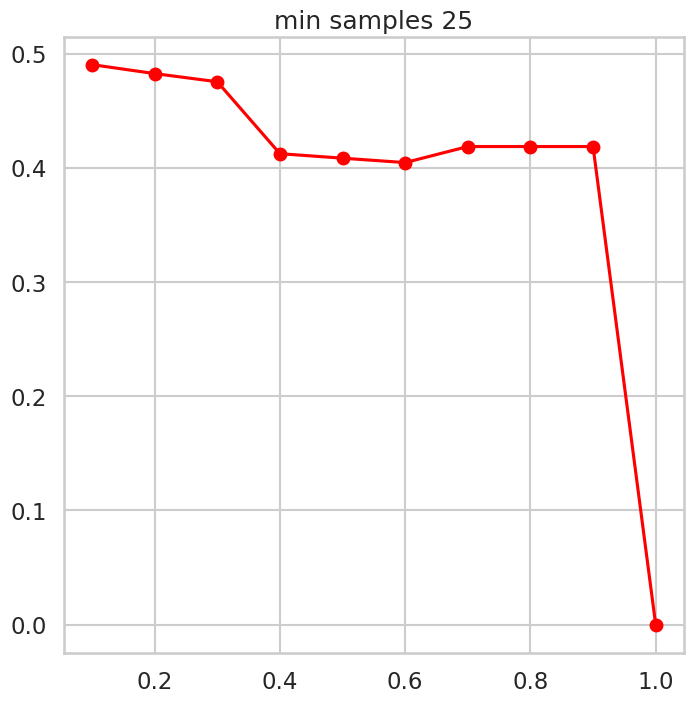

In [83]:
best_eps=0.1
best_min=5
best_s=-1
best_n_clusters = 0
for i in range(5,26):
  s = []
  for j in np.arange(0.1, 1.1, 0.1):
    dbscan = DBSCAN(eps=j, min_samples=i)
    cluster_labels = dbscan.fit_predict(df_scaled)
    if len(np.unique(cluster_labels)) == 1:
      silhouette = 0
      s.append(silhouette)
      continue
    silhouette = silhouette_score(df_scaled, cluster_labels)
    s.append(silhouette)
    if silhouette > best_s:
      best_eps=j
      best_min=i
      best_s=silhouette
      best_n_clusters = len(np.unique(cluster_labels))
  plt.figure()
  plt.title(f"min samples {i}")
  plt.plot(np.arange(0.1,1.1, 0.1), s, marker='o', color='red')
print(f"DBScan clustering model with optimal parameters for this data with epsilon {best_eps} and min samples {best_min} has silhouette score {best_s} and {best_n_clusters} clusters.")

1. non scaled data:
DBscan fails to cluster the non-scaled data (hence silhouette score -1 "initial value and data is in 1 cluster)
2. scaled data:
DBScan clustering model with optimal parameters for this data with epsilon 0.1 and min samples 5 has silhouette score 0.719 and 52 clusters.
This suggests that DBscan is overfitting the data.
3. Comparing the 3 clustering teachniques:
since we do not have prior knowledge on the original distribution of clusters, the best cluster technique that successfully clusters the data into the correct clusters cannot be determined. However, judging by the value of the silhoutte score the highest silhouette score was obtained from agglomerative with non-scaled data (0.75)